In [90]:
import ee
from drought.data import ee_climate, pipeline
from drought.visualization import plot
import drought.data.df_extensions as dfext
import drought.data.seasonal as seasonal
import drought.data.interpolate as interpolate
import geemap
import matplotlib.pyplot as plt
import pandas as pd
pd.options.mode.chained_assignment = None
import seaborn as sns
from scipy import fftpack
from scipy.fft import fft, fftfreq
import numpy as np

import importlib
importlib.reload(seasonal)
importlib.reload(plot)
importlib.reload(interpolate)

<module 'drought.data.interpolate' from '/Users/jovanaknezevic/drought-with-gedi/drought/data/interpolate.py'>

In [3]:
ee.Initialize()

### Load climate and GEDI data

This data has been pre-generated and saved in CSV files. For GEDI data generation, take a look at GEDIDataProcessing notebook. For climate data generation, look at the bottom sections of this notebook.

In [102]:
# Dates of interest, inclusive.
climate_start_date = '2010-01-01'
climate_end_date = '2022-05-01'
climate_columns = [*ee_climate.CLIMATE_COLUMNS, 'P-ET', 'P-PET']

# GEDI data is only available in the 2019-2022 range.
gedi_start_date = '2019-05-01'
gedi_end_date = '2022-05-01'

In [96]:
climate = pd.read_csv('../../data/interim/monthly_means_timeseries_of_climate_vars_01-2010_to_11-2022.csv', index_col=0)
gedi = pd.read_csv("../../data/interim/gedi_monthly_interpolated_via_weighted_average.csv", index_col=0)

# Add datetime column to gedi df.
gedi = dfext.add_datetime_column(gedi)
# Limit GEDI range to matches the dates above, to avoid NaN values in the interpolated PAI values.
gedi = gedi[(gedi.datetime >= gedi_start_date) & (gedi.datetime <= gedi_end_date)]

# Cutoff climate data until the gedi end date as well, both because having climate data later is useless, and because we've seen weird radiation values in September and October of 2022.
climate = climate[climate.datetime <= gedi_end_date]

## Seasonal Decomposition

For both climate and vegetation timeseries, we will run seasonal decomposition to break down each timeseries into three components - seasonal, trend and reminder. We do this using STL method from ```statsmodels.tsa.seasonal``` library.

In this section, we focus on looking at seasonal components only. 

In [97]:
# Some climate data is missing in individual months, mostly fpar and temperature in some of the moist regions (polygons 1 and 2).
# We linearly interpolate each climate column, because NaN values will prevent us from doing seasonal decomposition.
climate = interpolate.interpolate_using_linear(climate, climate_columns)

# We're only using 'pai_interpolated' column. This has already been interpolated
# using weighted averages. However, polygon 3 still has missing data, so we use 
# linear interpolation to fill the gaps - but polygon 3 shoult not really be used as the data quality is bad.
gedi = interpolate.interpolate_using_linear(gedi, ['pai_interpolated'])

<AxesSubplot: xlabel='datetime', ylabel='precipitation'>

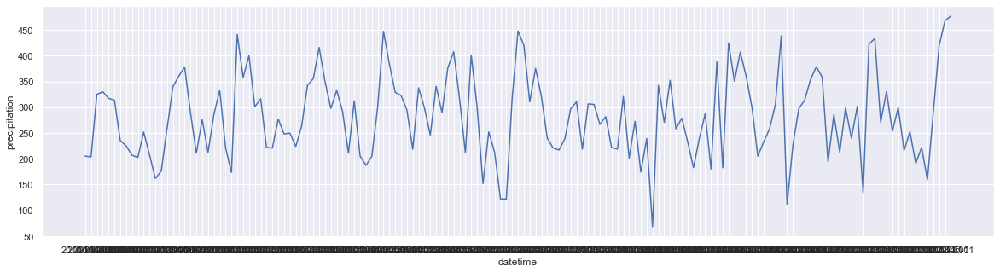

In [99]:
# Quick plot to visualize each climate parameter. You can substitute polygon_id and y = column name of a climate variable of interest.
plt.rcParams['figure.figsize'] = [20, 5]
sns.lineplot(climate[(climate.polygon_id==1)], x='datetime', y='precipitation')

<AxesSubplot: xlabel='datetime', ylabel='pai_interpolated'>

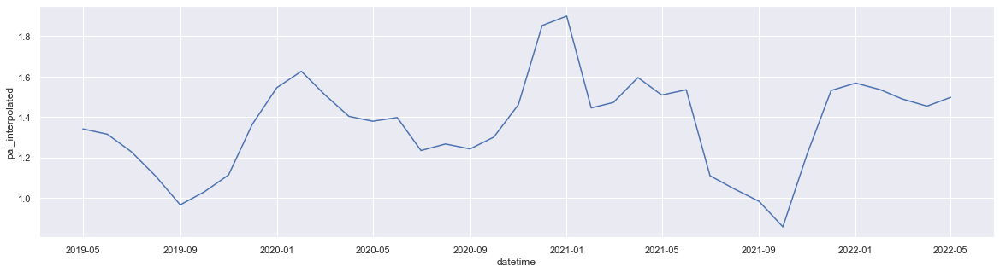

In [100]:
# Quick plot to visualize each climate parameter. You can substitute polygon_id and y = column name of a climate variable of interest.
plt.rcParams['figure.figsize'] = [20, 5]
sns.lineplot(gedi[gedi.polygon_id==8], x='datetime', y='pai_interpolated')

In [103]:
# Do seasonal decomp.
climate_seasonal = seasonal.get_ts_seasonal_component_per_polygon(climate, climate_start_date, climate_end_date, columns=climate_columns)
gedi_seasonal = seasonal.get_ts_seasonal_component_per_polygon(gedi, gedi_start_date, gedi_end_date, columns=['pai_interpolated'])

#### Plot Seasonal vs. Original signal

In [361]:
climate['datetime'] = climate.datetime.astype(np.datetime64)

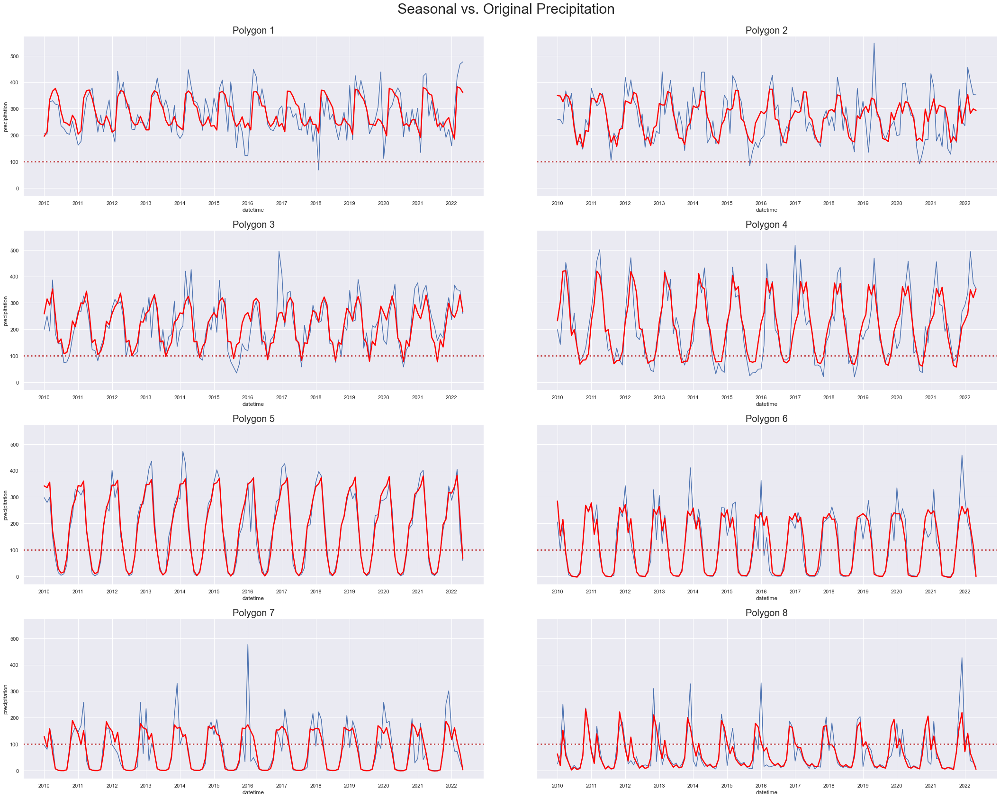

In [363]:
fig, ax = plot.plot_per_polygon(climate, plot_func=lambda df, ax: sns.lineplot(df, x='datetime', y='precipitation', ax=ax), title='Seasonal vs. Original Precipitation', sharey=True)
fig, ax = plot.plot_per_polygon(climate_seasonal, plot_func=lambda df, ax: sns.lineplot(df, x='datetime', y='precipitation', ax=ax, color='red', linewidth=2.5), title='', fig=fig, ax=ax, sharey=True)
for lala in ax:
    for bla in lala:
        bla.axhline(y=100, color = 'r', linestyle = 'dotted', linewidth=3)
        locator = mdates.AutoDateLocator(minticks=10, maxticks=17)
        bla.xaxis.set_major_locator(locator) 
        bla.xaxis.set_major_formatter(mdates.ConciseDateFormatter(locator))  
plt.savefig('image.png')

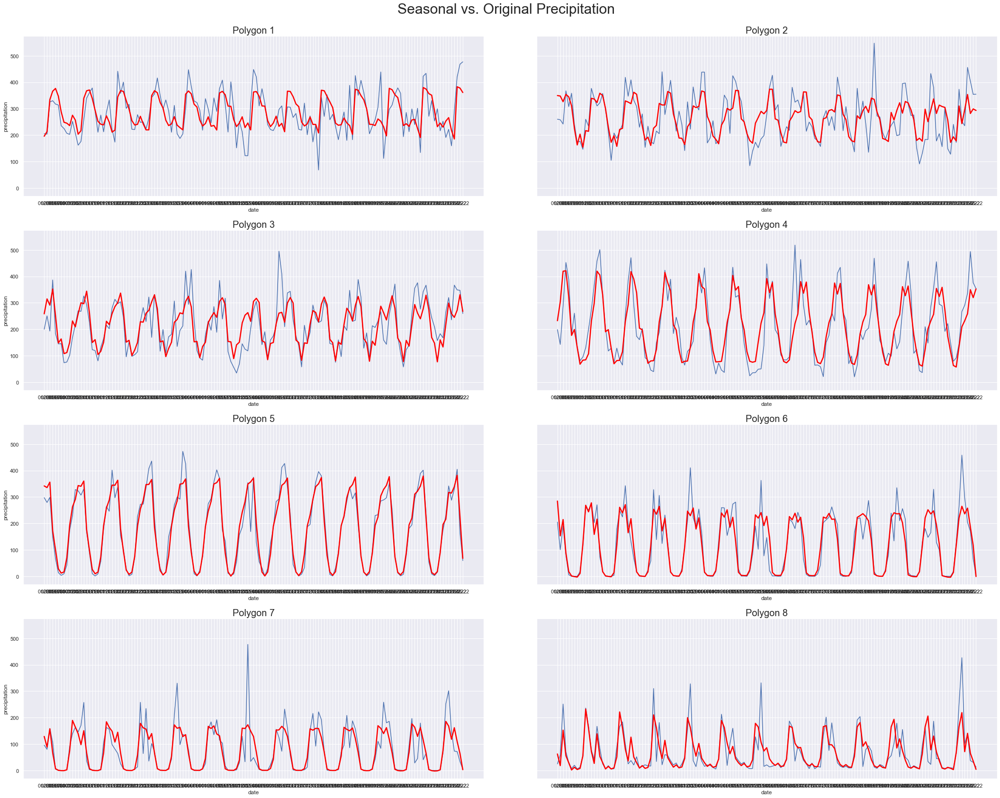

In [119]:
fig, ax = plot.plot_per_polygon(climate, plot_func=lambda df, ax: sns.lineplot(df, x='date', y='precipitation', ax=ax), title='Seasonal vs. Original Precipitation', sharey=True)
fig, ax = plot.plot_per_polygon(climate_seasonal, plot_func=lambda df, ax: sns.lineplot(df, x='date', y='precipitation', ax=ax, color='red', linewidth=2.5), title='', fig=fig, ax=ax, sharey=True)
for lala in ax:
    for bla in lala:
        bla.axhline(y=100, color = 'r', linestyle = 'dotted', linewidth=3)
        locator = mdates.AutoDateLocator(minticks=10, maxticks=17)
        bla.xaxis.set_major_locator(locator) 
        bla.xaxis.set_major_formatter(mdates.ConciseDateFormatter(locator))  

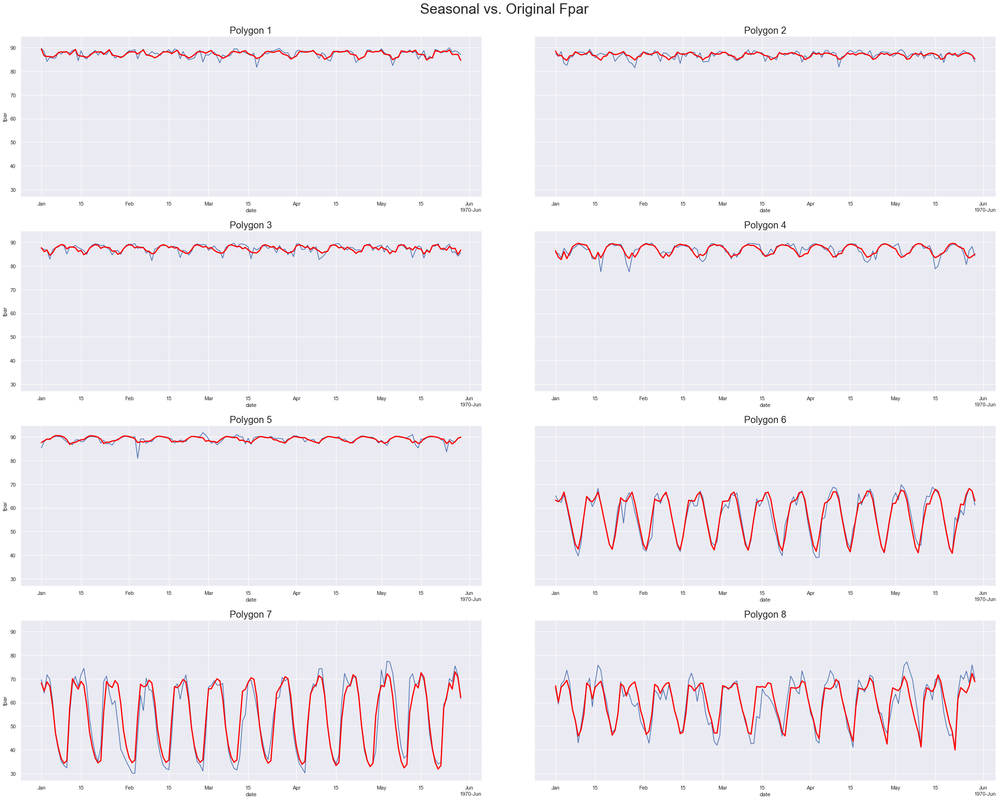

In [365]:
fig, ax = plot.plot_per_polygon(climate, plot_func=lambda df, ax: sns.lineplot(df, x='date', y='fpar', ax=ax), title='Seasonal vs. Original Fpar', sharey=True)
fig, ax = plot.plot_per_polygon(climate_seasonal, plot_func=lambda df, ax: sns.lineplot(df, x='date', y='fpar', ax=ax, color='red', linewidth=2.5), title='', fig=fig, ax=ax, sharey=True)
for lala in ax:
    for bla in lala:
        locator = mdates.AutoDateLocator(minticks=10, maxticks=17)
        bla.xaxis.set_major_locator(locator) 
        bla.xaxis.set_major_formatter(mdates.ConciseDateFormatter(locator))  
plt.savefig('image.png')

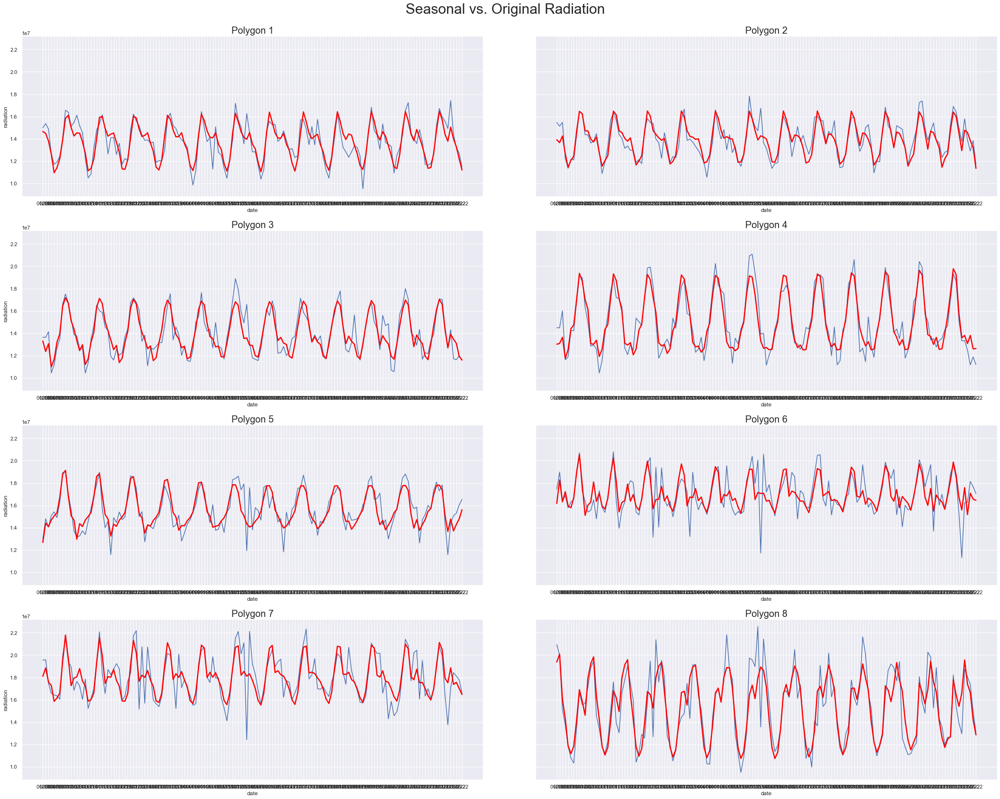

In [121]:
fig, ax = plot.plot_per_polygon(climate, plot_func=lambda df, ax: sns.lineplot(df, x='date', y='radiation', ax=ax), title='Seasonal vs. Original Radiation', sharey=True)
fig, ax = plot.plot_per_polygon(climate_seasonal, plot_func=lambda df, ax: sns.lineplot(df, x='date', y='radiation', ax=ax, color='red', linewidth=2.5), title='', fig=fig, ax=ax, sharey=True)

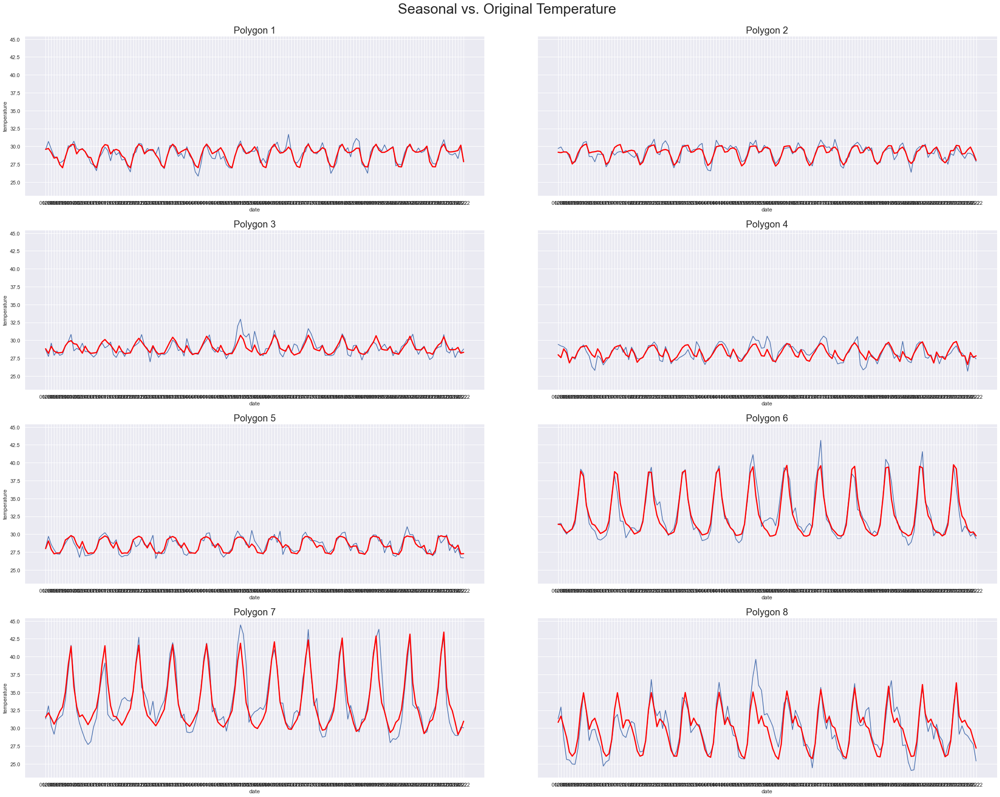

In [122]:
fig, ax = plot.plot_per_polygon(climate, plot_func=lambda df, ax: sns.lineplot(df, x='date', y='temperature', ax=ax), title='Seasonal vs. Original Temperature', sharey=True)
fig, ax = plot.plot_per_polygon(climate_seasonal, plot_func=lambda df, ax: sns.lineplot(df, x='date', y='temperature', ax=ax, color='red', linewidth=2.5), title='', fig=fig, ax=ax, sharey=True)

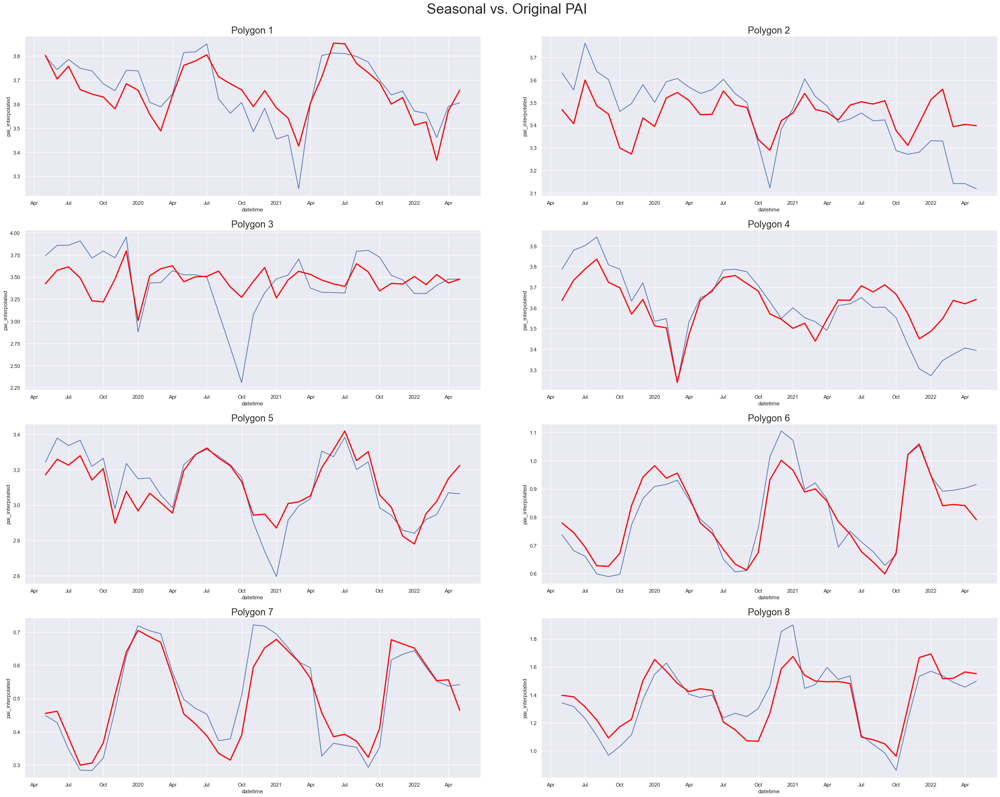

In [366]:
fig, ax = plot.plot_per_polygon(gedi, plot_func=lambda df, ax: sns.lineplot(df, x='datetime', y='pai_interpolated', ax=ax), title='Seasonal vs. Original PAI')
fig, ax = plot.plot_per_polygon(gedi_seasonal, plot_func=lambda df, ax: sns.lineplot(df, x='datetime', y='pai_interpolated', ax=ax, color='red', linewidth=2.5), title='', fig=fig, ax=ax)

for lala in ax:
    for bla in lala:
        locator = mdates.AutoDateLocator(minticks=10, maxticks=17)
        bla.xaxis.set_major_locator(locator) 
        bla.xaxis.set_major_formatter(mdates.ConciseDateFormatter(locator))  
plt.savefig('image.png')

### Plot climate vs. pai waveforms for each polygon (except 3, because that one sucks)

<AxesSubplot: xlabel='date', ylabel='fpar'>

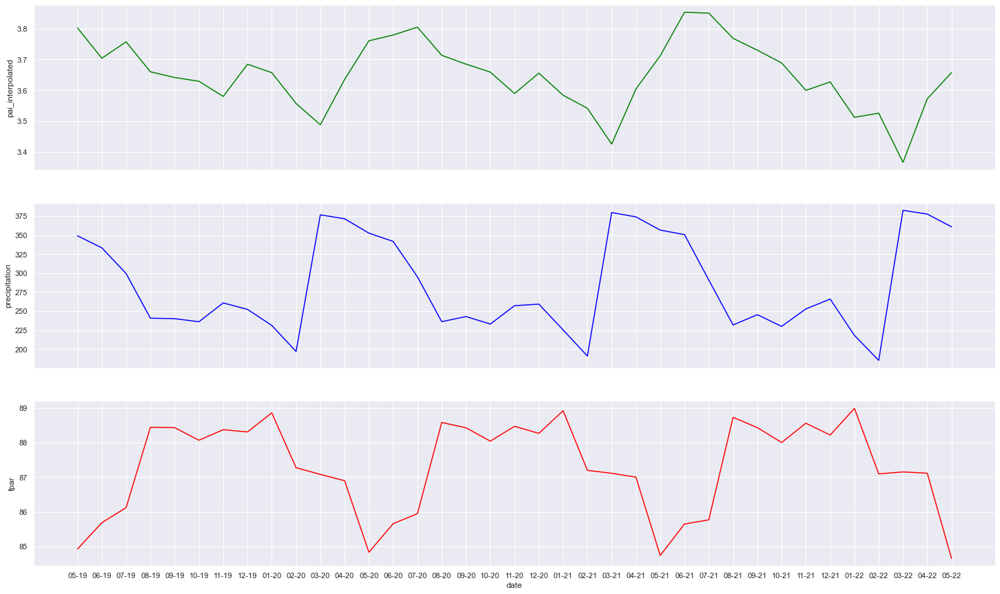

In [148]:
# Polygon 1.
polygon_id = 1
fig, ax = plt.subplots(3, figsize=(25, 15), sharey=False, sharex=True)
polygon_climate = climate_seasonal[(climate_seasonal.polygon_id==polygon_id) & (climate_seasonal.datetime >= gedi_start_date)]
polygon_gedi = gedi_seasonal[gedi_seasonal.polygon_id==polygon_id]

# Plot
sns.lineplot(polygon_gedi, x='date', y='pai_interpolated', color='green', ax=ax[0])
#plt.show()
sns.lineplot(polygon_climate, x='date', y='precipitation', color='blue', ax=ax[1])
#plt.show()
sns.lineplot(polygon_climate, x='date', y='fpar', color='red', ax=ax[2])


<AxesSubplot: xlabel='date', ylabel='fpar'>

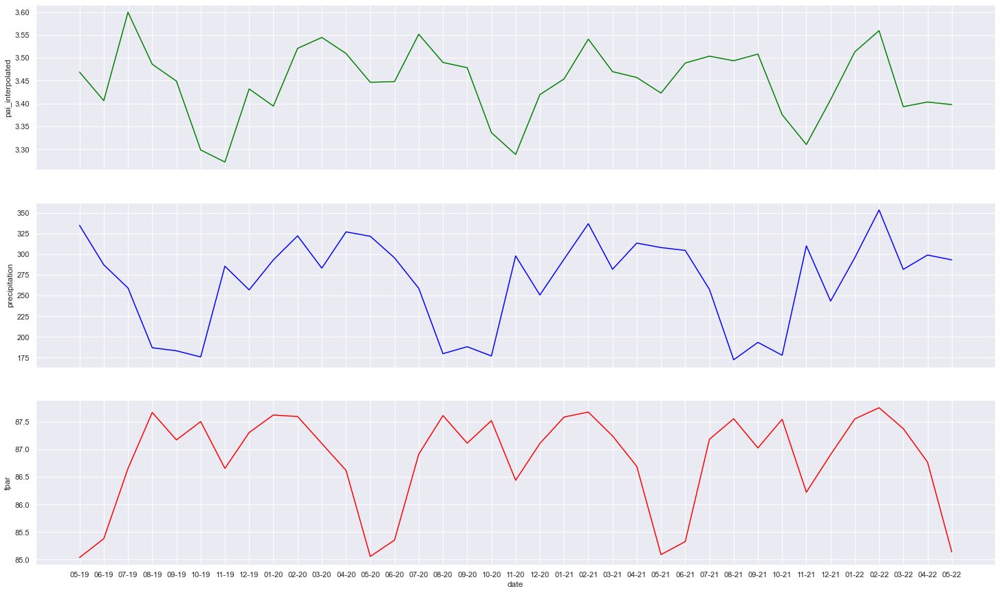

In [149]:
# Polygon 2.
polygon_id = 2
fig, ax = plt.subplots(3, figsize=(25, 15), sharey=False, sharex=True)
polygon_climate = climate_seasonal[(climate_seasonal.polygon_id==polygon_id) & (climate_seasonal.datetime >= gedi_start_date)]
polygon_gedi = gedi_seasonal[gedi_seasonal.polygon_id==polygon_id]

# Plot
sns.lineplot(polygon_gedi, x='date', y='pai_interpolated', color='green', ax=ax[0])
#plt.show()
sns.lineplot(polygon_climate, x='date', y='precipitation', color='blue', ax=ax[1])
#plt.show()
sns.lineplot(polygon_climate, x='date', y='fpar', color='red', ax=ax[2])


<AxesSubplot: xlabel='date', ylabel='fpar'>

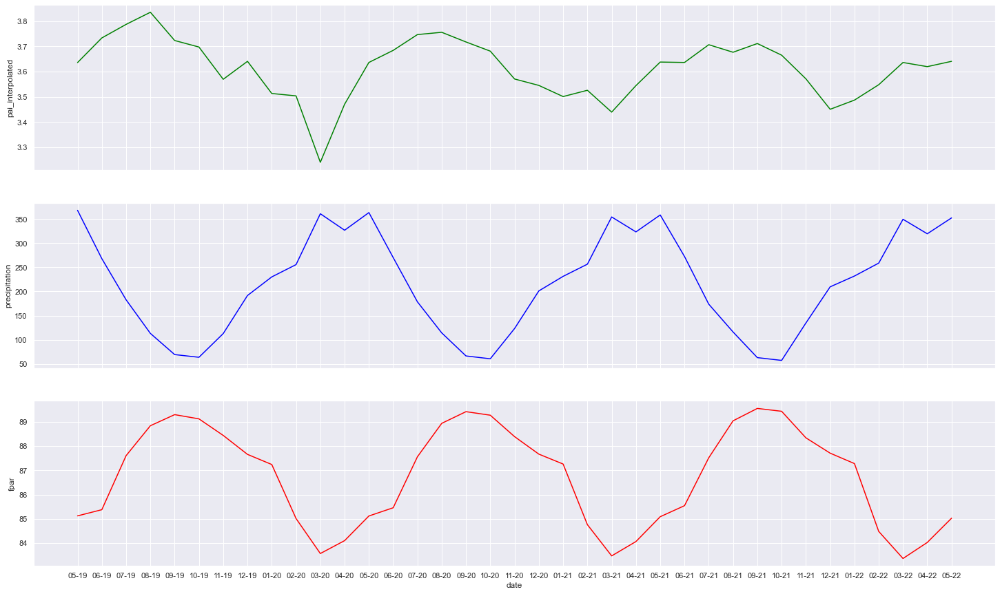

In [150]:
# Polygon 4.
polygon_id = 4
fig, ax = plt.subplots(3, figsize=(25, 15), sharey=False, sharex=True)
polygon_climate = climate_seasonal[(climate_seasonal.polygon_id==polygon_id) & (climate_seasonal.datetime >= gedi_start_date)]
polygon_gedi = gedi_seasonal[gedi_seasonal.polygon_id==polygon_id]

# Plot
sns.lineplot(polygon_gedi, x='date', y='pai_interpolated', color='green', ax=ax[0])
#plt.show()
sns.lineplot(polygon_climate, x='date', y='precipitation', color='blue', ax=ax[1])
#plt.show()
sns.lineplot(polygon_climate, x='date', y='fpar', color='red', ax=ax[2])


<AxesSubplot: xlabel='date', ylabel='fpar'>

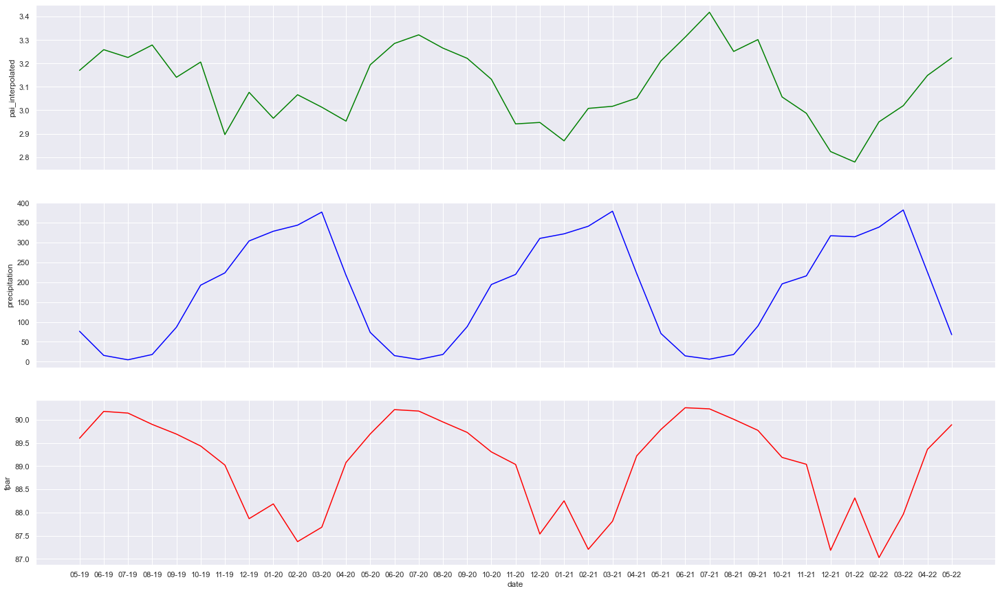

In [151]:
# Polygon 5.
polygon_id = 5
fig, ax = plt.subplots(3, figsize=(25, 15), sharey=False, sharex=True)
polygon_climate = climate_seasonal[(climate_seasonal.polygon_id==polygon_id) & (climate_seasonal.datetime >= gedi_start_date)]
polygon_gedi = gedi_seasonal[gedi_seasonal.polygon_id==polygon_id]

# Plot
sns.lineplot(polygon_gedi, x='date', y='pai_interpolated', color='green', ax=ax[0])
#plt.show()
sns.lineplot(polygon_climate, x='date', y='precipitation', color='blue', ax=ax[1])
#plt.show()
sns.lineplot(polygon_climate, x='date', y='fpar', color='red', ax=ax[2])


<AxesSubplot: xlabel='date', ylabel='fpar'>

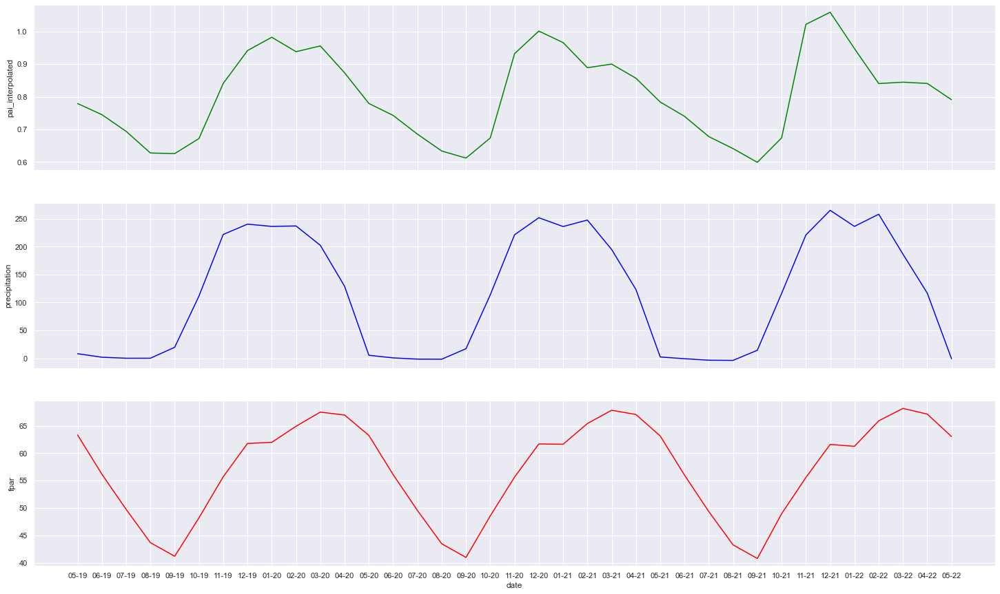

In [152]:
# Polygon 6.
polygon_id = 6
fig, ax = plt.subplots(3, figsize=(25, 15), sharey=False, sharex=True)
polygon_climate = climate_seasonal[(climate_seasonal.polygon_id==polygon_id) & (climate_seasonal.datetime >= gedi_start_date)]
polygon_gedi = gedi_seasonal[gedi_seasonal.polygon_id==polygon_id]

# Plot
sns.lineplot(polygon_gedi, x='date', y='pai_interpolated', color='green', ax=ax[0])
#plt.show()
sns.lineplot(polygon_climate, x='date', y='precipitation', color='blue', ax=ax[1])
#plt.show()
sns.lineplot(polygon_climate, x='date', y='fpar', color='red', ax=ax[2])


<AxesSubplot: xlabel='date', ylabel='fpar'>

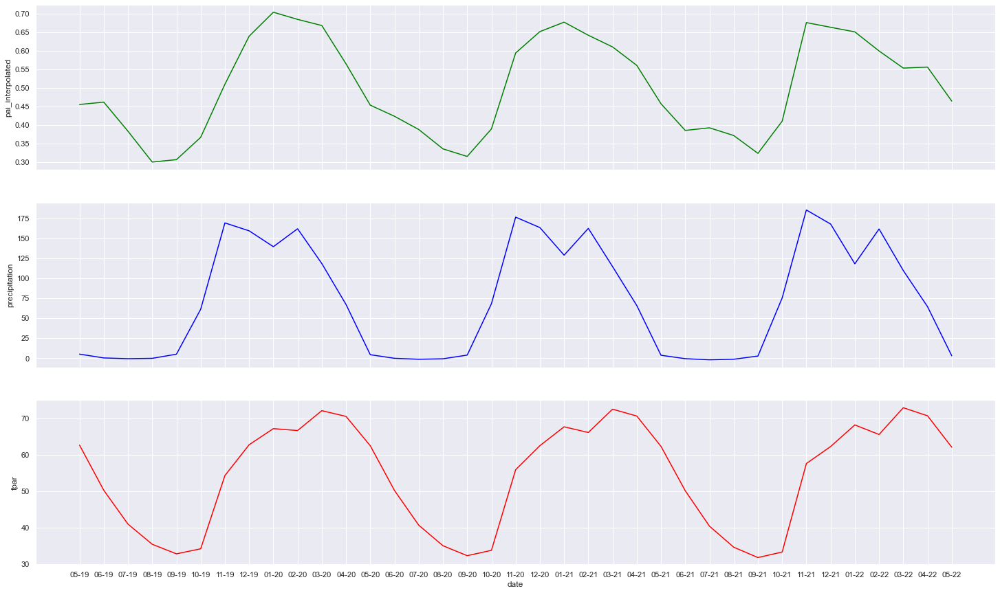

In [153]:
# Polygon 7.
polygon_id = 7
fig, ax = plt.subplots(3, figsize=(25, 15), sharey=False, sharex=True)
polygon_climate = climate_seasonal[(climate_seasonal.polygon_id==polygon_id) & (climate_seasonal.datetime >= gedi_start_date)]
polygon_gedi = gedi_seasonal[gedi_seasonal.polygon_id==polygon_id]

# Plot
sns.lineplot(polygon_gedi, x='date', y='pai_interpolated', color='green', ax=ax[0])
#plt.show()
sns.lineplot(polygon_climate, x='date', y='precipitation', color='blue', ax=ax[1])
#plt.show()
sns.lineplot(polygon_climate, x='date', y='fpar', color='red', ax=ax[2])


<AxesSubplot: xlabel='date', ylabel='fpar'>

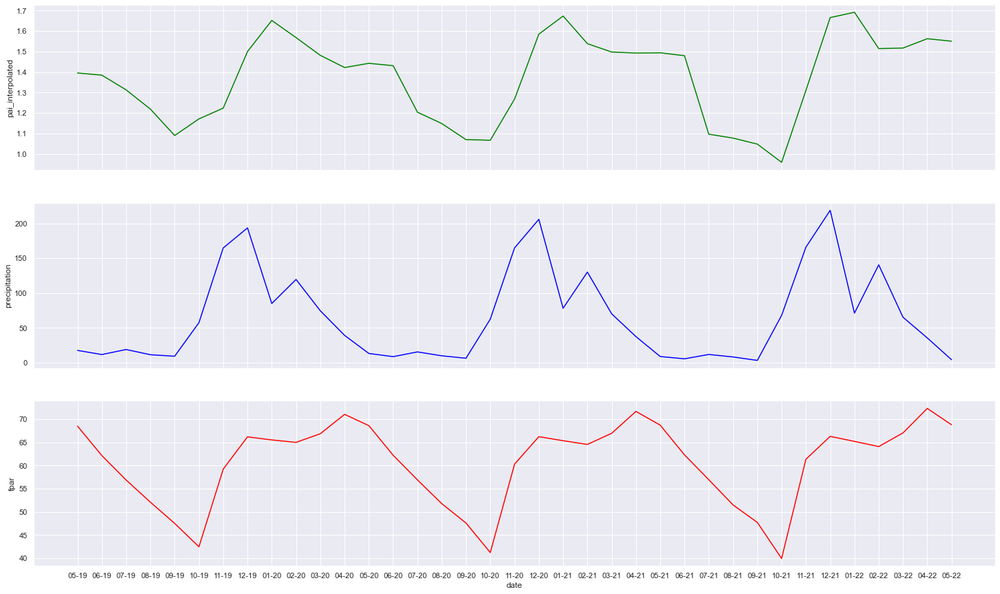

In [154]:
# Polygon 8.
polygon_id = 8
fig, ax = plt.subplots(3, figsize=(25, 15), sharey=False, sharex=True)
polygon_climate = climate_seasonal[(climate_seasonal.polygon_id==polygon_id) & (climate_seasonal.datetime >= gedi_start_date)]
polygon_gedi = gedi_seasonal[gedi_seasonal.polygon_id==polygon_id]

# Plot
sns.lineplot(polygon_gedi, x='date', y='pai_interpolated', color='green', ax=ax[0])
#plt.show()
sns.lineplot(polygon_climate, x='date', y='precipitation', color='blue', ax=ax[1])
#plt.show()
sns.lineplot(polygon_climate, x='date', y='fpar', color='red', ax=ax[2])


### Plot yearly aggregate waves

### Helper methods for calculating relationship between climate vars and vegetation

In [291]:
def join_and_shift_data(climate_data, gedi_data, polygon_id):
    # Polygon 1.
    columns = ['temperature', 'radiation', 'fpar', 'P-PET', 'precipitation']
    polygon_climate = climate_data[(climate_data.polygon_id==polygon_id) & (climate_data.datetime >= gedi_start_date)]
    polygon_gedi = gedi_data[gedi_data.polygon_id==polygon_id]

    polygon_join = polygon_climate.set_index('date')[[*columns]].join(polygon_gedi.set_index('date')[['pai_interpolated', 'month']])
    for i in range(-2, 3):
        if i==0:
            continue
        for column in columns:
            polygon_join[f"{column}_{i}"] = polygon_join[column].shift(i)
    return polygon_join

In [197]:
def get_correlations(joined_df):
    correlations = joined_df.corr()
    correlations['pai_abs'] = correlations.pai_interpolated.abs()
    correlations = correlations.sort_values('pai_abs', ascending=False)
    return correlations['pai_interpolated']

### Calculate correlations in the original signal

### Calculate correlations between seasonal components

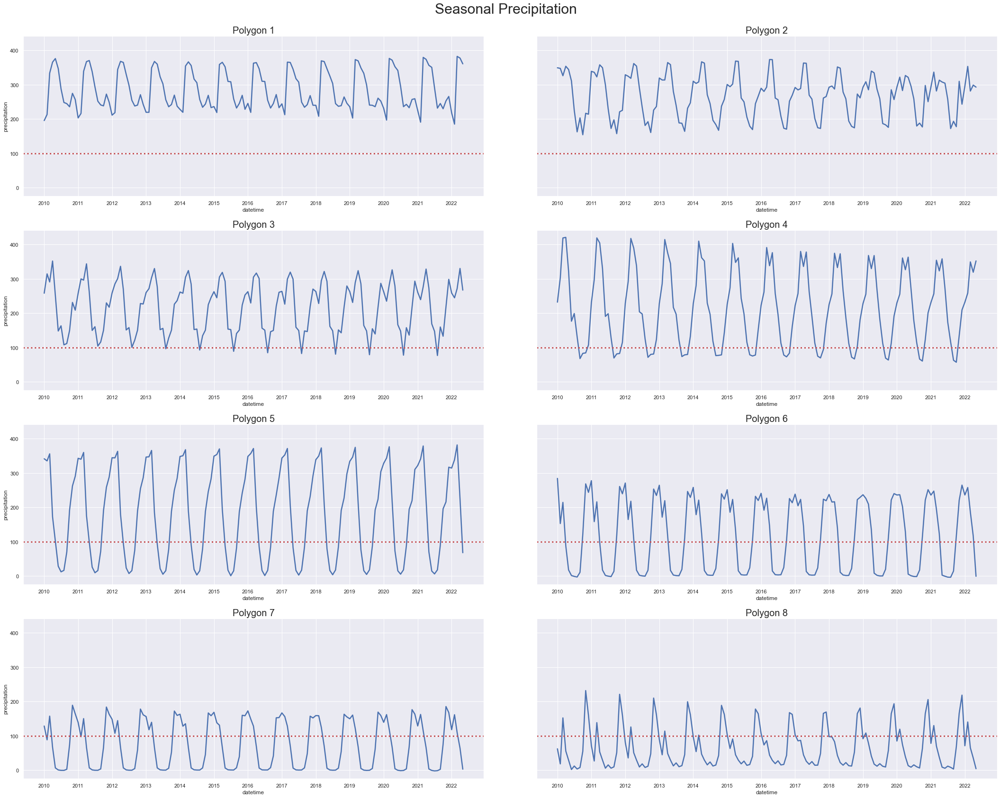

In [352]:
import matplotlib.dates as mdates
sns.set_style({'axes.grid' : True})
fig, ax = plot.plot_per_polygon(climate_seasonal, plot_func=lambda df, ax: sns.lineplot(df, x='datetime', y='precipitation', ax=ax, linewidth=2.5), title='Seasonal Precipitation', sharey=True)
for lala in ax:
    for bla in lala:
        bla.axhline(y=100, color = 'r', linestyle = 'dotted', linewidth=3)
        locator = mdates.AutoDateLocator(minticks=10, maxticks=17)
        bla.xaxis.set_major_locator(locator) 
        bla.xaxis.set_major_formatter(mdates.ConciseDateFormatter(locator))  
plt.savefig('image.png')

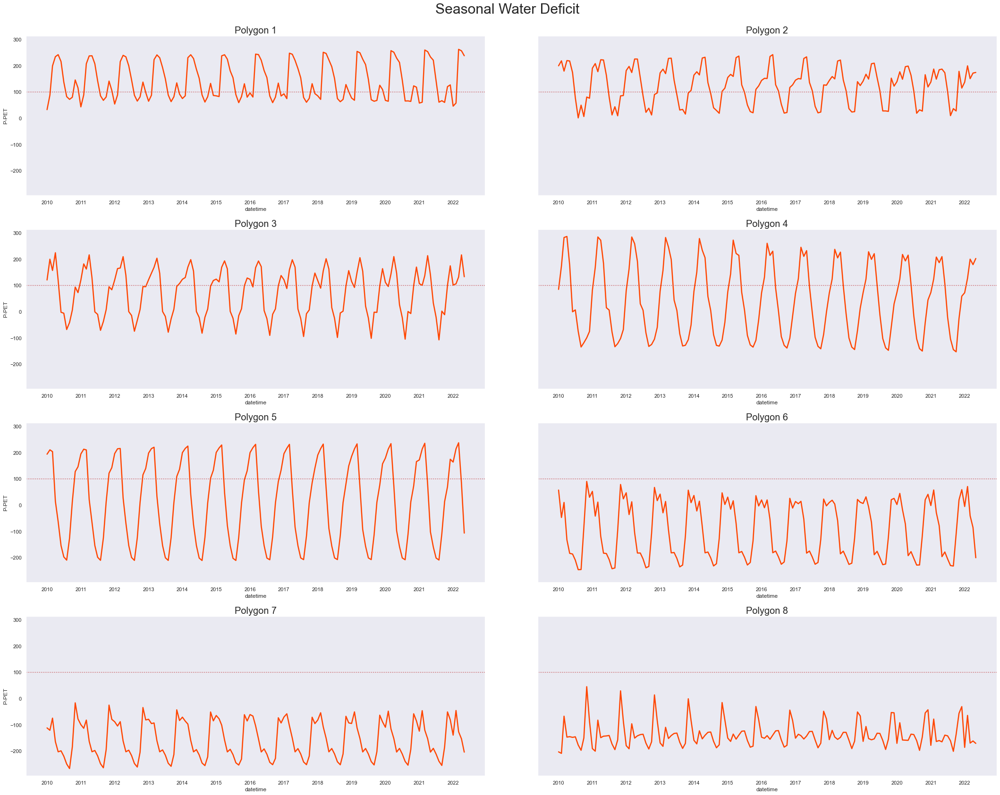

In [350]:
import matplotlib.dates as mdates
fig, ax = plot.plot_per_polygon(climate_seasonal, plot_func=lambda df, ax: sns.lineplot(df, x='datetime', y='P-PET', ax=ax, linewidth=2.5, color='orangered'), title='Seasonal Water Deficit', sharey=True)
for lala in ax:
    for bla in lala:
        bla.axhline(y=100, color = 'r', linestyle = 'dotted')
        locator = mdates.AutoDateLocator(minticks=10, maxticks=17)
        bla.xaxis.set_major_locator(locator) 
        bla.xaxis.set_major_formatter(mdates.ConciseDateFormatter(locator))  
plt.savefig('image.png')

##### Polygon 1

In [265]:
# Polygon 1.
join_polygon_1 = join_and_shift_data(climate_seasonal, gedi_seasonal, 1)
get_correlations(join_polygon_1).head()

pai_interpolated    1.000000
fpar_2             -0.725705
precipitation_2     0.709732
P-PET_2             0.706340
radiation_-2        0.647596
Name: pai_interpolated, dtype: float64

Seasonal pai negatively correlates with 2 month delayed FPAR, and positively with 2 month delayed precipitation.

<AxesSubplot: xlabel='date', ylabel='precipitation'>

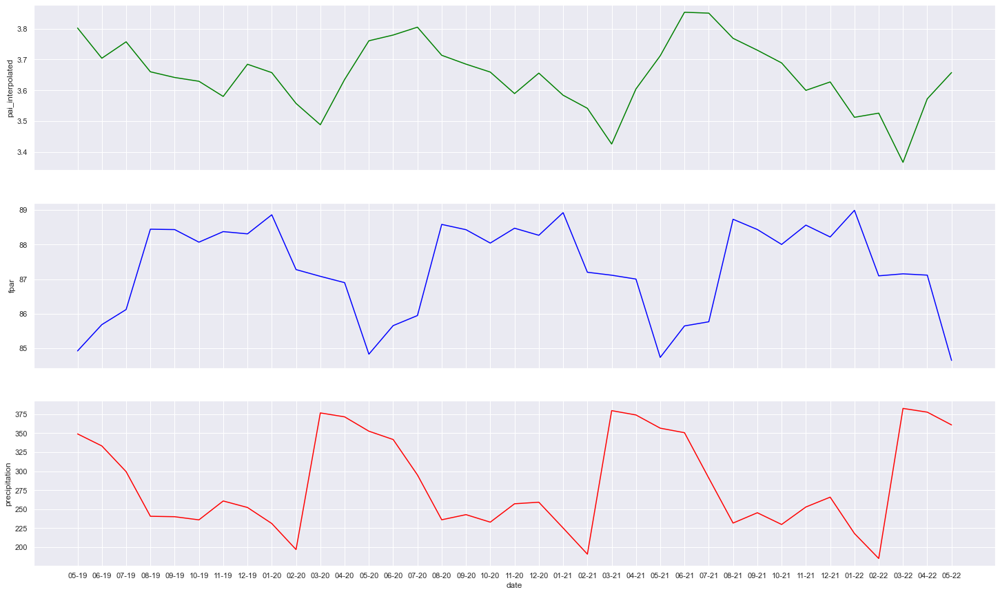

In [204]:
fig, ax = plt.subplots(3, figsize=(25, 15), sharey=False, sharex=True)

# Plot
sns.lineplot(join_polygon_1, x='date', y='pai_interpolated', color='green', ax=ax[0])
sns.lineplot(join_polygon_1, x='date', y='fpar', color='blue', ax=ax[1])
sns.lineplot(join_polygon_1, x='date', y='precipitation', color='red', ax=ax[2])


<AxesSubplot: xlabel='month', ylabel='pai_interpolated'>

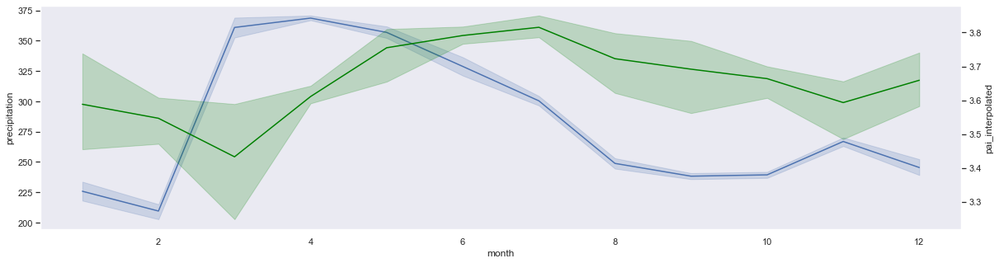

In [279]:
sns.set_style({'axes.grid' : False})
fig, ax = plt.subplots()
sns.lineplot(climate_seasonal[climate_seasonal.polygon_id==1], x='month', y='precipitation', ax=ax)
twin_ax = ax.twinx()
sns.lineplot(join_polygon_1, x='month', y='pai_interpolated', ax=twin_ax, color='green')

<AxesSubplot: xlabel='month', ylabel='pai_interpolated'>

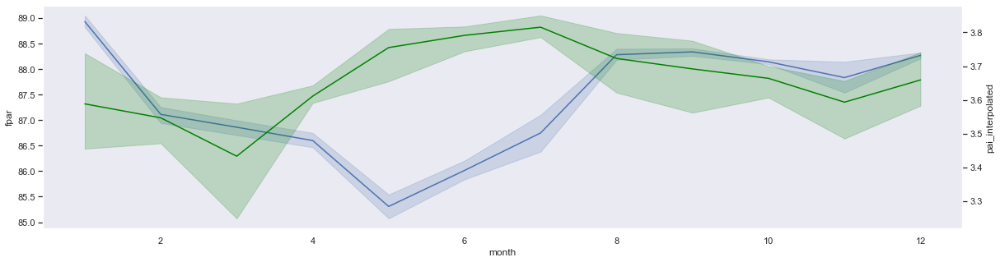

In [282]:
sns.set_style({'axes.grid' : False})
fig, ax = plt.subplots()
sns.lineplot(climate_seasonal[climate_seasonal.polygon_id==1], x='month', y='fpar', ax=ax)
twin_ax = ax.twinx()
sns.lineplot(join_polygon_1, x='month', y='pai_interpolated', ax=twin_ax, color='green')

In [276]:
# Polygon 1 - correlations in the original signal
get_correlations(join_and_shift_data(climate, gedi, 1))

pai_interpolated    1.000000
fpar_2             -0.528155
radiation_2        -0.495936
radiation_-2        0.482307
radiation_1        -0.481726
temperature        -0.435518
P-PET_-2           -0.423323
precipitation_1     0.417280
temperature_1      -0.376430
P-PET_1             0.375914
precipitation_-2   -0.373636
P-PET_2             0.372230
P-PET_-1           -0.361692
precipitation_2     0.339559
temperature_-1     -0.318660
precipitation_-1   -0.315183
fpar               -0.312601
fpar_1             -0.305816
month               0.277797
temperature_2      -0.274651
fpar_-2             0.251145
radiation          -0.221074
radiation_-1        0.100631
P-PET              -0.084028
precipitation      -0.051073
fpar_-1            -0.043456
temperature_-2      0.020610
Name: pai_interpolated, dtype: float64

##### Polygon 2

In [284]:
# Polygon 2.
join_polygon_2 = join_and_shift_data(climate_seasonal, gedi_seasonal, 2)
get_correlations(join_polygon_2).head()

pai_interpolated    1.000000
radiation_2        -0.726831
P-PET_2             0.660006
precipitation_2     0.613655
temperature_1      -0.559481
Name: pai_interpolated, dtype: float64

Seasonal PAI negatively correlates with 2 month delayed radiation, and positively with 2 month delayed water deficit. As we start exiting the water deficit, so does vegetation start growing with a 2 month delay, at least in the seasonal signal.

<AxesSubplot: xlabel='date', ylabel='P-PET'>

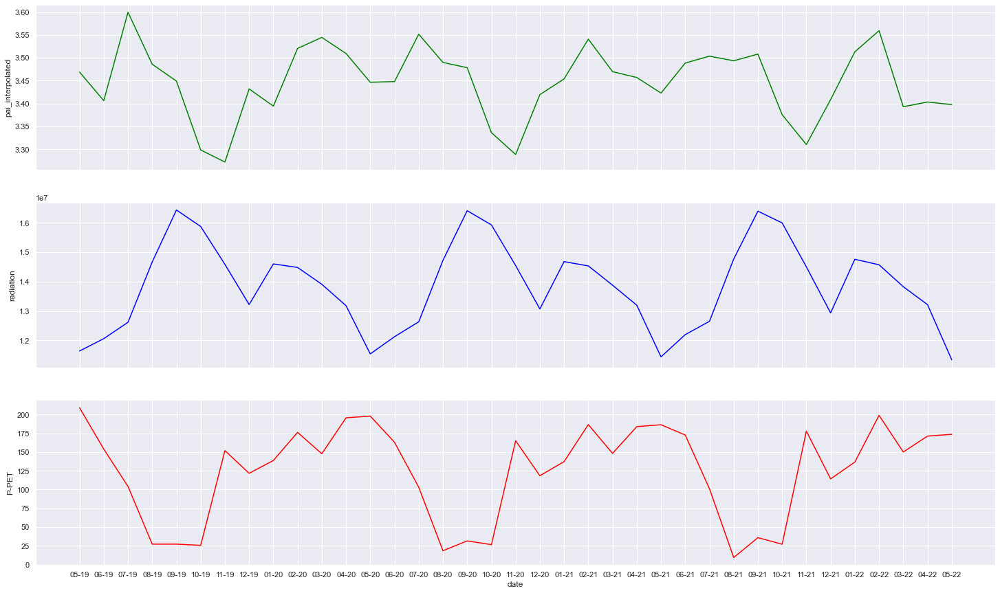

In [208]:
fig, ax = plt.subplots(3, figsize=(25, 15), sharey=False, sharex=True)

# Plot
sns.lineplot(join_polygon_2, x='date', y='pai_interpolated', color='green', ax=ax[0])
sns.lineplot(join_polygon_2, x='date', y='radiation', color='blue', ax=ax[1])
sns.lineplot(join_polygon_2, x='date', y='P-PET', color='red', ax=ax[2])

<AxesSubplot: xlabel='month', ylabel='pai_interpolated'>

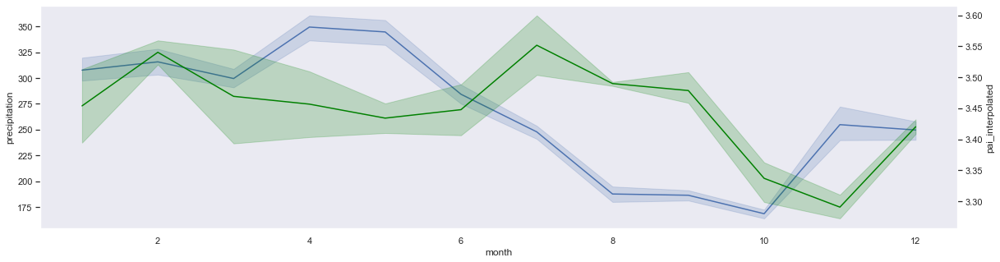

In [287]:
sns.set_style({'axes.grid' : False})
fig, ax = plt.subplots()
sns.lineplot(climate_seasonal[climate_seasonal.polygon_id==2], x='month', y='precipitation', ax=ax)
twin_ax = ax.twinx()
sns.lineplot(join_polygon_2, x='month', y='pai_interpolated', ax=twin_ax, color='green')

In [255]:
# Polygon 2 - correlations in the original signal
join_polygon_1 = join_and_shift_data(climate, gedi, 2)
get_correlations(join_polygon_1)

pai_interpolated    1.000000
radiation_2        -0.469564
P-PET_-2           -0.452925
precipitation_-2   -0.445313
radiation_1        -0.364302
P-PET_-1           -0.284261
temperature_2      -0.268701
fpar_-1             0.265406
precipitation_-1   -0.264004
temperature_1      -0.245024
fpar                0.215362
P-PET_2             0.212359
precipitation_2     0.201273
fpar_-2             0.171478
temperature_-2      0.165760
radiation_-2        0.158432
fpar_2             -0.146342
temperature        -0.132043
temperature_-1      0.123268
radiation_-1        0.100583
radiation          -0.098094
P-PET              -0.051053
fpar_1             -0.049942
precipitation_1     0.028580
P-PET_1             0.020154
precipitation      -0.019660
Name: pai_interpolated, dtype: float64

##### Polygon 4

In [292]:
# Polygon 4.
join_polygon_4 = join_and_shift_data(climate_seasonal, gedi_seasonal, 4)
get_correlations(join_polygon_4)

pai_interpolated    1.000000
precipitation_-2   -0.840263
P-PET_-2           -0.822154
fpar_-2             0.785909
P-PET_-1           -0.778112
radiation_-1        0.770356
radiation_-2        0.745070
precipitation_-1   -0.739462
fpar_-1             0.730861
temperature_-2      0.696658
temperature_-1      0.630592
P-PET              -0.544774
radiation           0.538324
fpar                0.498864
precipitation      -0.479978
month               0.395600
precipitation_2     0.337741
temperature         0.321281
fpar_2             -0.314759
P-PET_2             0.255649
temperature_2      -0.228174
radiation_1         0.220343
P-PET_1            -0.154568
radiation_2        -0.149465
fpar_1              0.117972
temperature_1       0.091208
precipitation_1    -0.066770
Name: pai_interpolated, dtype: float64

We see the biggest correlation with precipitation and fpar shifted by 2 months into the future. Why? Does this make any sense? I think the problem is that it's dificult to see seasonality in pai data in this polygon, possibly due to outlier data still present - like the first deep dip.

<AxesSubplot: xlabel='date', ylabel='radiation'>

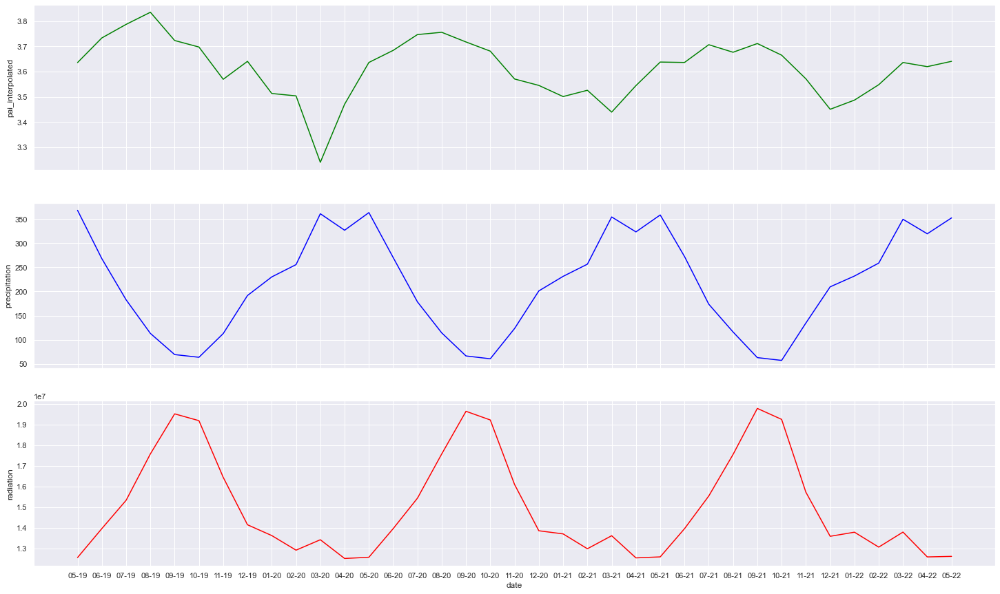

In [296]:
sns.set_style({'axes.grid' : True})
fig, ax = plt.subplots(3, figsize=(25, 15), sharey=False, sharex=True)

# Plot
sns.lineplot(join_polygon_4, x='date', y='pai_interpolated', color='green', ax=ax[0])
sns.lineplot(join_polygon_4, x='date', y='precipitation', color='blue', ax=ax[1])
sns.lineplot(join_polygon_4, x='date', y='radiation', color='red', ax=ax[2])

<AxesSubplot: xlabel='month', ylabel='pai_interpolated'>

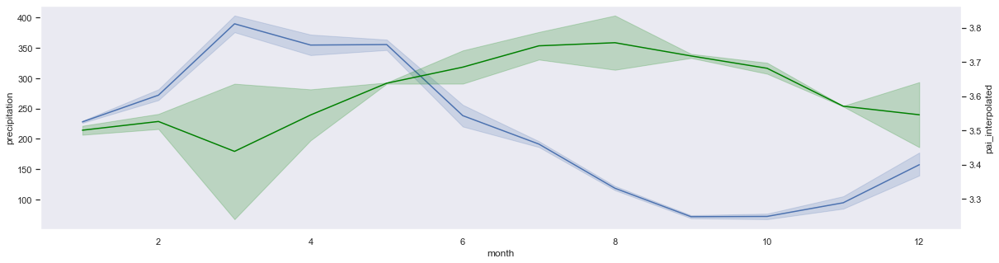

In [295]:
sns.set_style({'axes.grid' : False})
fig, ax = plt.subplots()
sns.lineplot(climate_seasonal[climate_seasonal.polygon_id==4], x='month', y='precipitation', ax=ax)
twin_ax = ax.twinx()
sns.lineplot(join_polygon_4, x='month', y='pai_interpolated', ax=twin_ax, color='green')

In [257]:
# Polygon 4 - correlations in the original signal
join_polygon_4 = join_and_shift_data(climate, gedi, 4)
get_correlations(join_polygon_4)

pai_interpolated    1.000000
P-PET_-2           -0.786862
precipitation_-2   -0.782900
radiation_-1        0.733390
radiation_-2        0.723912
P-PET_-1           -0.722349
precipitation_-1   -0.677472
temperature_-2      0.564753
fpar_-2             0.543032
radiation           0.492751
fpar_-1             0.479152
temperature_-1      0.474918
P-PET              -0.448448
precipitation      -0.388522
fpar                0.322103
radiation_1         0.284408
P-PET_1            -0.203652
temperature         0.190595
precipitation_2     0.181225
fpar_2             -0.173341
precipitation_1    -0.132948
P-PET_2             0.101120
temperature_1       0.085267
temperature_2      -0.079383
fpar_1              0.033425
radiation_2        -0.008385
Name: pai_interpolated, dtype: float64

##### Polygon 5

In [367]:
# Polygon 5.
join_polygon_5 = join_and_shift_data(climate_seasonal, gedi_seasonal, 5)
get_correlations(join_polygon_5).head()

pai_interpolated    1.000000
radiation_-1        0.872301
P-PET              -0.847502
precipitation      -0.840937
P-PET_-1           -0.798407
Name: pai_interpolated, dtype: float64

Vegetation is clearly positively correlated with radiation, and negatively with precipitation. This seems like the obvious example of the green up fenomenon.

<AxesSubplot: xlabel='date', ylabel='precipitation'>

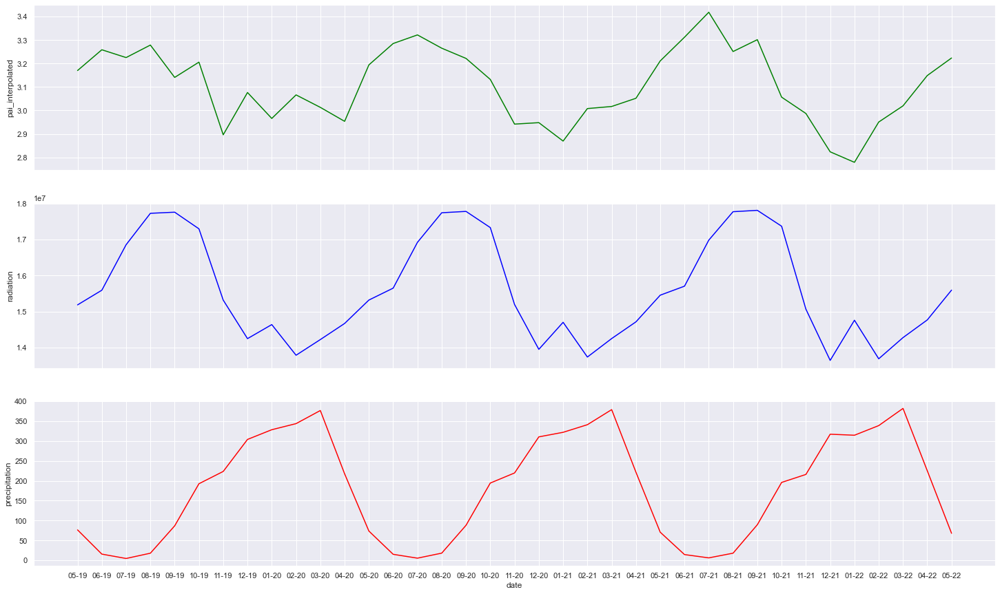

In [298]:
fig, ax = plt.subplots(3, figsize=(25, 15), sharey=False, sharex=True)

# Plot
sns.lineplot(join_polygon_5, x='date', y='pai_interpolated', color='green', ax=ax[0])
sns.lineplot(join_polygon_5, x='date', y='radiation', color='blue', ax=ax[1])
sns.lineplot(join_polygon_5, x='date', y='precipitation', color='red', ax=ax[2])

<AxesSubplot: xlabel='month', ylabel='pai_interpolated'>

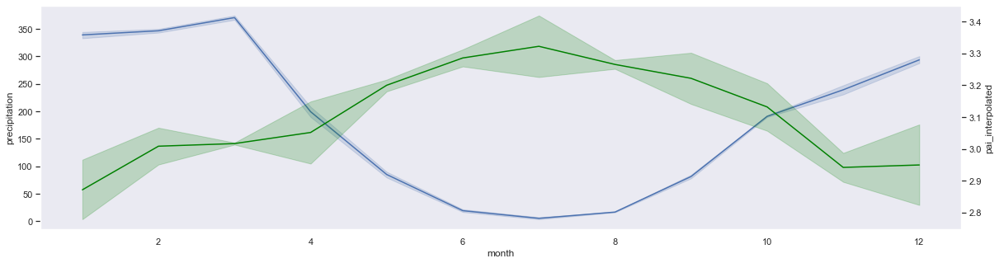

In [300]:
sns.set_style({'axes.grid' : False})
fig, ax = plt.subplots()
sns.lineplot(climate_seasonal[climate_seasonal.polygon_id==5], x='month', y='precipitation', ax=ax)
twin_ax = ax.twinx()
sns.lineplot(join_polygon_5, x='month', y='pai_interpolated', ax=twin_ax, color='green')

In [259]:
# Polygon 5 - correlations in the original signal
join_polygon_5 = join_and_shift_data(climate, gedi, 5)
get_correlations(join_polygon_5)

pai_interpolated    1.000000
P-PET              -0.767256
precipitation      -0.764833
P-PET_-1           -0.755031
precipitation_-1   -0.724249
radiation_-1        0.640109
precipitation_1    -0.632255
radiation_-2        0.616423
temperature_2      -0.608753
P-PET_1            -0.608444
temperature_-2      0.600097
fpar_-1             0.562958
P-PET_-2           -0.562436
precipitation_-2   -0.526501
fpar                0.504281
radiation           0.480450
temperature_1      -0.381278
fpar_-2             0.374761
fpar_1              0.330512
precipitation_2    -0.286564
temperature_-1      0.260199
radiation_1         0.251597
P-PET_2            -0.248844
fpar_2              0.175626
radiation_2        -0.112356
temperature        -0.075375
Name: pai_interpolated, dtype: float64

##### Polygon 6

In [301]:
# Polygon 6.
join_polygon_6 = join_and_shift_data(climate_seasonal, gedi_seasonal, 6)
get_correlations(join_polygon_6)

pai_interpolated    1.000000
P-PET               0.873631
precipitation_1     0.867544
P-PET_1             0.860199
precipitation       0.838953
fpar_-1             0.822500
fpar                0.771097
temperature_-2     -0.741039
temperature_-1     -0.732312
fpar_-2             0.663459
radiation_-1       -0.626864
temperature_2       0.614768
precipitation_2     0.613364
P-PET_-1            0.588442
radiation          -0.567890
precipitation_-1    0.548735
P-PET_2             0.519797
radiation_-2       -0.481165
temperature        -0.478249
fpar_1              0.472981
radiation_2         0.410962
month              -0.228131
radiation_1        -0.194942
P-PET_-2            0.188926
precipitation_-2    0.143421
temperature_1       0.052644
fpar_2             -0.043406
Name: pai_interpolated, dtype: float64

Positively correlated with precipitation and water deficit. In this polygon, vegetation seasonality seems primarely driven by water availability. Also highly correlated with fpar. Question, why is fpar the opposite of radiation?

<AxesSubplot: xlabel='date', ylabel='precipitation'>

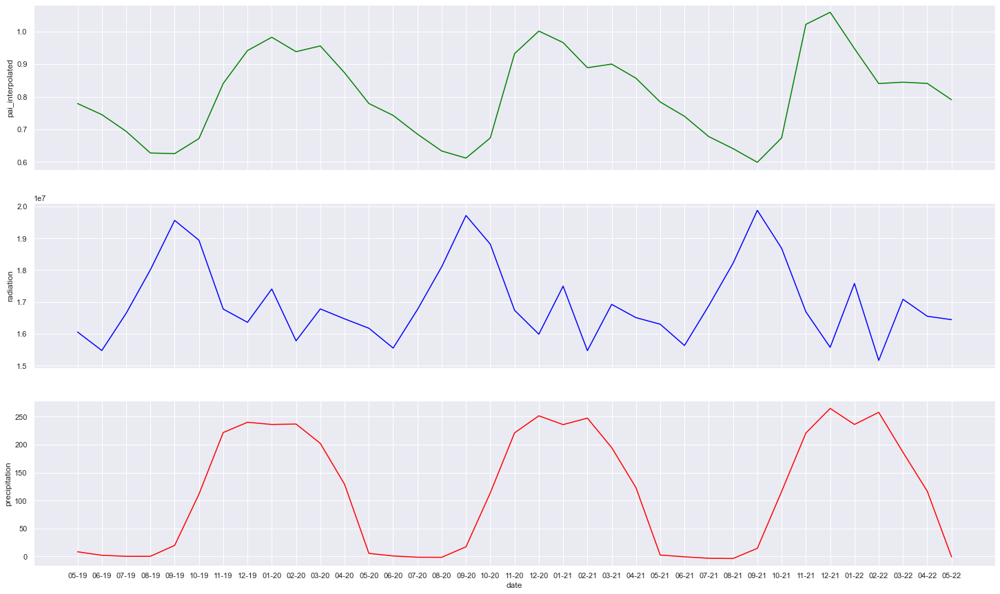

In [226]:
fig, ax = plt.subplots(3, figsize=(25, 15), sharey=False, sharex=True)

# Plot
sns.lineplot(join_polygon_6, x='date', y='pai_interpolated', color='green', ax=ax[0])
sns.lineplot(join_polygon_6, x='date', y='radiation', color='blue', ax=ax[1])
sns.lineplot(join_polygon_6, x='date', y='precipitation', color='red', ax=ax[2])

<AxesSubplot: xlabel='month', ylabel='pai_interpolated'>

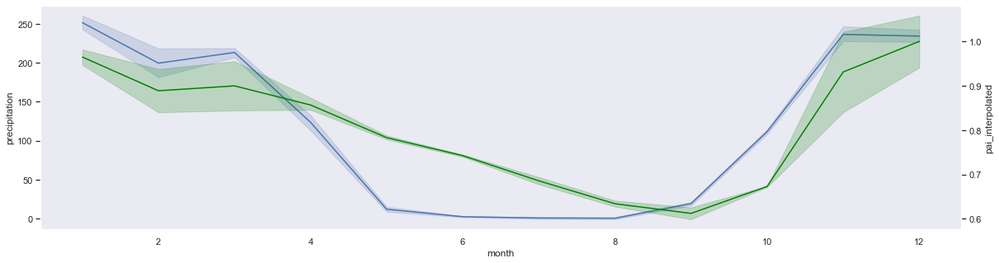

In [302]:
sns.set_style({'axes.grid' : False})
fig, ax = plt.subplots()
sns.lineplot(climate_seasonal[climate_seasonal.polygon_id==6], x='month', y='precipitation', ax=ax)
twin_ax = ax.twinx()
sns.lineplot(join_polygon_6, x='month', y='pai_interpolated', ax=twin_ax, color='green')

In [260]:
# Polygon 6 - correlations in the original signal
join_polygon_6 = join_and_shift_data(climate, gedi, 6)
get_correlations(join_polygon_6)

pai_interpolated    1.000000
fpar_-1             0.774546
temperature_-2     -0.708159
precipitation_1     0.708136
precipitation       0.701152
fpar                0.694355
P-PET               0.686762
temperature_-1     -0.681494
fpar_-2             0.650746
P-PET_1             0.650099
P-PET_-1            0.529865
precipitation_2     0.528709
temperature_2       0.519696
precipitation_-1    0.518117
radiation_-1       -0.456059
fpar_1              0.449594
temperature        -0.430216
P-PET_2             0.415323
radiation          -0.345687
radiation_-2       -0.313651
radiation_2         0.290385
P-PET_-2            0.176031
precipitation_-2    0.138455
radiation_1        -0.062167
temperature_1       0.026359
fpar_2             -0.011592
Name: pai_interpolated, dtype: float64

##### Polygon 7

In [303]:
# Polygon 7.
join_polygon_7 = join_and_shift_data(climate_seasonal, gedi_seasonal, 7)
get_correlations(join_polygon_7)

pai_interpolated    1.000000
precipitation_1     0.917926
fpar_-1             0.897467
P-PET               0.888438
precipitation       0.856078
fpar                0.849369
P-PET_1             0.826586
temperature_-2     -0.808886
temperature_-1     -0.796737
fpar_-2             0.708234
precipitation_2     0.702642
radiation_2         0.615516
P-PET_-1            0.581325
radiation_-2       -0.559110
temperature_2       0.518130
temperature        -0.510880
fpar_1              0.505652
radiation_-1       -0.502735
P-PET_2             0.498746
precipitation_-1    0.477861
month              -0.356097
radiation          -0.289833
P-PET_-2            0.182083
radiation_1         0.137556
fpar_2              0.047662
temperature_1       0.029197
precipitation_-2    0.020863
Name: pai_interpolated, dtype: float64

<AxesSubplot: xlabel='date', ylabel='P-PET'>

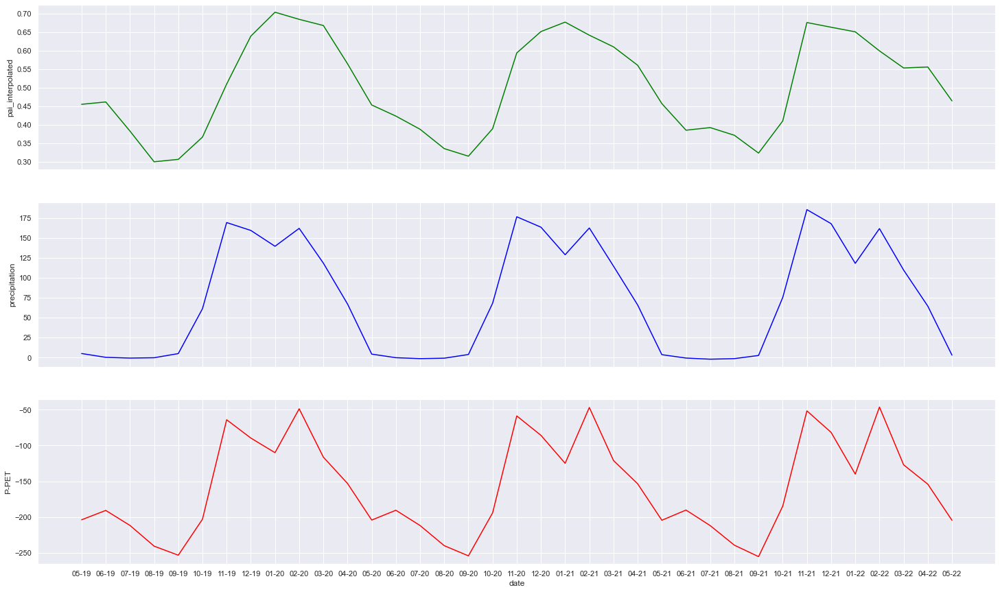

In [244]:
fig, ax = plt.subplots(3, figsize=(25, 15), sharey=False, sharex=True)

# Plot
sns.lineplot(join_polygon_7, x='date', y='pai_interpolated', color='green', ax=ax[0])
sns.lineplot(join_polygon_7, x='date', y='precipitation', color='blue', ax=ax[1])
sns.lineplot(join_polygon_7, x='date', y='P-PET', color='red', ax=ax[2])

<AxesSubplot: xlabel='month', ylabel='pai_interpolated'>

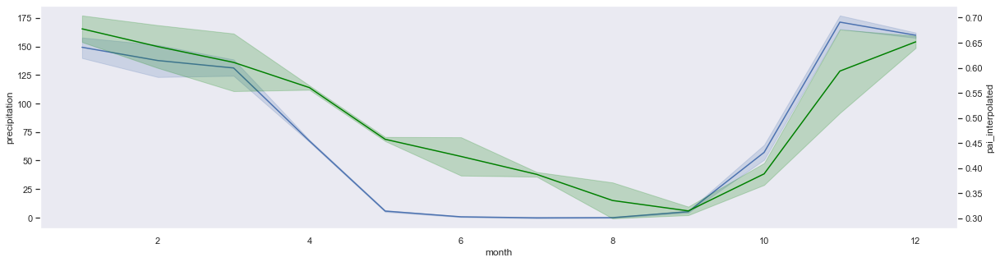

In [304]:
sns.set_style({'axes.grid' : False})
fig, ax = plt.subplots()
sns.lineplot(climate_seasonal[climate_seasonal.polygon_id==7], x='month', y='precipitation', ax=ax)
twin_ax = ax.twinx()
sns.lineplot(join_polygon_7, x='month', y='pai_interpolated', ax=twin_ax, color='green')

In [261]:
# Polygon 7 - correlations in the original signal
join_polygon_7 = join_and_shift_data(climate, gedi, 7)
get_correlations(join_polygon_7)

pai_interpolated    1.000000
fpar_-1             0.894000
fpar                0.821587
temperature_-2     -0.763249
temperature_-1     -0.741797
fpar_-2             0.728352
precipitation_1     0.696697
precipitation       0.693541
P-PET               0.670405
P-PET_1             0.563706
precipitation_2     0.543269
temperature        -0.478488
temperature_2       0.474628
fpar_1              0.466074
radiation_2         0.455629
radiation_-2       -0.411807
P-PET_-1            0.411604
radiation_-1       -0.388152
precipitation_-1    0.362014
P-PET_2             0.342041
radiation          -0.249522
radiation_1         0.141724
P-PET_-2            0.076451
fpar_2              0.049778
precipitation_-2   -0.047475
temperature_1       0.046868
Name: pai_interpolated, dtype: float64

##### Polygon 8

In [305]:
# Polygon 8.
join_polygon_8 = join_and_shift_data(climate_seasonal, gedi_seasonal, 8)
get_correlations(join_polygon_8)

pai_interpolated    1.000000
fpar                0.861687
precipitation_1     0.770111
precipitation_2     0.758971
temperature_2       0.710193
radiation_2         0.700660
fpar_-1             0.697028
fpar_1              0.671514
temperature_-2     -0.599765
month              -0.571149
P-PET_1             0.555606
temperature_-1     -0.506475
P-PET_2             0.458958
precipitation_-2   -0.456907
fpar_-2             0.429669
radiation_1         0.416963
precipitation       0.367112
P-PET_-2           -0.363263
radiation_-2       -0.323611
temperature        -0.285914
radiation           0.220033
P-PET               0.208051
temperature_1       0.172137
P-PET_-1           -0.142795
fpar_2              0.122582
precipitation_-1   -0.102967
radiation_-1        0.026148
Name: pai_interpolated, dtype: float64

Polygon 8 vegetation is correlated with delayed 1 month and 2 month precipitation, but not so much with current precipitation. We speculate this is because the area becomes so dry (this polygon spends most of the time in severe water deficit), that it needs 1 to 2 months of water accumulation for the vegetation to start growing.

fpar has the strongest seasonal correlation as well.

<AxesSubplot: xlabel='date', ylabel='fpar'>

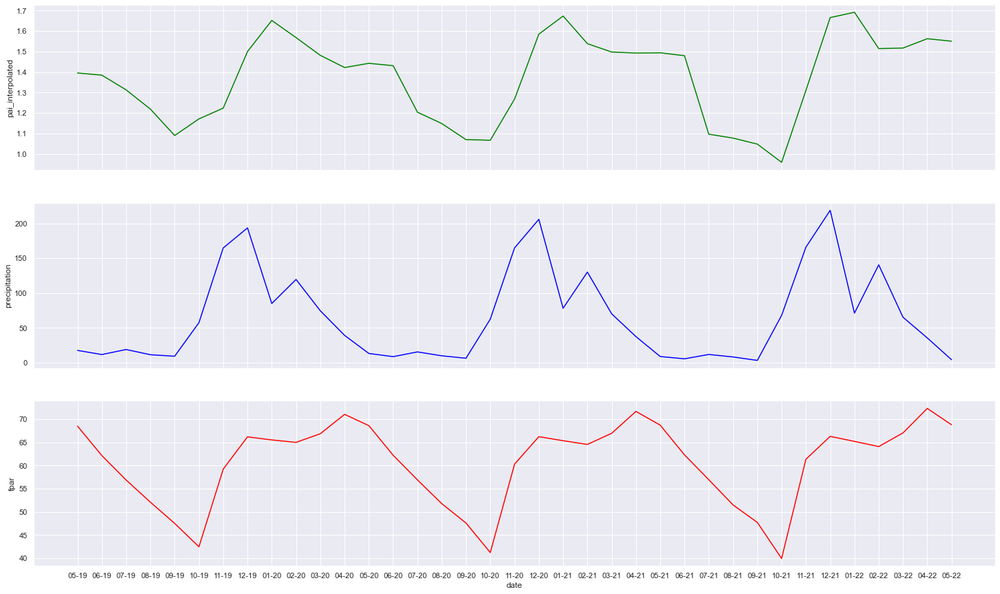

In [249]:
fig, ax = plt.subplots(3, figsize=(25, 15), sharey=False, sharex=True)

# Plot
sns.lineplot(join_polygon_8, x='date', y='pai_interpolated', color='green', ax=ax[0])
sns.lineplot(join_polygon_8, x='date', y='precipitation', color='blue', ax=ax[1])
sns.lineplot(join_polygon_8, x='date', y='fpar', color='red', ax=ax[2])

<AxesSubplot: xlabel='month', ylabel='pai_interpolated'>

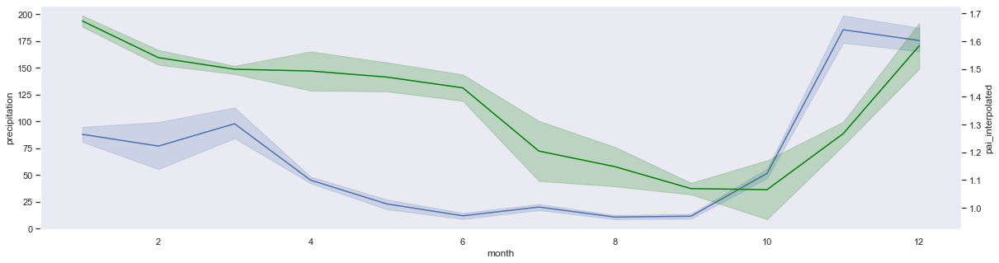

In [306]:
sns.set_style({'axes.grid' : False})
fig, ax = plt.subplots()
sns.lineplot(climate_seasonal[climate_seasonal.polygon_id==8], x='month', y='precipitation', ax=ax)
twin_ax = ax.twinx()
sns.lineplot(join_polygon_8, x='month', y='pai_interpolated', ax=twin_ax, color='green')

In [262]:
# Polygon 8 - correlations in the original signal
join_polygon_8 = join_and_shift_data(climate, gedi, 8)
get_correlations(join_polygon_8)

pai_interpolated    1.000000
fpar                0.675165
temperature_-2     -0.562646
fpar_1              0.551496
temperature_2       0.531994
fpar_-1             0.530010
precipitation_2     0.529598
radiation_2         0.488689
precipitation_1     0.475958
temperature_-1     -0.462295
precipitation_-2   -0.370584
radiation_1         0.354658
fpar_-2             0.350625
P-PET_2             0.273801
temperature        -0.272879
P-PET_-2           -0.262559
P-PET_1             0.239308
radiation_-2       -0.236522
radiation           0.215787
precipitation       0.204281
fpar_2              0.145089
temperature_1       0.113668
precipitation_-1   -0.074686
P-PET_-1           -0.064359
P-PET               0.060728
radiation_-1       -0.016414
Name: pai_interpolated, dtype: float64

### Yearly average precipitation vs. PAI

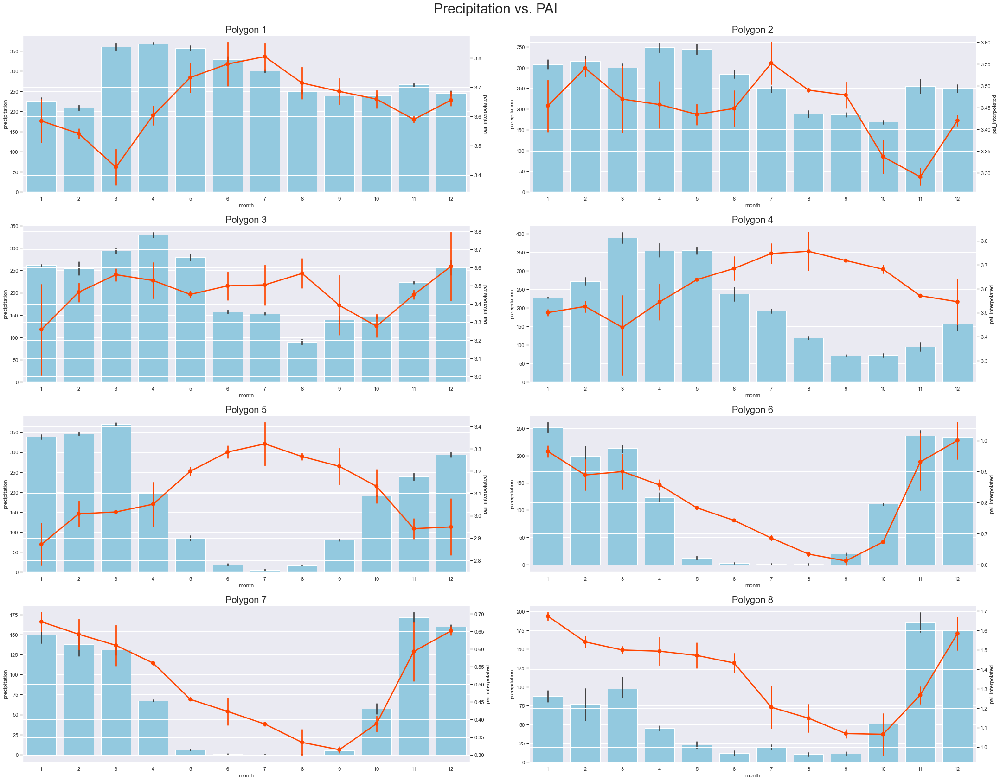

In [368]:
fig, ax = plot.plot_per_polygon(climate_seasonal, plot_func=lambda df, ax: sns.barplot(df, x='month', y='precipitation', ax=ax, color='skyblue'), title='Precipitation vs. PAI')
fig, ax = plot.plot_per_polygon(gedi_seasonal, plot_func=lambda df, ax: sns.pointplot(df, x='month', y='pai_interpolated', ax=ax, color='orangered'), title='Precipitation vs. PAI', twin_axis=True, fig=fig, ax=ax)
plt.savefig('image.png')

In [ ]:
fig, ax = plot.plot_per_polygon(climate_seasonal, plot_func=lambda df, ax: sns.barplot(df, x='month', y='precipitation', ax=ax, color='skyblue'), title='Precipitation vs. PAI')
fig, ax = plot.plot_per_polygon(gedi_seasonal, plot_func=lambda df, ax: sns.pointplot(df, x='month', y='pai_interpolated', ax=ax, color='orangered'), title='Precipitation vs. PAI', twin_axis=True, fig=fig, ax=ax)

## Overall polygon metrics

<AxesSubplot: xlabel='polygon_id', ylabel='pai_interpolated'>

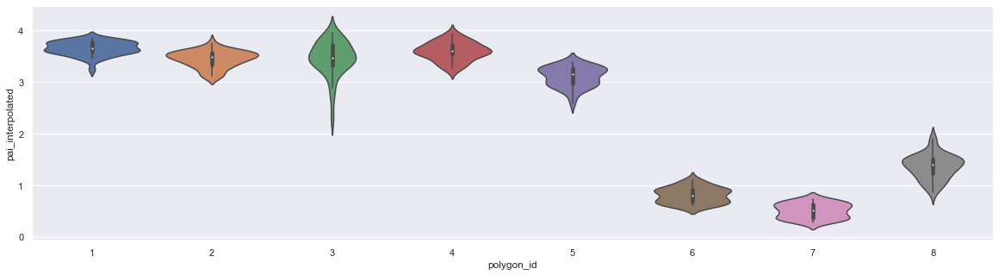

In [241]:
sns.violinplot(gedi, x='polygon_id', y='pai_interpolated')

<AxesSubplot: xlabel='polygon_id', ylabel='pai_interpolated'>

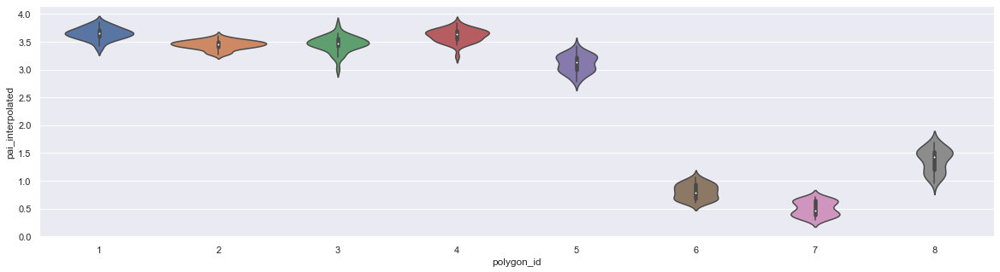

In [242]:
sns.violinplot(gedi_seasonal, x='polygon_id', y='pai_interpolated')

<AxesSubplot: xlabel='polygon_id', ylabel='precipitation'>

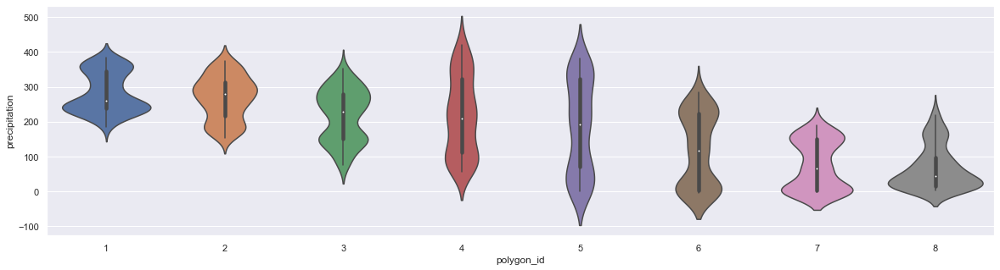

In [232]:
sns.violinplot(climate_seasonal, x='polygon_id', y='precipitation')

<AxesSubplot: xlabel='polygon_id', ylabel='P-PET'>

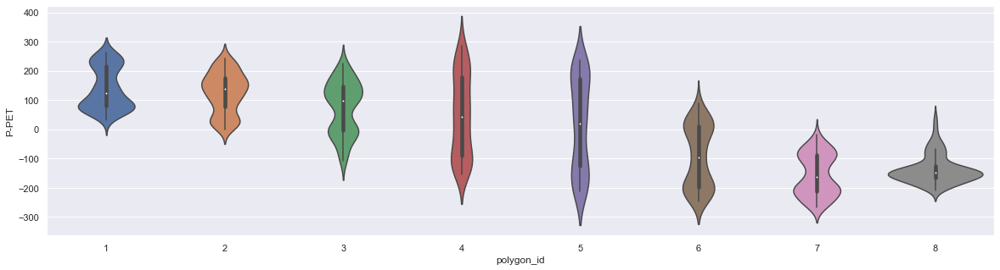

In [235]:
sns.violinplot(climate_seasonal, x='polygon_id', y='P-PET')

<AxesSubplot: xlabel='polygon_id', ylabel='radiation'>

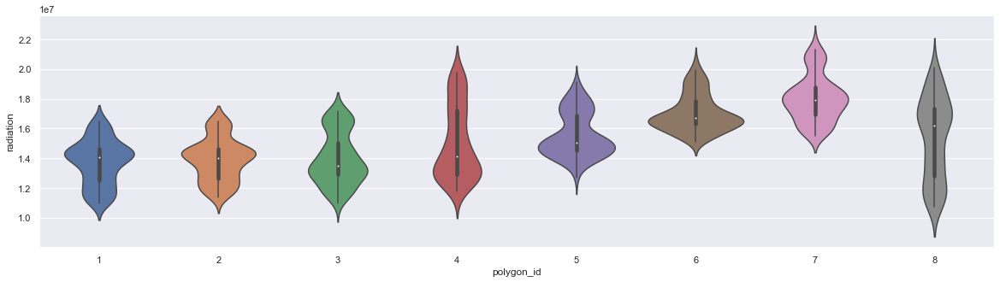

In [236]:
sns.violinplot(climate_seasonal, x='polygon_id', y='radiation')

<AxesSubplot: xlabel='polygon_id', ylabel='fpar'>

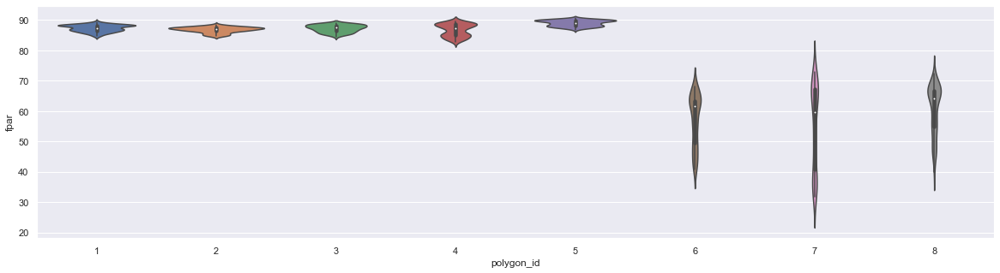

In [239]:
sns.violinplot(climate_seasonal, x='polygon_id', y='fpar')

<AxesSubplot: xlabel='polygon_id', ylabel='temperature'>

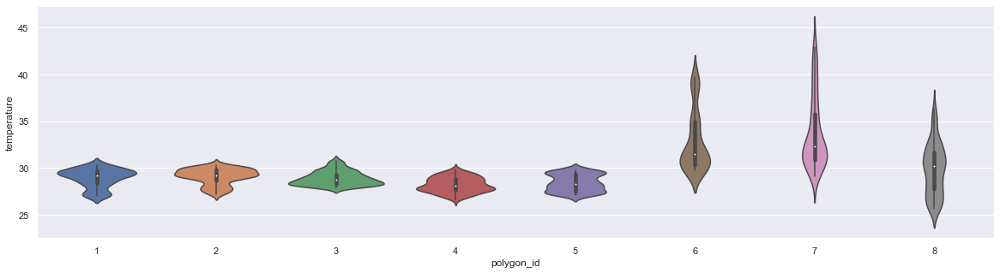

In [240]:
sns.violinplot(climate_seasonal, x='polygon_id', y='temperature')

#### Climate vs PAI yearly summary - in plots

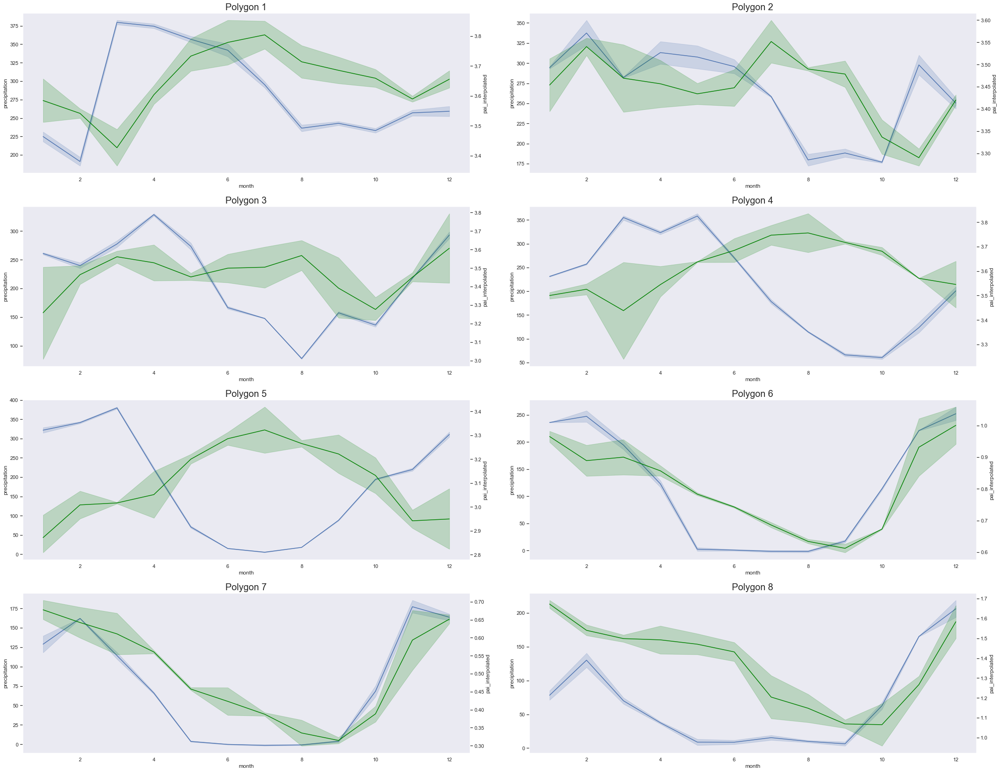

In [263]:
sns.set_style({'axes.grid' : False})
fig, ax = plot.plot_per_polygon(climate_seasonal[climate_seasonal.datetime > gedi_start_date], plot_func=lambda df, ax: sns.lineplot(df, x='month', y='precipitation', ax=ax), title='')
fig, ax = plot.plot_per_polygon(gedi_seasonal, plot_func=lambda df, ax: sns.lineplot(df, x='month', y='pai_interpolated', ax=ax, color='green'), title='', fig=fig, ax=ax, twin_axis=True)

## How Climate data from 2010 to 2022 was generated

In [241]:
# Dates of interest.
start_date_str = '2010-01-01'
end_date_str = '2022-11-01'

In [242]:
# Dates of interest.
start_date = ee.Date(start_date_str)
end_date = ee.Date(end_date_str)

# Get regions of interest.
ee_geoms = pipeline.get_ee_polygons()

# Specify resolution.
scale = 20000

# Fetch climate data from Earth Engine as Pandas DataFrame.
precip_df = ee_climate.get_monthly_climate_data_as_pdf(
        start_date, end_date, ee_geoms, scale, columns=['precipitation', 'ET', 'PET'])

KeyboardInterrupt: 

In [9]:
radiation_pdf = ee_climate.get_monthly_climate_data_as_pdf(
        start_date, end_date, ee_geoms, scale, columns=['temperature', 'radiation', 'fpar'])

In [371]:
precip_monthly_mean = precip_df.groupby(['month', 'polygon_id', 'year']) \
                               .mean(numeric_only=True).reset_index()
precip_monthly_mean = dfext.add_datetime_column(precip_monthly_mean)
precip_monthly_mean = dfext.add_date_column(precip_monthly_mean)
precip_monthly_mean['P-PET'] = precip_monthly_mean['precipitation'] - precip_monthly_mean['PET']
precip_monthly_mean['P-ET'] = precip_monthly_mean['precipitation'] - precip_monthly_mean['ET']

In [372]:
radiation_monthly_mean = radiation_pdf.groupby(['month', 'polygon_id', 'year']) \
                                      .mean(numeric_only=True).reset_index()
radiation_monthly_mean = dfext.add_datetime_column(radiation_monthly_mean)
radiation_monthly_mean = dfext.add_date_column(radiation_monthly_mean)

In [373]:
precip_monthly_mean.to_csv('../../data/interim/monthly_means_timeseries_of_water_climate_vars_01-2010_to_11-2022.csv')

In [374]:
radiation_monthly_mean.to_csv('../../data/interim/monthly_means_timeseries_of_radiation_vars_01-2010_to_11-2022.csv')

In [376]:
climate_df = precip_monthly_mean.set_index(['month', 'polygon_id', 'year', 'datetime', 'date']) \
                                .join(radiation_monthly_mean.set_index(['month', 'polygon_id', 'year', 'datetime', 'date'])) \
                                .reset_index()

In [377]:
climate_df.to_csv('../../data/interim/monthly_means_timeseries_of_climate_vars_01-2010_to_11-2022.csv')

In [378]:
climate_df = climate_df.sort_values('datetime')

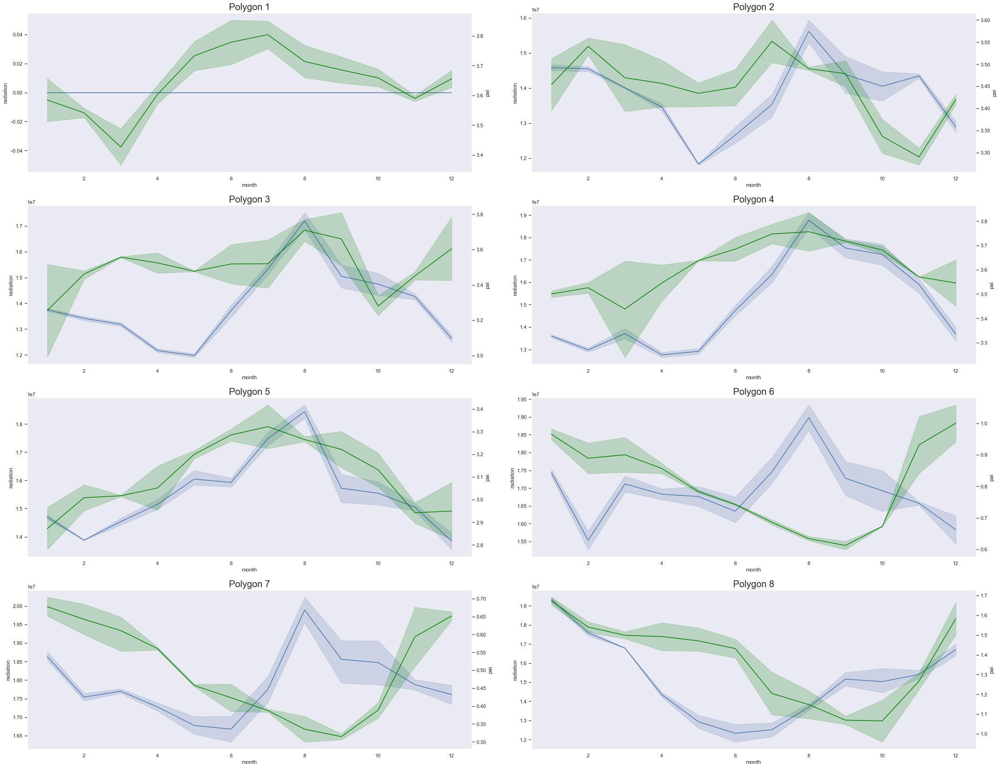

In [550]:
sns.set_style({'axes.grid' : False})
fig, ax = plot.plot_per_polygon(seasonals[seasonals.datetime > gedi_start_date], plot_func=lambda df, ax: sns.lineplot(df, x='month', y='radiation', ax=ax), title='')
fig, ax = plot.plot_per_polygon(gedi_seasonal, plot_func=lambda df, ax: sns.lineplot(df, x='month', y='pai', ax=ax, color='green'), title='', fig=fig, ax=ax, twin_axis=True)

In [513]:
seasonals

,datetime,polygon_id,date,precipitation,temperature,radiation,fpar,ET,PET,P-ET,P-PET,normalized_precipitation
0,2010-01-01,1,01-10,194.238447,29.003493,1.423381e+07,89.867016,131.704082,164.082687,62.534365,30.155760,0.471284
1,2010-02-01,1,02-10,212.029216,30.161820,1.461387e+07,88.456381,101.225235,126.437820,110.803981,85.591396,0.513190
2,2010-03-01,1,03-10,332.728321,29.128712,1.413628e+07,84.312116,110.310272,135.888481,222.418049,196.839840,0.797498
3,2010-04-01,1,04-10,364.601261,28.148165,1.190641e+07,86.032950,106.558183,132.567538,258.043078,232.033724,0.872575
4,2010-05-01,1,05-10,375.033000,27.946519,1.098706e+07,85.612289,110.173612,135.373675,264.859389,239.659326,0.897147
...,...,...,...,...,...,...,...,...,...,...,...,...
1227,2022-06-01,8,06-22,-1.861430,25.933843,1.302087e+07,61.767187,68.508748,145.964344,-70.370179,-147.825774,0.009369
1228,2022-07-01,8,07-22,7.081893,26.593628,1.307019e+07,55.242002,56.751219,153.846677,-49.669326,-146.764784,0.030435
1229,2022-08-01,8,08-22,4.364970,28.696279,1.395987e+07,50.205515,54.197688,168.933540,-49.832717,-164.568570,0.024036
1230,2022-09-01,8,09-22,2.626408,32.783405,1.463152e+07,46.966098,55.626065,199.016338,-52.999657,-196.389930,0.019940


### Measuring Seasonality Using Timeseries Decomposition

In [544]:
# Dates of interest, inclusive.
start_date_inclusive = '2010-01-01'
end_date_inclusive = '2022-10-01'
climate_columns = [*ee_climate.CLIMATE_COLUMNS, 'P-ET', 'P-PET']

In [545]:
seasonals = seasonal.get_ts_seasonal_component_per_polygon(climate_df, start_date_inclusive, end_date_inclusive, columns=climate_columns)

In [546]:
seasonals.radiation = seasonals.radiation.fillna(0)
seasonals.fpar = seasonals.fpar.fillna(0)
seasonals.temperature = seasonals.temperature.fillna(0)

#### Plot seasonal vs. original signal

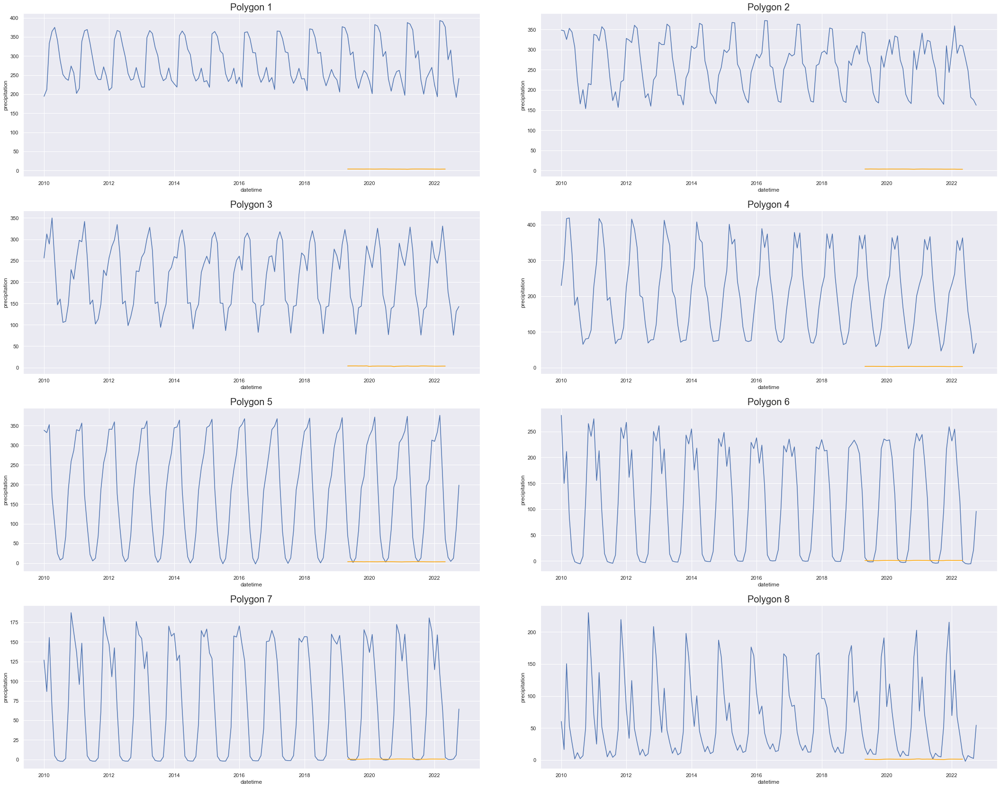

In [482]:
fig, ax = plot.plot_per_polygon(seasonals, plot_func=lambda df, ax: sns.lineplot(df, x='datetime', y='precipitation', ax=ax), title='')
fig, ax = plot.plot_per_polygon(gedi, plot_func=lambda df, ax: sns.lineplot(df, x='datetime', y='pai_interpolated', ax=ax, color='orange'), title='', fig=fig, ax=ax, sharey=True)

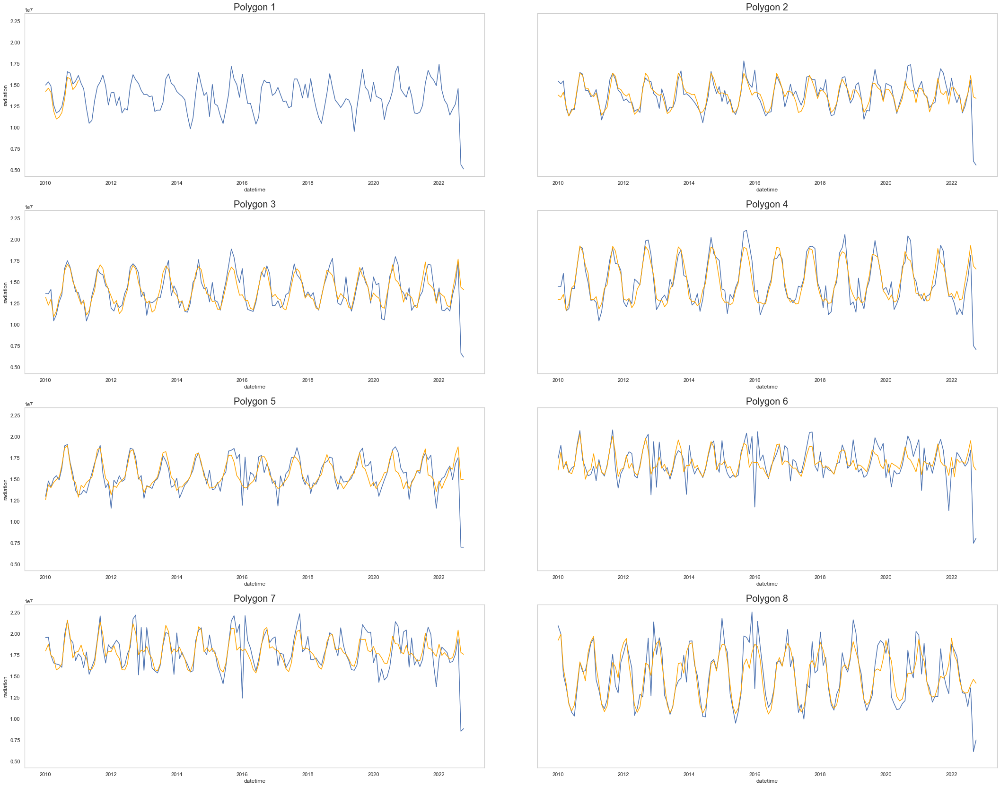

In [514]:
fig, ax = plot.plot_per_polygon(climate_df, plot_func=lambda df, ax: sns.lineplot(df, x='datetime', y='radiation', ax=ax), title='', sharey=True)
fig, ax = plot.plot_per_polygon(seasonals, plot_func=lambda df, ax: sns.lineplot(df, x='datetime', y='radiation', ax=ax, color='orange'), title='', fig=fig, ax=ax, sharey=True)

<AxesSubplot: xlabel='datetime', ylabel='precipitation'>

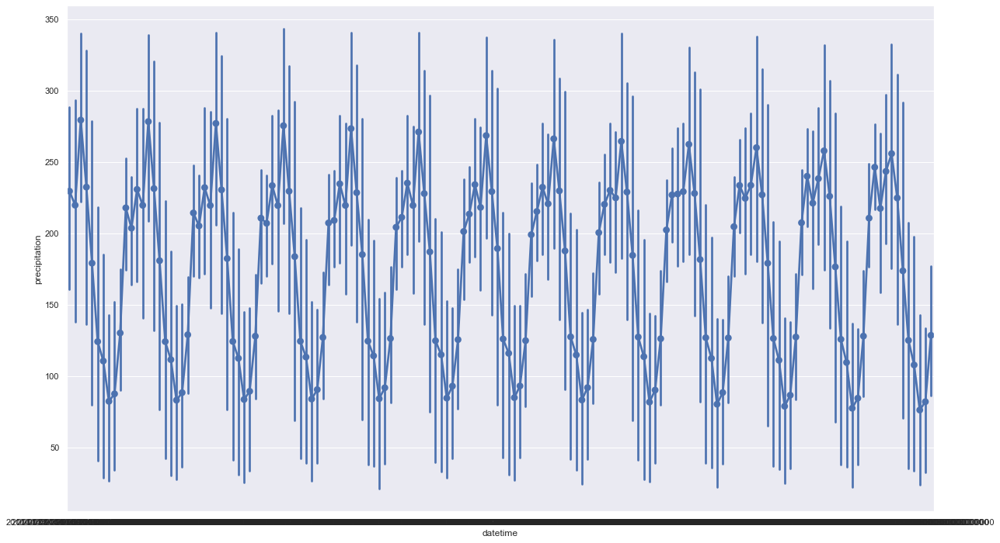

In [346]:
sns.pointplot(seasonals, x='datetime', y='precipitation')

ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

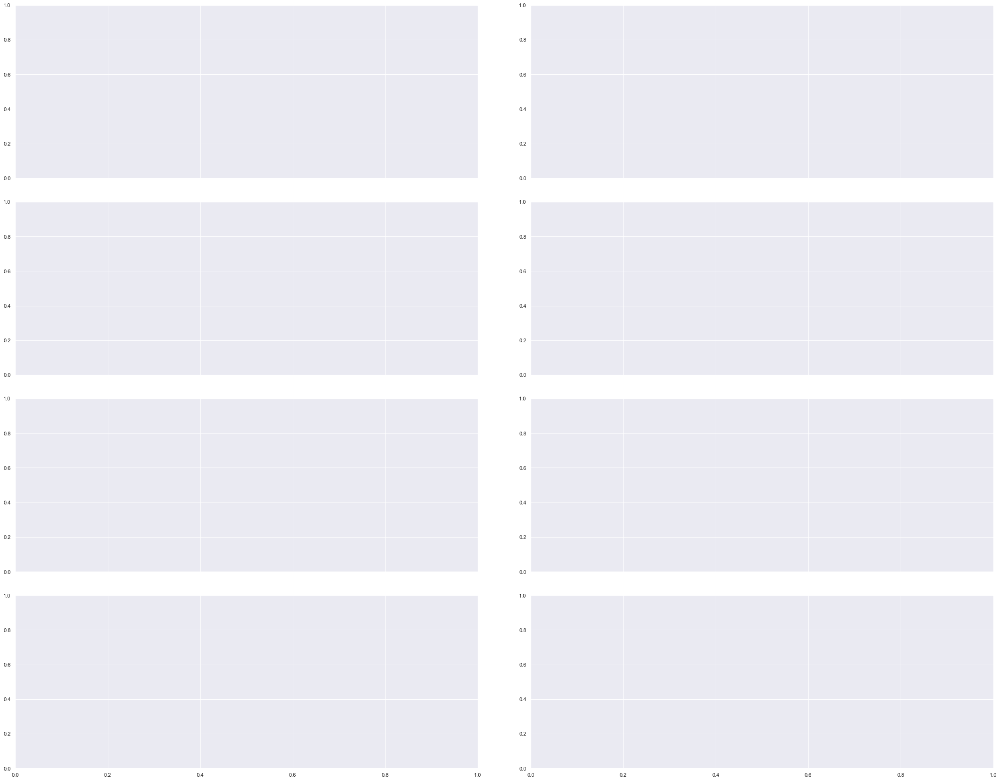

In [341]:
plot.layered_pointplot_per_polygon(seasonals, x='datetime', y1='precipitation', y2='seasonal_precipitation', title='')

48.09743513692336
114.07965807753253
56.822186326875624
281.4865437971026


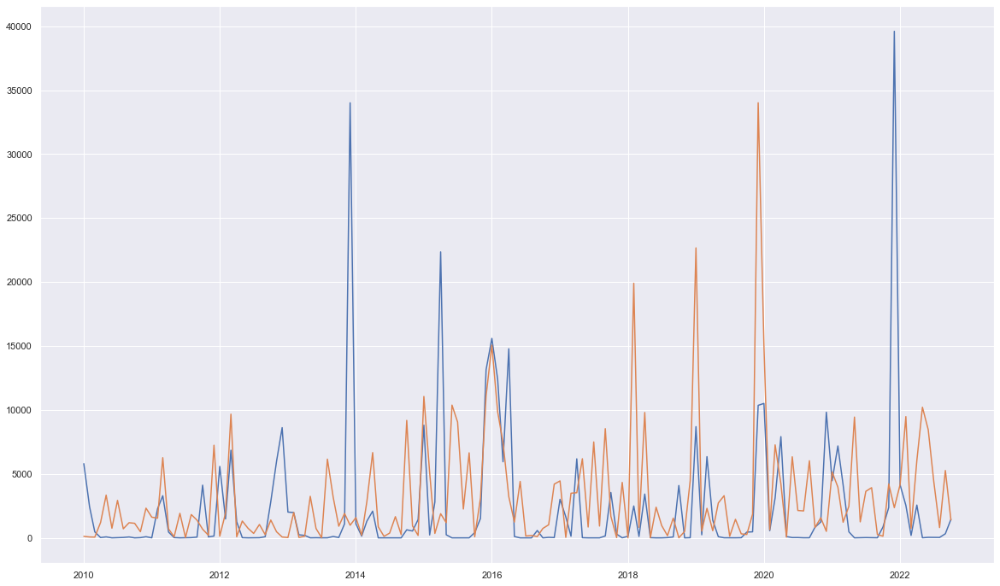

In [336]:
polygon_id = 6
original_polygon = climate_df[climate_df.polygon_id == polygon_id].set_index(
    'datetime').sort_index()['precipitation']
seasonal_polygon = seasonals[seasonals.polygon_id == polygon_id].set_index(
    'datetime').sort_index()['precipitation']

print(((original_polygon - seasonal_polygon) ** 2).mean() ** 0.5)
print(original_polygon.mean())
plt.plot((original_polygon - seasonal_polygon) ** 2)

polygon_id = 1
original_polygon = climate_df[climate_df.polygon_id == polygon_id].set_index(
    'datetime').sort_index()['precipitation']
seasonal_polygon = seasonals[seasonals.polygon_id == polygon_id].set_index(
    'datetime').sort_index()['precipitation']

print(((original_polygon - seasonal_polygon) ** 2).mean() ** 0.5)
print(original_polygon.mean())
plt.plot((original_polygon - seasonal_polygon) ** 2)
#plt.plot(seasonal_polygon)

<AxesSubplot: xlabel='datetime', ylabel='fpar'>

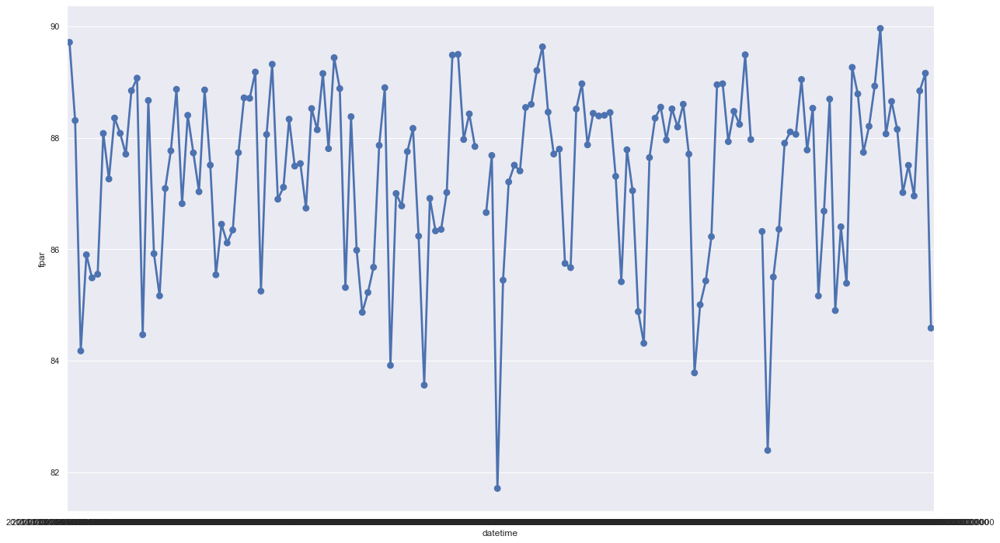

In [299]:
polygon_1 = climate_df[climate_df.polygon_id==1]
sns.pointplot(polygon_1, x='datetime', y='fpar')

In [408]:
nrmse = pd.DataFrame(columns=[*climate_columns, 'polygon_id'])
for polygon_id in range(1,9):
    new_row = {'polygon_id': polygon_id}
    for column in climate_columns:
        new_row[column] = seasonal.calculate_nrmse(climate_df, seasonals, polygon_id, column)
    nrmse = pd.concat([nrmse, pd.DataFrame(new_row, index=[polygon_id])])
nrmse

,precipitation,temperature,radiation,fpar,ET,PET,P-ET,P-PET,polygon_id
1,0.201865,0.012492,0.050656,0.001241,0.094160,0.104852,0.371036,0.462167,1
2,0.239114,0.018687,0.087691,0.014074,0.079245,0.088709,0.444524,0.552930,2
3,0.262459,0.023254,0.094700,0.012624,0.086097,0.096091,0.646536,0.932178,3
4,0.313035,0.025855,0.102026,0.018386,0.076021,0.102827,0.923650,2.044815,4
5,0.186646,0.019939,0.086791,0.011210,0.082756,0.089912,0.743192,4.631369,5
6,0.421613,0.032786,0.098379,0.044629,0.128243,0.076043,1.400027,-0.611341,6
7,0.699086,0.049428,0.094400,0.095914,0.234605,0.057500,-5.846511,-0.376637,7
8,0.737766,0.051180,0.118538,0.072513,0.133757,0.063181,-1.719504,-0.410475,8


In [404]:
abs_amplitudes = pd.DataFrame(columns=[*climate_columns, 'polygon_id'])
for polygon_id in range(1,9):
    new_row = {'polygon_id': polygon_id}
    for column in climate_columns:
        new_row[column] = seasonal.get_seasonal_amplitude(climate_df, seasonals, polygon_id, column)[0]
    abs_amplitudes = pd.concat([abs_amplitudes, pd.DataFrame(new_row, index=[polygon_id])])
abs_amplitudes

,precipitation,temperature,radiation,fpar,ET,PET,P-ET,P-PET,polygon_id
1,201.402149,3.219471,4.895192e+06,5.554900,41.516346,56.886250,241.015044,256.353586,1
2,218.561442,3.334617,5.058552e+06,3.932670,30.345635,40.315235,231.098964,236.436478,2
3,274.154111,2.848557,6.780405e+06,4.594677,50.986868,65.899968,313.134873,325.008520,3
4,379.166270,3.178209,7.629759e+06,6.838613,71.450877,98.410420,439.395766,462.448300,4
5,378.867157,2.911328,6.358930e+06,3.700088,58.201279,105.832506,412.562551,449.995182,5
6,287.208633,9.902896,5.321977e+06,26.479113,121.502145,77.030719,259.462702,335.688065,6
7,189.568840,13.946748,6.206177e+06,40.957626,143.917918,78.126690,184.050225,249.330840,7
8,232.040052,10.711056,9.382355e+06,33.612475,85.708446,122.953931,225.282127,254.133868,8


In [427]:
rel_amplitudes = pd.DataFrame(columns=[*climate_columns, 'polygon_id'])
for polygon_id in range(1,9):
    new_row = {'polygon_id': polygon_id}
    for column in climate_columns:
        new_row[column] = seasonal.get_seasonal_amplitude(climate_df, seasonals, polygon_id, column)[1]
    rel_amplitudes = pd.concat([rel_amplitudes, pd.DataFrame(new_row, index=[polygon_id])])
rel_amplitudes

,precipitation,temperature,radiation,fpar,ET,PET,P-ET,P-PET,polygon_id
1,0.715599,0.111246,0.356467,0.063463,0.352319,0.390569,1.473124,1.887784,1
2,0.823868,0.114604,0.366135,0.045262,0.260562,0.281740,1.552828,1.934941,2
3,1.290181,0.098457,0.486325,0.052607,0.434309,0.456861,3.292864,4.762202,3
4,1.801505,0.112544,0.508696,0.078745,0.541624,0.573481,5.593676,11.897336,4
5,2.137871,0.102320,0.409727,0.041542,0.454049,0.622705,8.413756,61.975077,5
6,2.559015,0.300463,0.314308,0.469617,1.534145,0.361875,7.854075,-3.335821,6
7,2.689605,0.411815,0.346731,0.764769,1.801972,0.338076,-19.611409,-1.552398,7
8,3.687052,0.358666,0.619638,0.560586,0.927243,0.611708,-7.636710,-1.840650,8


In [262]:
#original_polygon = climate_df[climate_df.polygon_id == 1].sort_values('datetime')[['precipitation']]
#seasonal_polygon = seasonals[seasonals.polygon_id == 1].sort_values('datetime')['precipitation']
#print(original_polygon - seasonal_polygon)
original_polygon = climate_df[climate_df.polygon_id == 1].set_index('datetime').sort_index()['precipitation']
seasonal_polygon = seasonals[seasonals.polygon_id == 1].set_index('datetime').sort_index()['precipitation']
print(original_polygon - seasonal_polygon)
#original_polygon

datetime
2010-01-01    10.824277
2010-02-01    -8.384264
2010-03-01    -7.731398
2010-04-01   -34.659969
2010-05-01   -57.811250
                ...    
2022-06-01   -91.983615
2022-07-01    66.235051
2022-08-01    28.342226
2022-09-01   -72.575962
2022-10-01    37.290806
Name: precipitation, Length: 154, dtype: float64


### Plot nrmse for each climate variable

<AxesSubplot: xlabel='polygon_id', ylabel='absolute amplitude'>

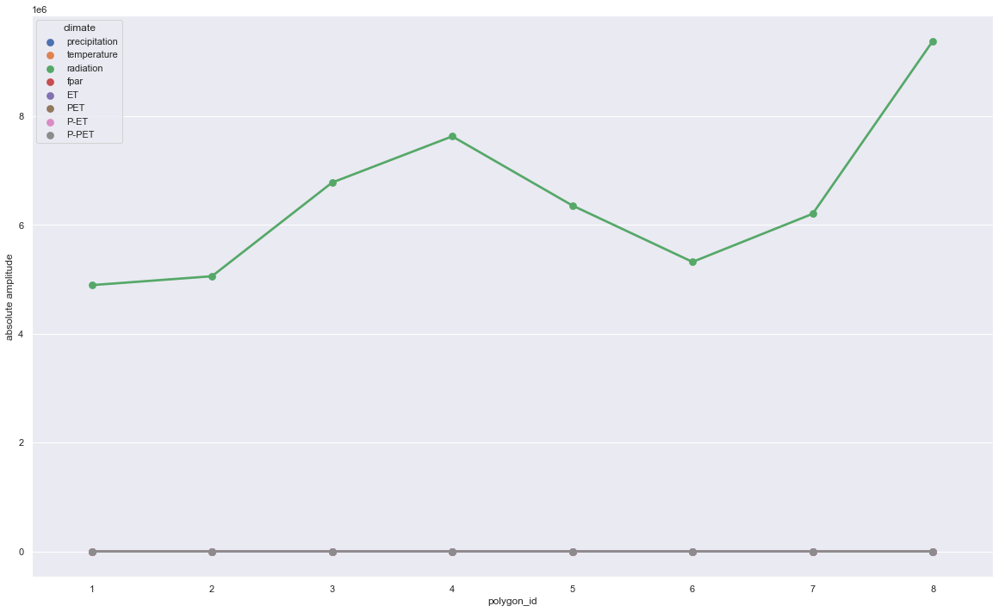

In [418]:
plt.rcParams['figure.figsize'] = [20, 12]
abs_amplitude_melt = pd.melt(abs_amplitudes, id_vars="polygon_id", var_name="climate", value_name="absolute amplitude")
abs_amplitude_melt
sns.pointplot(abs_amplitude_melt, x='polygon_id', y='absolute amplitude', hue='climate')

<AxesSubplot: xlabel='polygon_id', ylabel='seasonality nrmse'>

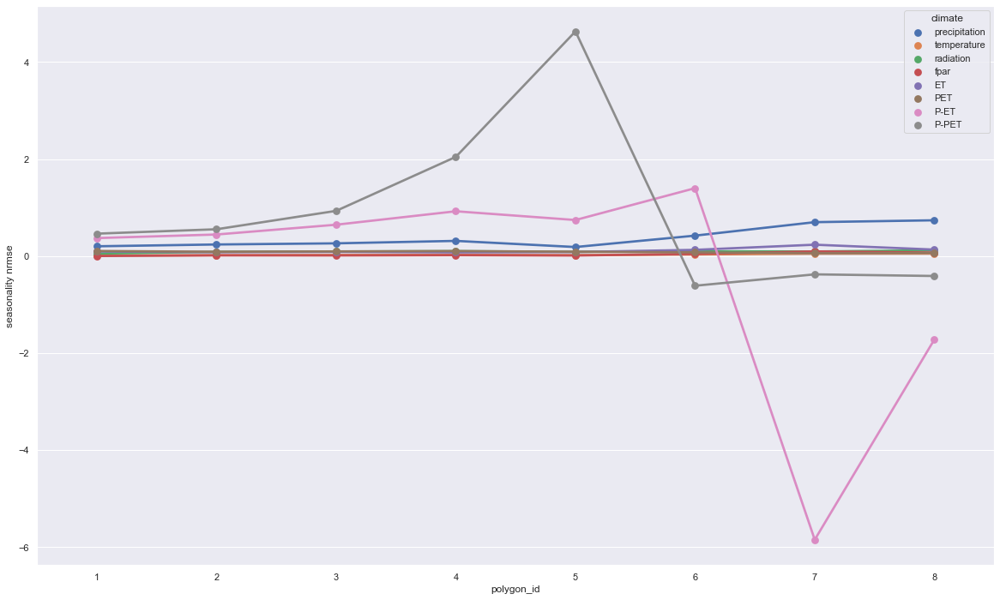

In [409]:
plt.rcParams['figure.figsize'] = [20, 12]
nrmse_melt = pd.melt(nrmse, id_vars="polygon_id", var_name="climate", value_name="seasonality nrmse")
sns.pointplot(nrmse_melt, x='polygon_id', y='seasonality nrmse', hue='climate')

<AxesSubplot: xlabel='polygon_id', ylabel='relative amplitude'>

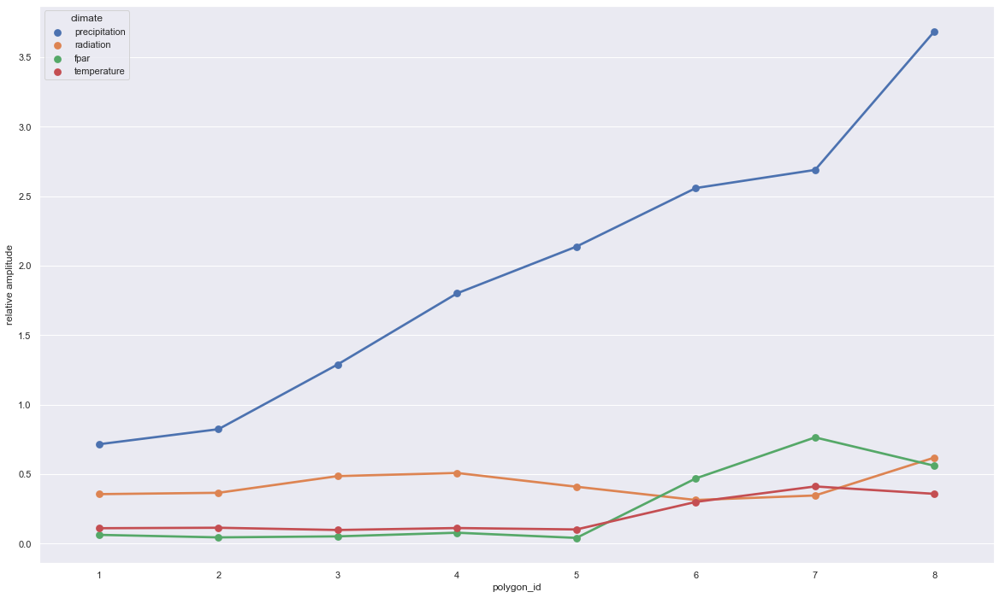

In [428]:
plt.rcParams['figure.figsize'] = [20, 12]
rel_amplitude_melt = pd.melt(rel_amplitudes[['precipitation', 'polygon_id', 'radiation', 'fpar', 'temperature']], id_vars="polygon_id", var_name="climate", value_name="relative amplitude")
rel_amplitude_melt
sns.pointplot(rel_amplitude_melt, x='polygon_id', y='relative amplitude', hue='climate')

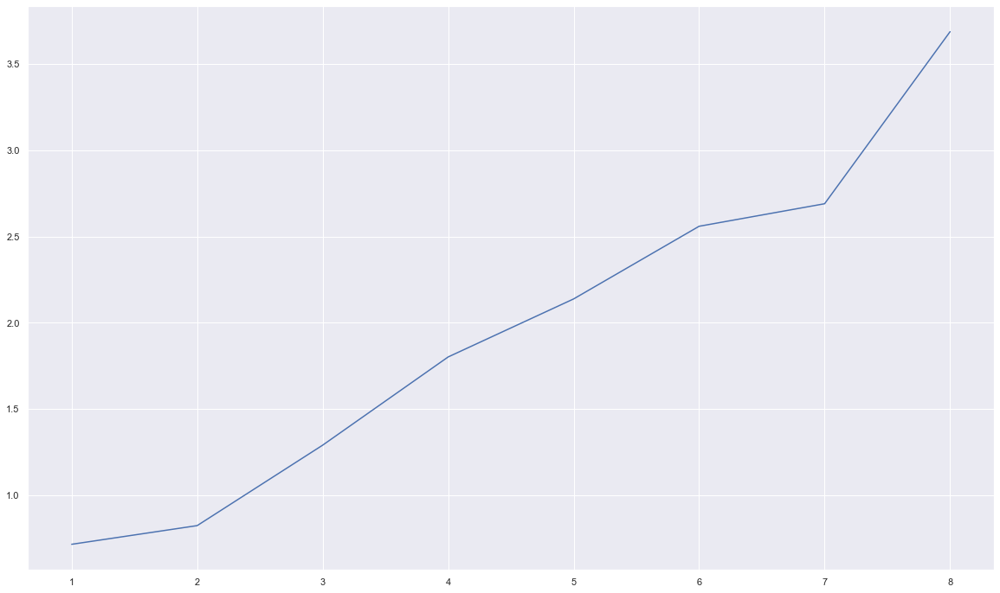

In [429]:
plt.plot(range(1, 9), rel_amplitudes['precipitation'])

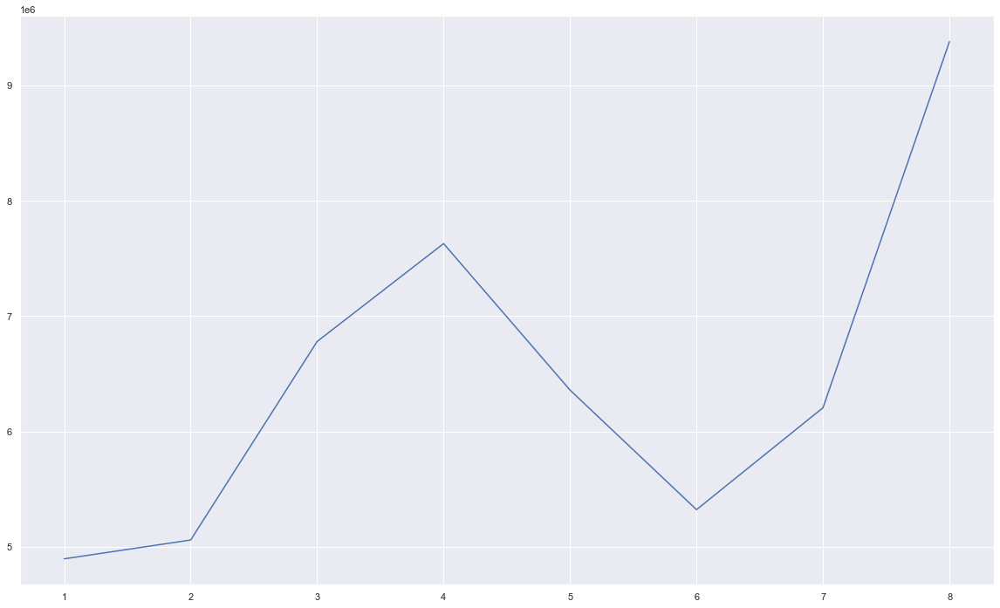

In [431]:
plt.plot(range(1, 9), abs_amplitudes['radiation'])

In [139]:
plt.plot(range(1, 9), nrmse['precipitation'])

NameError: name 'nrmse' is not defined

In [224]:
nrmse

,precipitation,temperature,radiation,fpar,ET,PET,polygon_id
1,0.397422,0.033507,0.159301,0.023779,0.213466,0.230117,1
2,0.513328,0.046325,0.138720,0.023235,0.149523,0.162495,2
3,0.631447,0.033910,0.198550,0.031597,0.179716,0.201069,3
4,0.605182,0.043238,0.148594,0.027876,0.155884,0.160898,4
5,1.302100,0.035591,0.118898,0.016424,0.224664,0.276310,5
6,1.295977,0.167498,0.192193,0.283288,0.881808,0.156092,6
7,1.219216,0.276965,0.208187,0.421196,0.910181,0.193119,7
8,2.253352,0.154101,0.261781,0.223581,0.522192,0.266810,8


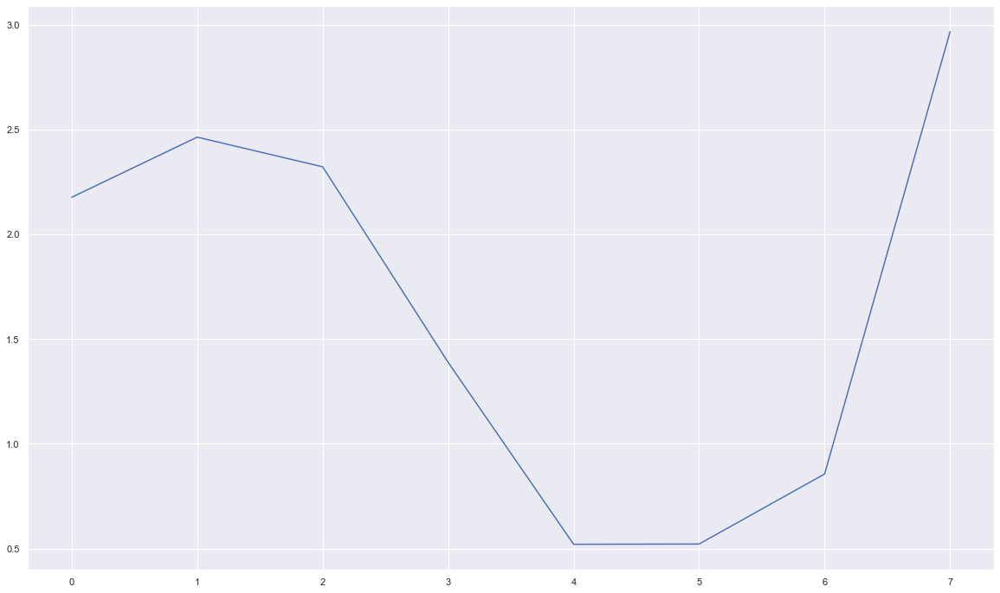

In [225]:
plt.plot(rmse['precipitation'])

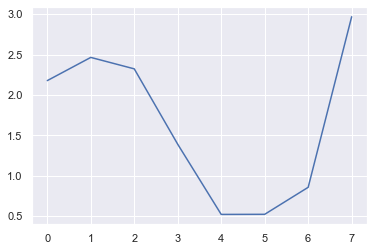

In [168]:
plt.plot(rmse['precipitation'])

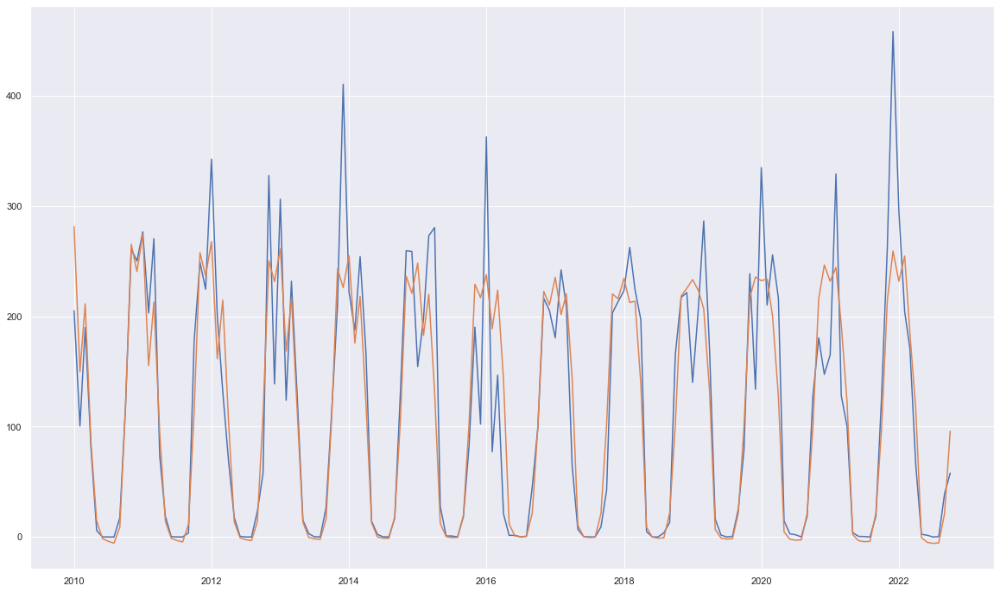

In [315]:
plt.plot(seasonals[seasonals.polygon_id == 7]['datetime'], climate_df[climate_df.polygon_id == 6]['precipitation'])
plt.plot(seasonals[seasonals.polygon_id == 7]['datetime'], seasonals[seasonals.polygon_id == 6]['precipitation'])

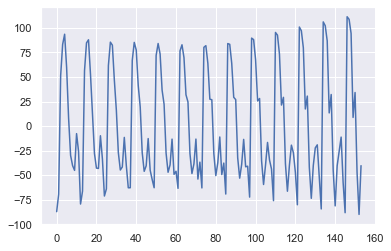

In [115]:
polygon_1 = seasonals[seasonals.polygon_id == 1]
plt.plot(polygon_1.index, polygon_1.precipitation)

### Dry Season

In [157]:
# First, we will try to detect a beginning of dry season using "The dry season is defined with monthly precipitation less than either 100 mm or one-third of the annual precipitation range"
import seaborn as sns
def plot_annual_precipitation(df, polygon_id):
    polygon_df = df[df.polygon_id == polygon_id]
    yearly = polygon_df.groupby('year').sum().reset_index()
    sns.lineplot(x=yearly.year, y=yearly.precipitation)

In [176]:
# First, we will try to detect a beginning of dry season using "The dry season is defined with monthly precipitation less than either 100 mm or one-third of the annual precipitation range"
import seaborn as sns
def get_dry_months(df, polygon_id):
    polygon_df = df[df.polygon_id == polygon_id]
    #for year in range(2013, 2023):
    #    polygon_yearly_df = polygon_df[polygon_df.year == year]
    sns.lineplot(x=polygon_df.month, y=polygon_df.precipitation)
    #plt.boxplot(polygon_yearly_df.precipitation)
    plt.show()

1


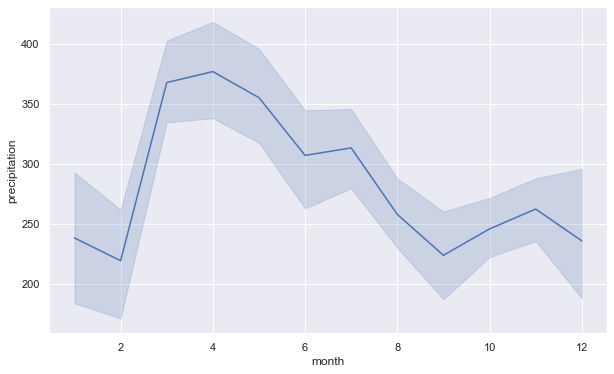

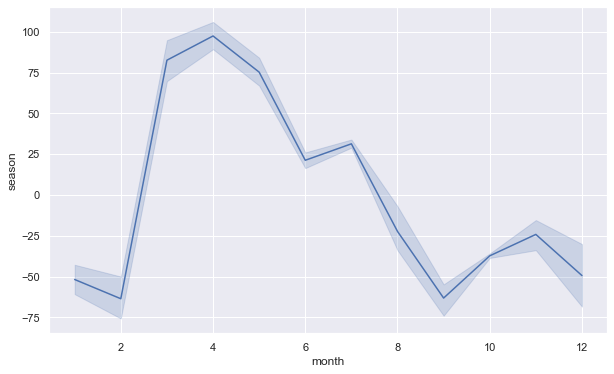

2


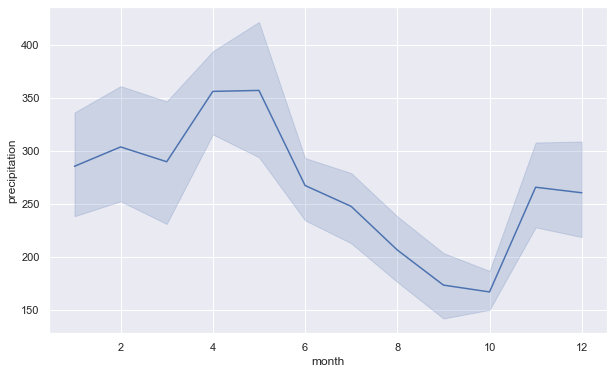

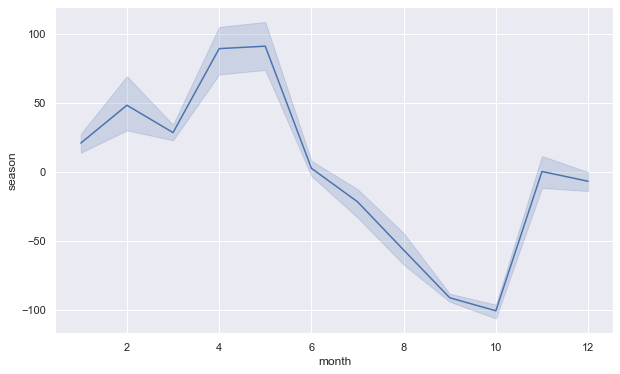

3


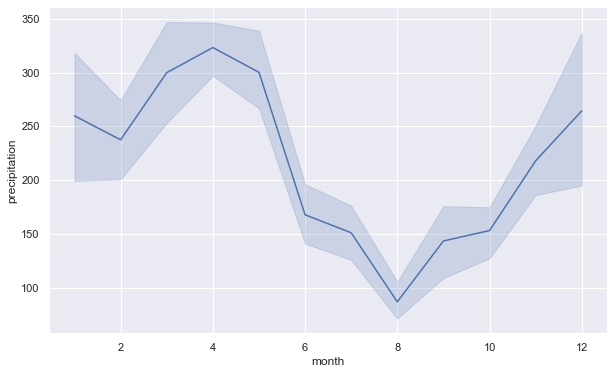

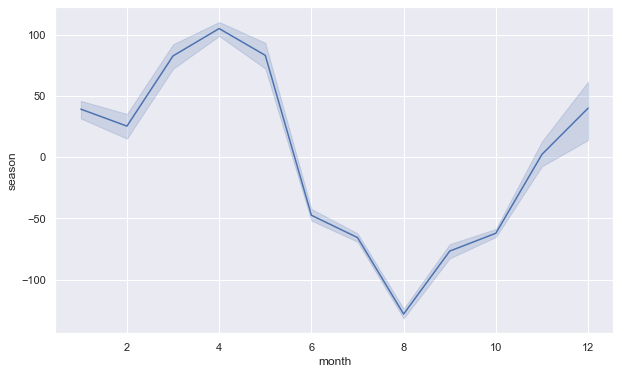

4


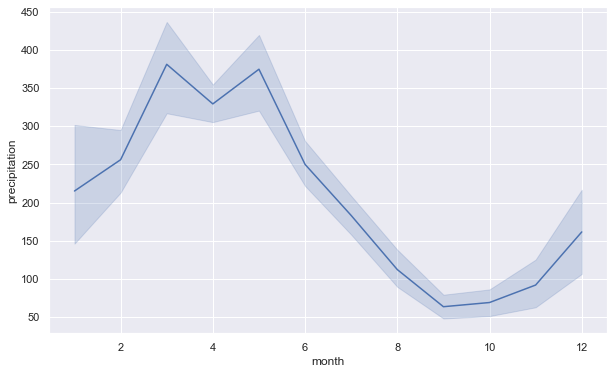

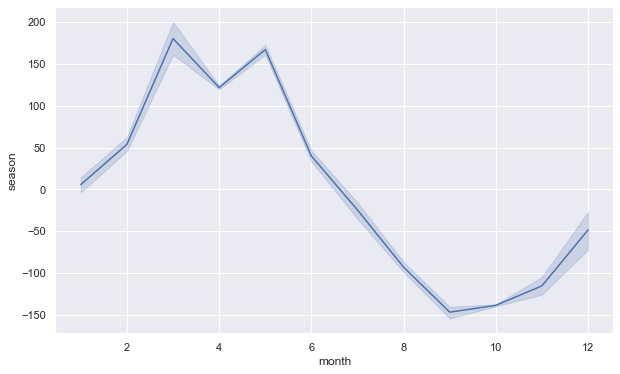

5


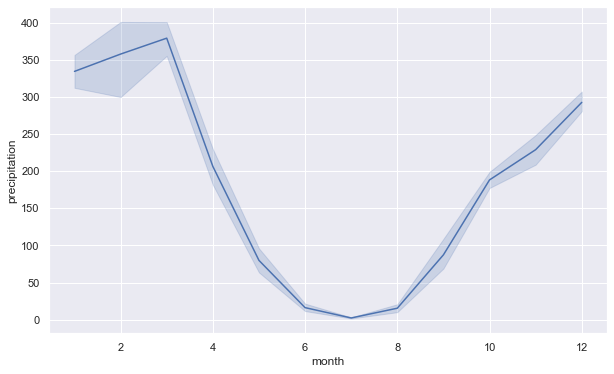

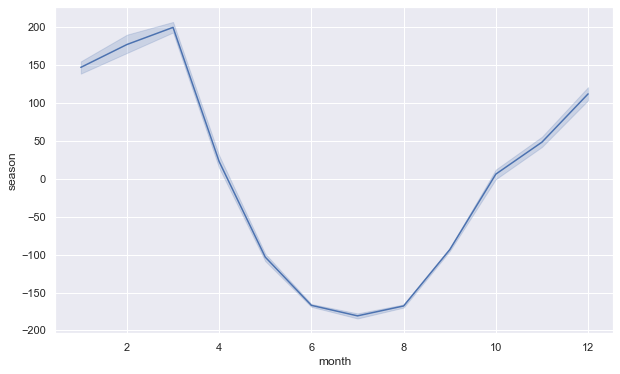

6


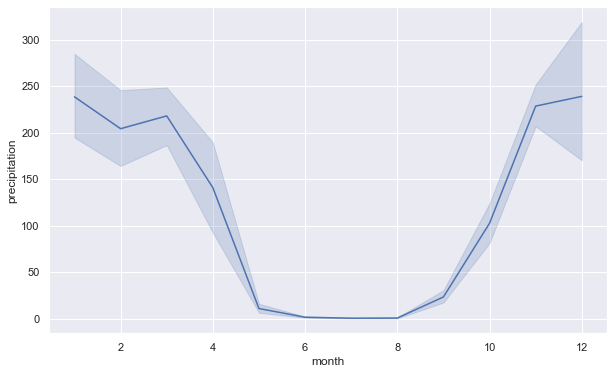

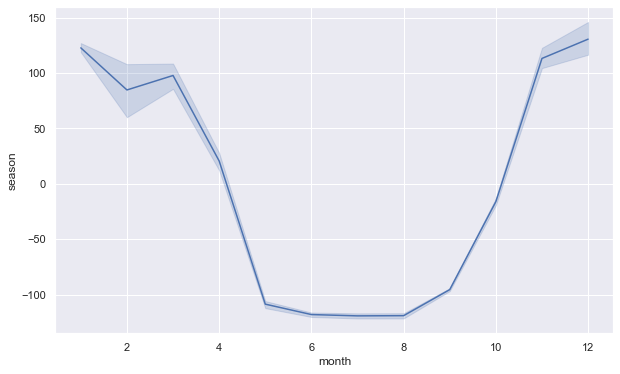

7


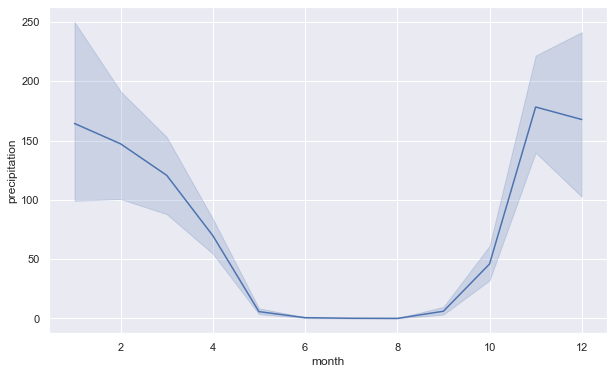

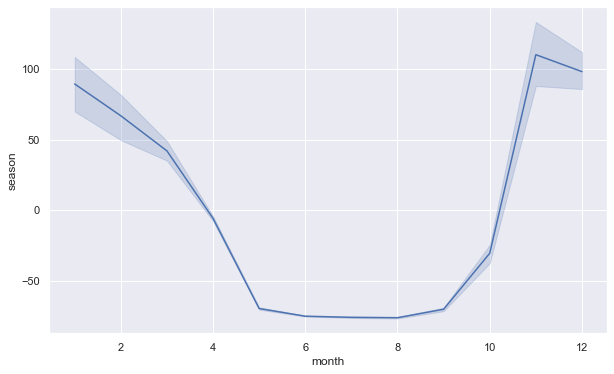

8


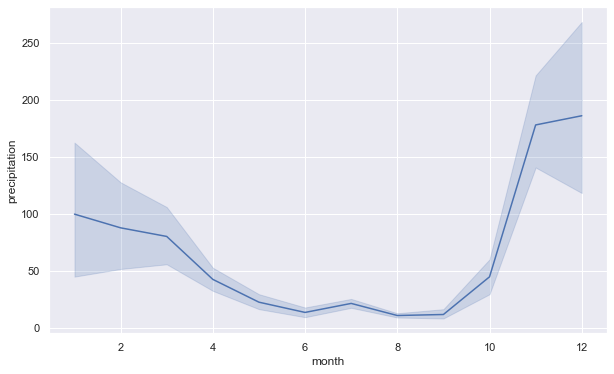

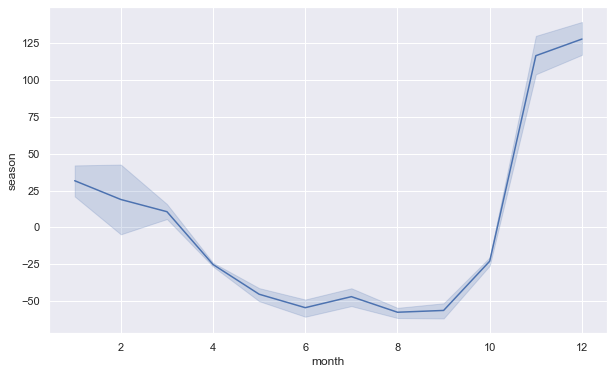

In [200]:
for polygon_id in range(1,9):
    print(polygon_id)
    get_dry_months(precip_monthly_mean, polygon_id)
    get_precipitation_seasonal(precip_monthly_mean, polygon_id)

In [201]:
# Dry season per polygon just eyeballed from the plots. TODO: Refine this
seasons = pd.DataFrame([[1, 9, 12], [2, 6, 10], [3, 6, 10], [4, 8, 11], [5, 5, 9], [6, 5, 10], [7, 4, 10], [8, 3, 10]],
    columns=['polygon_id', 'dry_start', 'dry_end'])
seasons

,polygon_id,dry_start,dry_end
0,1,9,12
1,2,6,10
2,3,6,10
3,4,8,11
4,5,5,9
5,6,5,10
6,7,4,10
7,8,3,10


### Methods for doing time series decomposition using statsmodel seasonal

In [33]:
def do_ts_decomposition(df, polygon_id, start_date, end_date, columns):
    polygon_ts = df.loc[df.polygon_id == polygon_id]
    polygon_ts = polygon_ts.sort_values('datetime')
    polygon_ts.index = pd.date_range(start=start_date, end=end_date, freq=pd.offsets.MonthBegin(1))

    decomps = {}
    for column in columns:
        #decomps[column] = seasonal.seasonal_decompose(polygon_ts[[column]], model='additive')
        decomps[column] = STL(polygon_ts[[column]], seasonal=13).fit()

    return decomps

def plot_ts_decompositions(ts_decomp_dict, columns):
    for column in columns:
        plt.rcParams['figure.figsize'] = [10, 6]
        ts_decomp_dict[column].plot()
        plt.show()

### Find missing data in timeseries

In [28]:
import numpy as np
monthly_index = pd.date_range(start=start, end=end, freq=pd.offsets.MonthBegin(1))
dummy_df = pd.DataFrame(np.random.randint(1, 20, (monthly_index.shape[0], 1)))
dummy_df.index = monthly_index

missing_dates = dummy_df.index[~dummy_df.index.isin(precip_monthly_mean.datetime)]
missing_dates

DatetimeIndex(['2022-12-01', '2023-01-01'], dtype='datetime64[ns]', freq='MS')

### Per Polygon decomp of water climate vars

In [34]:
ts_decomps = do_ts_decomposition(precip_monthly_mean, polygon_id=1, start_date=start, end_date=end, columns=['precipitation', 'ET', 'PET', 'water_deficit'])

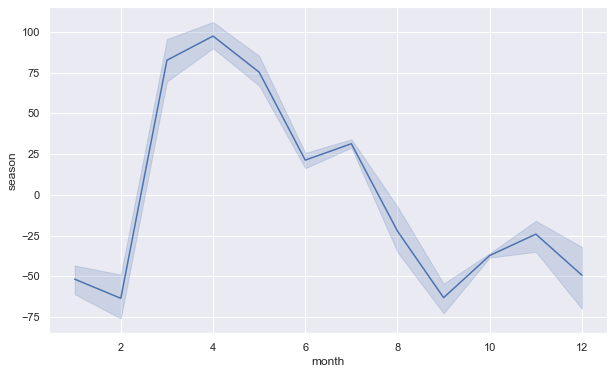

In [190]:
def get_precipitation_seasonal(df, polygon_id):
    decomposed = ts_decomps = do_ts_decomposition(df, polygon_id=polygon_id, start_date=start, end_date=end, columns=['precipitation'])
    p_seasonal = decomposed['precipitation'].seasonal
    p_seasonal_df = pd.DataFrame(p_seasonal)
    p_seasonal_df['year'] = pd.DatetimeIndex(p_seasonal_df.index).year
    p_seasonal_df['month'] = pd.DatetimeIndex(p_seasonal_df.index).month
    sns.lineplot(x=p_seasonal_df.month, y=p_seasonal_df.season)
    #plt.boxplot(polygon_yearly_df.precipitation)
    plt.show()
#plot_ts_decompositions(ts_decomps, columns=['precipitation', 'ET', 'PET', 'water_deficit'])
get_precipitation_seasonal(precip_monthly_mean, 1)

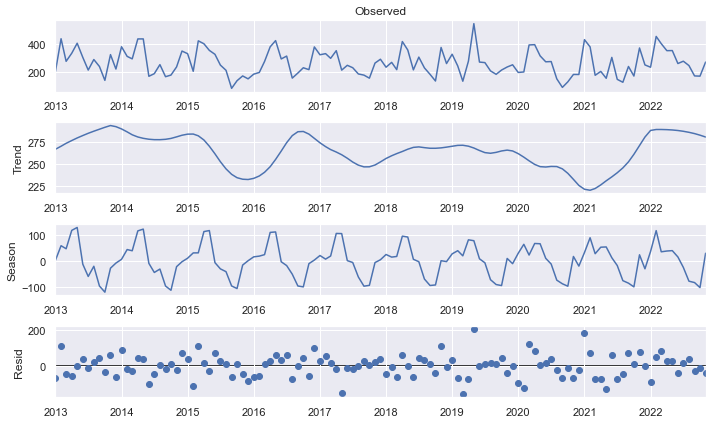

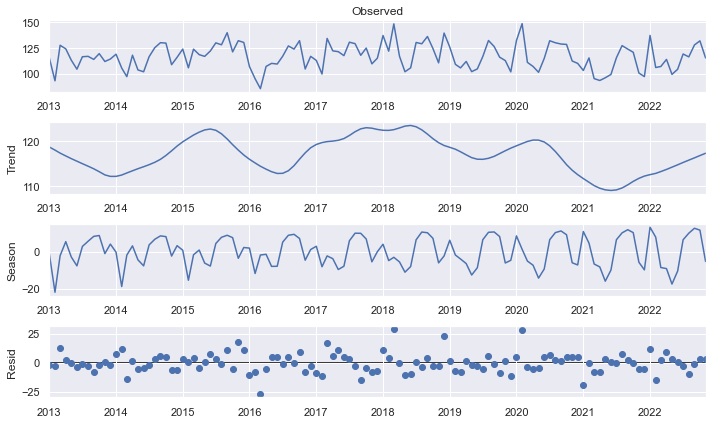

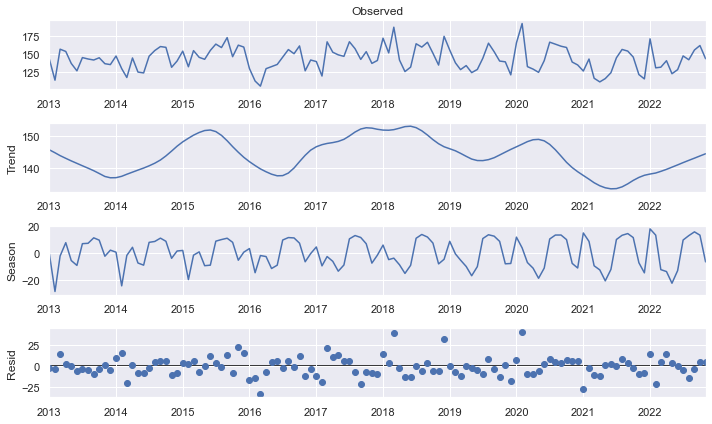

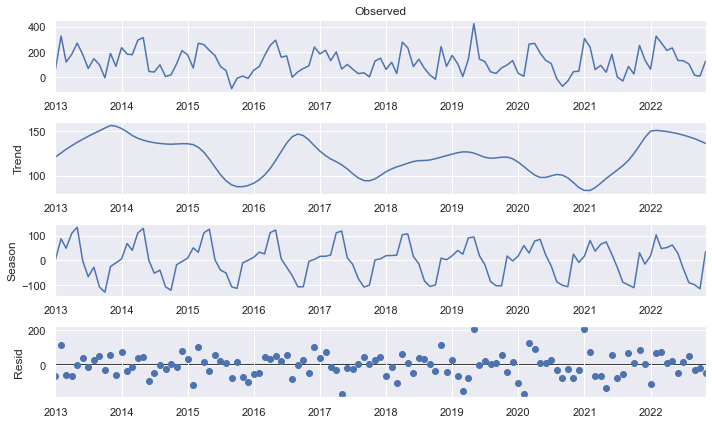

In [36]:
ts_decomps = do_ts_decomposition(precip_monthly_mean, polygon_id=2, start_date=start, end_date=end, columns=['precipitation', 'ET', 'PET', 'water_deficit'])
plot_ts_decompositions(ts_decomps, columns=['precipitation', 'ET', 'PET', 'water_deficit'])

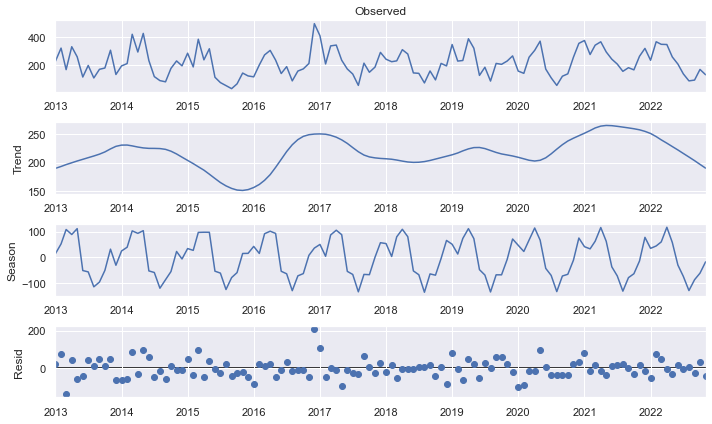

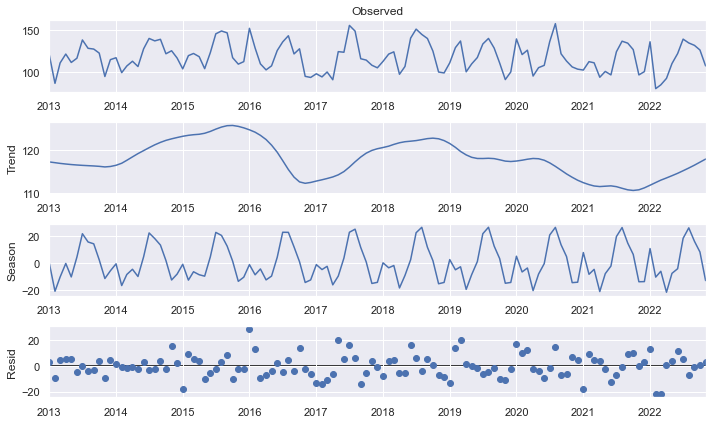

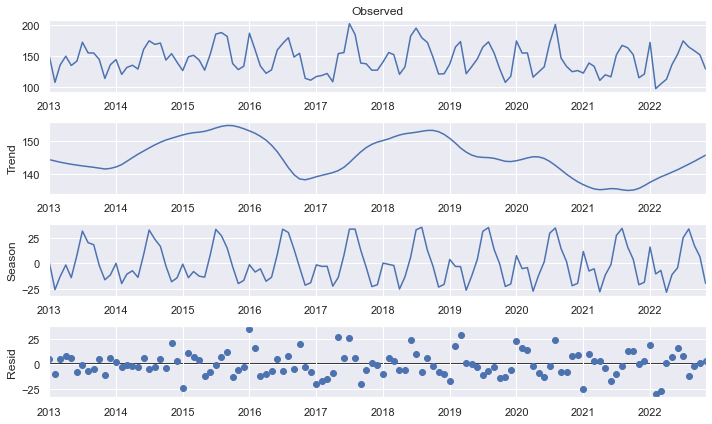

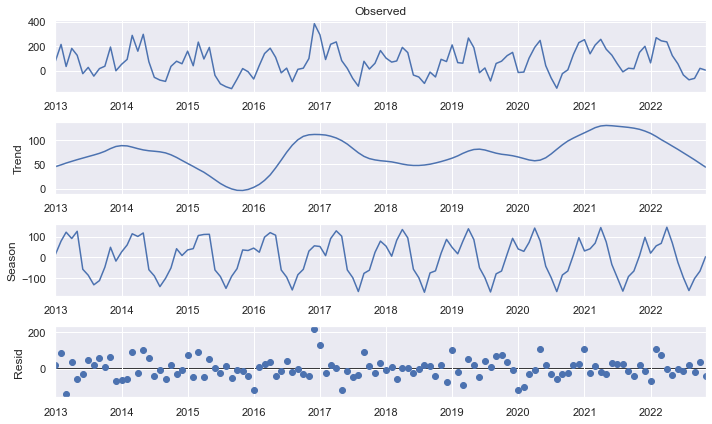

In [37]:
ts_decomps = do_ts_decomposition(precip_monthly_mean, polygon_id=3, start_date=start, end_date=end, columns=['precipitation', 'ET', 'PET', 'water_deficit'])
plot_ts_decompositions(ts_decomps, columns=['precipitation', 'ET', 'PET', 'water_deficit'])

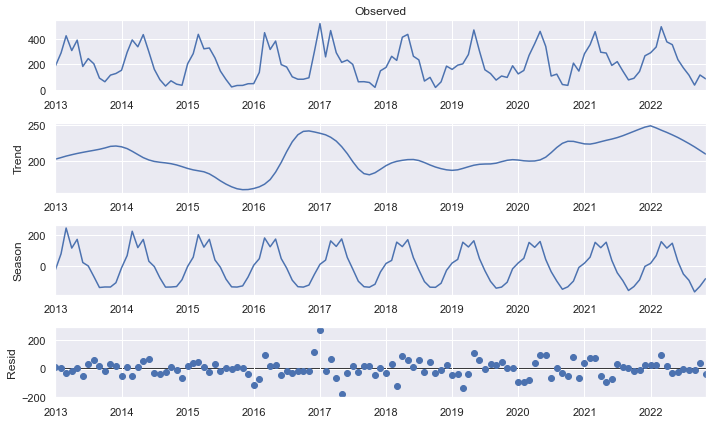

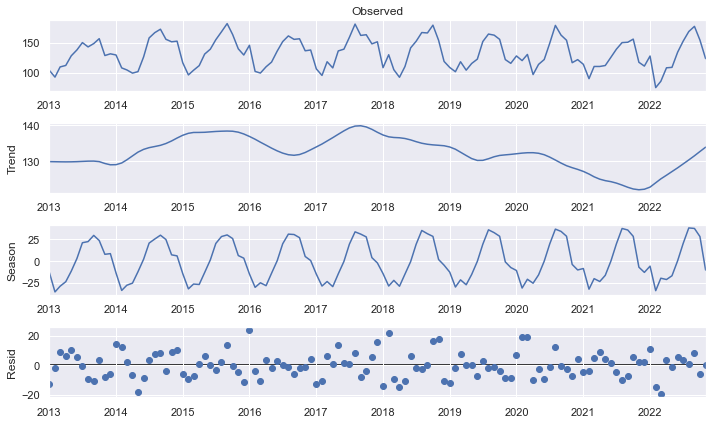

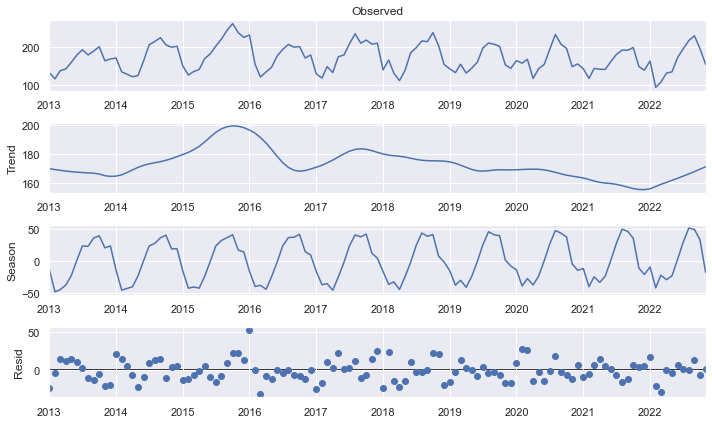

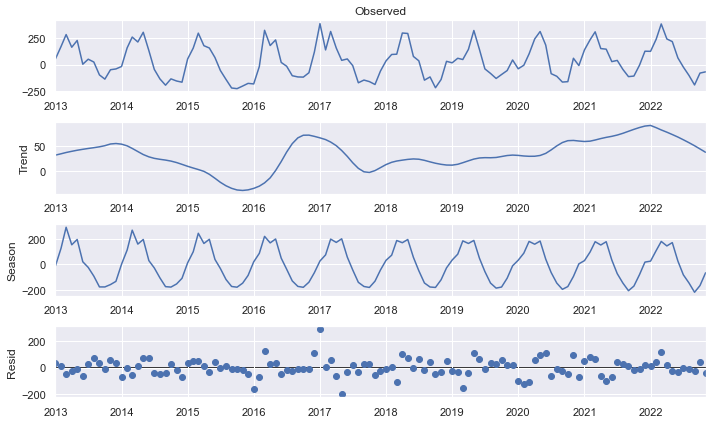

In [38]:
ts_decomps = do_ts_decomposition(precip_monthly_mean, polygon_id=4, start_date=start, end_date=end, columns=['precipitation', 'ET', 'PET', 'water_deficit'])
plot_ts_decompositions(ts_decomps, columns=['precipitation', 'ET', 'PET', 'water_deficit'])

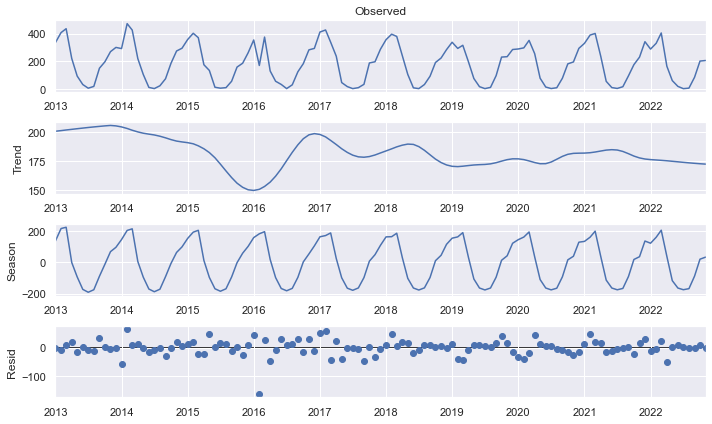

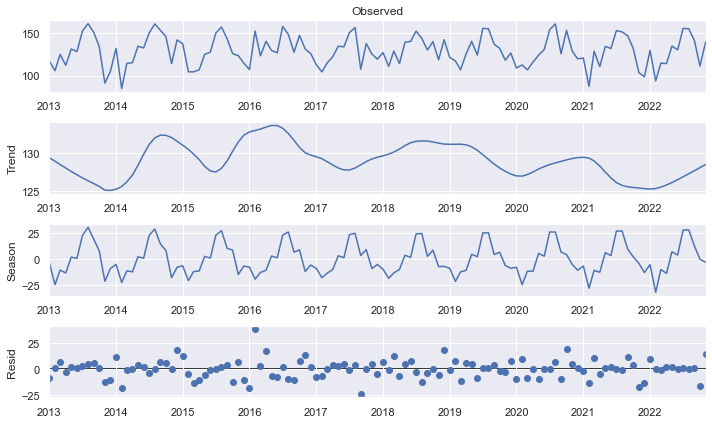

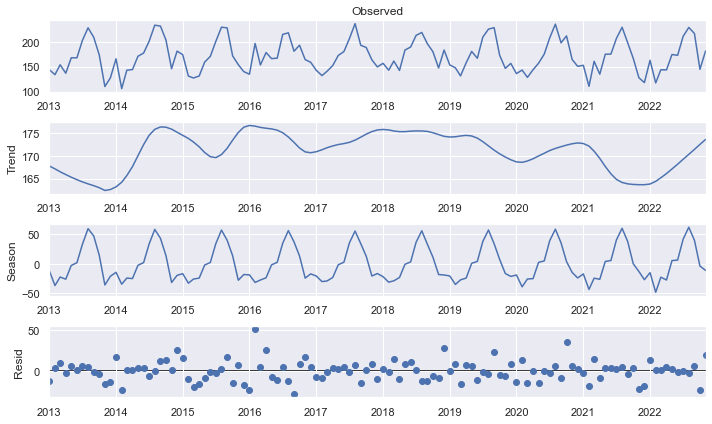

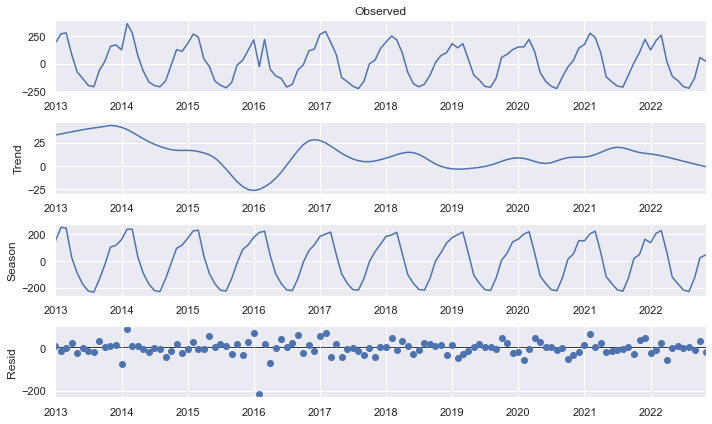

In [39]:
ts_decomps = do_ts_decomposition(precip_monthly_mean, polygon_id=5, start_date=start, end_date=end, columns=['precipitation', 'ET', 'PET', 'water_deficit'])
plot_ts_decompositions(ts_decomps, columns=['precipitation', 'ET', 'PET', 'water_deficit'])

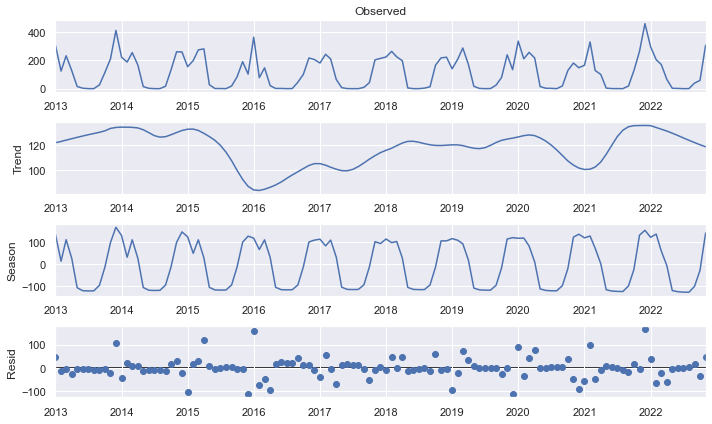

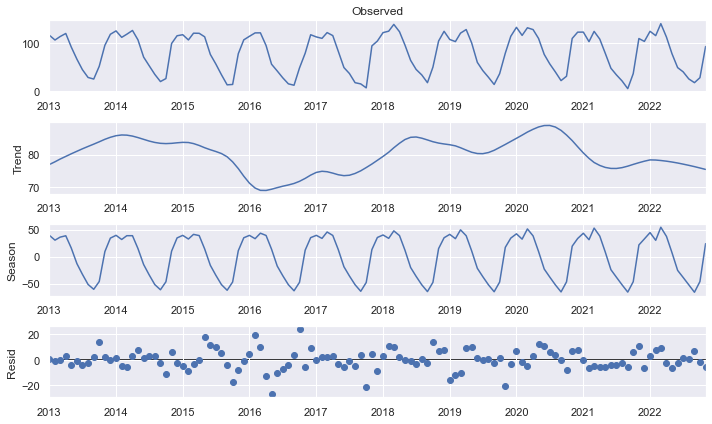

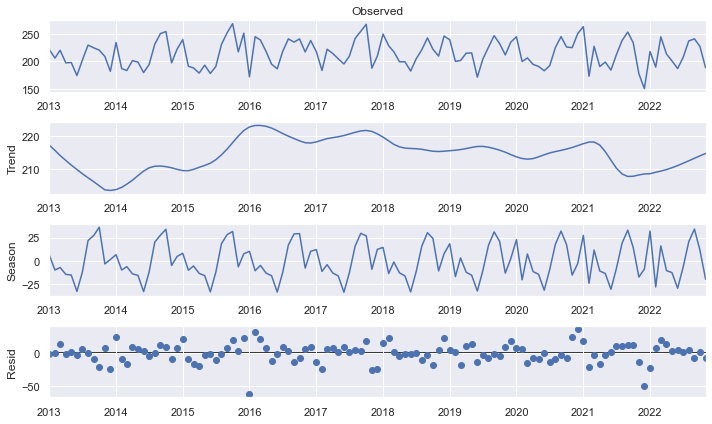

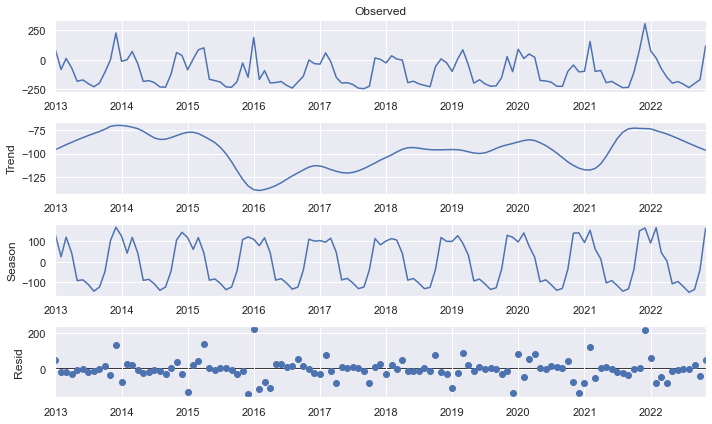

In [40]:
ts_decomps = do_ts_decomposition(precip_monthly_mean, polygon_id=6, start_date=start, end_date=end, columns=['precipitation', 'ET', 'PET', 'water_deficit'])
plot_ts_decompositions(ts_decomps, columns=['precipitation', 'ET', 'PET', 'water_deficit'])

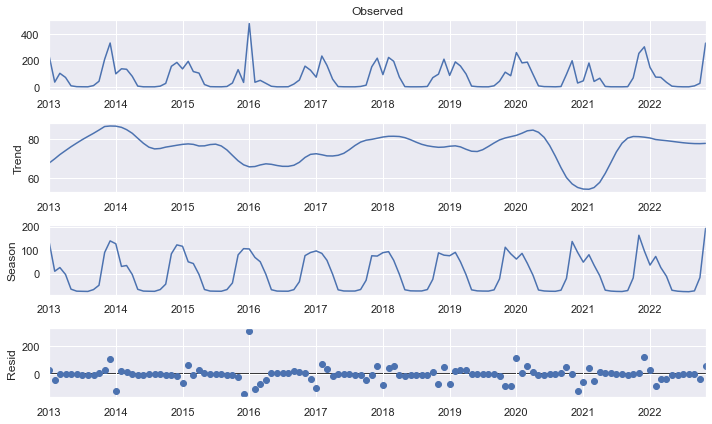

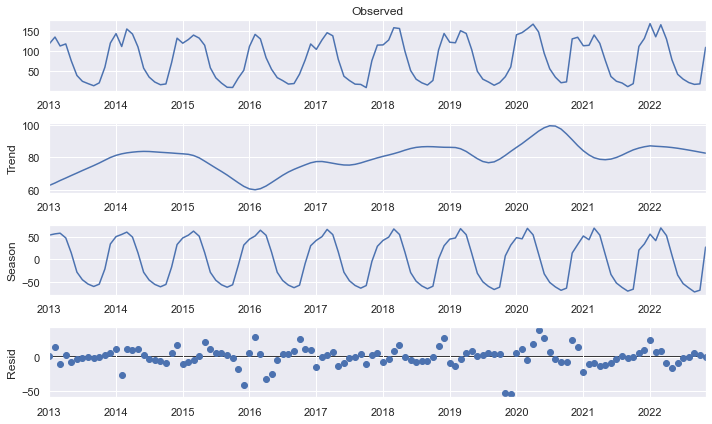

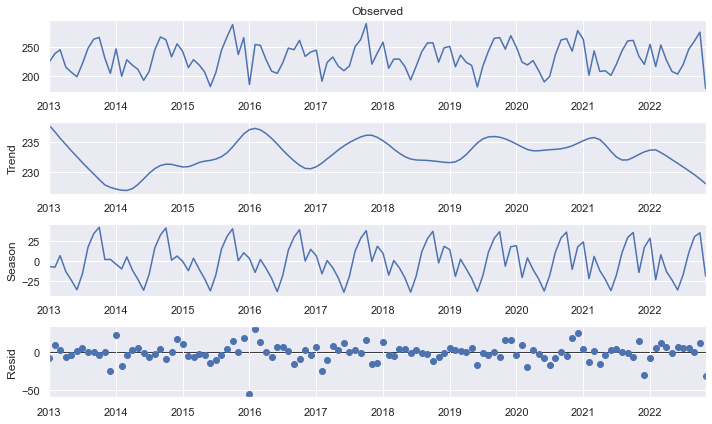

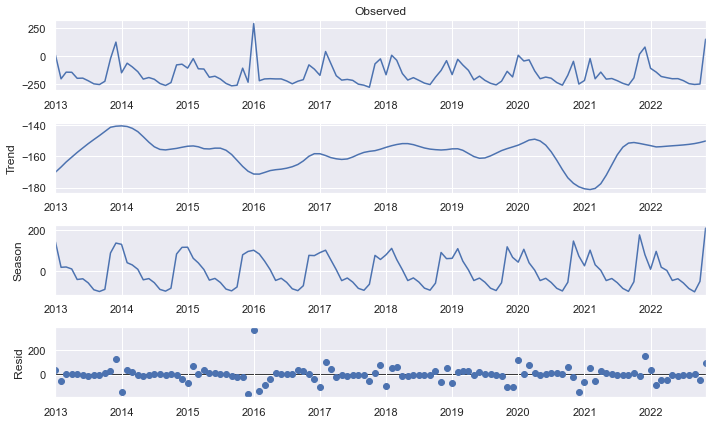

In [41]:
ts_decomps = do_ts_decomposition(precip_monthly_mean, polygon_id=7, start_date=start, end_date=end, columns=['precipitation', 'ET', 'PET', 'water_deficit'])
plot_ts_decompositions(ts_decomps, columns=['precipitation', 'ET', 'PET', 'water_deficit'])

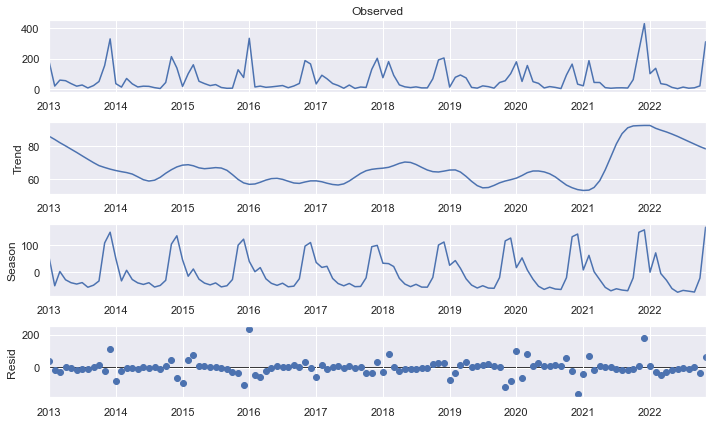

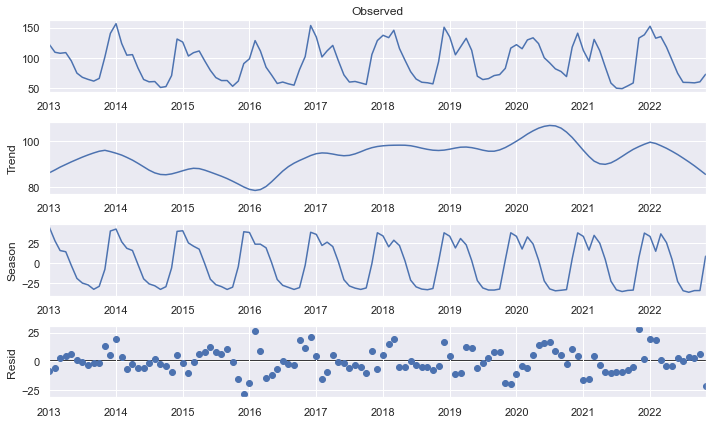

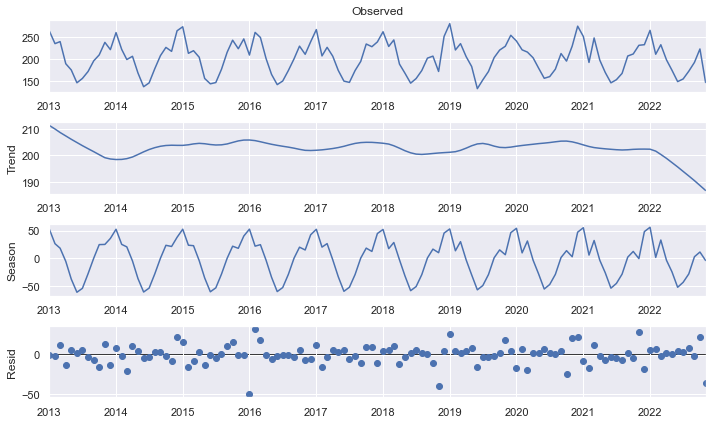

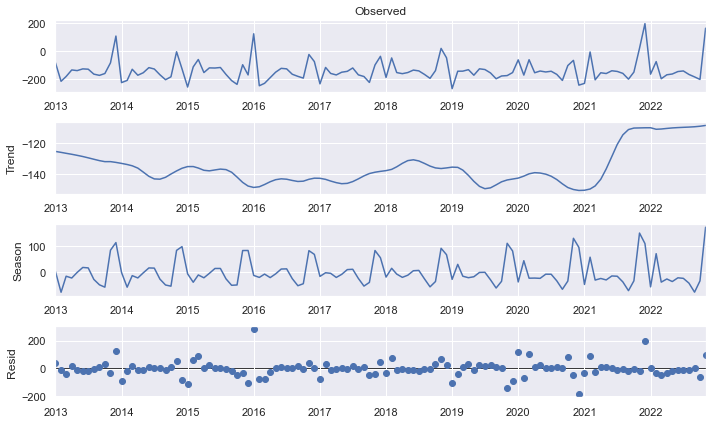

In [42]:
ts_decomps = do_ts_decomposition(precip_monthly_mean, polygon_id=8, start_date=start, end_date=end, columns=['precipitation', 'ET', 'PET', 'water_deficit'])
plot_ts_decompositions(ts_decomps, columns=['precipitation', 'ET', 'PET', 'water_deficit'])

## Seasonal decomposition using Fourier

In [120]:
def plot_fft(df, polygon_id, column):
    ts = df[df.polygon_id==polygon_id].sort_values('datetime')[column].to_numpy()
    y_fft = fftpack.fft(ts - ts.mean())
    xf = fftfreq(119, 1/12)
    return y_fft
    #plt.stem(xf, np.abs(y_fft))
    #plt.show()

[]

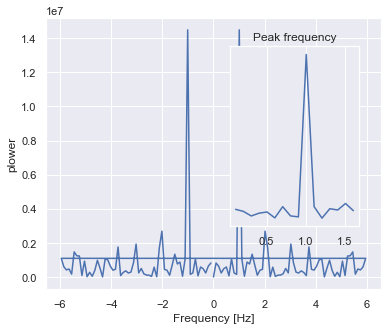

In [142]:
# The FFT of the signal
time_step = 1
y = precip_monthly_mean[precip_monthly_mean.polygon_id==1].sort_values('datetime').precipitation.to_numpy()
sig_fft = fftpack.fft(y - y.mean())

# And the power (sig_fft is of complex dtype)
power = np.abs(sig_fft)**2
period = 24

# The corresponding frequencies
sample_freq = fftpack.fftfreq(119, d=1/12)

# Plot the FFT power
plt.figure(figsize=(6, 5))
plt.plot(sample_freq, power)
plt.xlabel('Frequency [Hz]')
plt.ylabel('plower')

# Find the peak frequency: we can focus on only the positive frequencies
pos_mask = np.where(sample_freq > 0)
freqs = sample_freq[pos_mask]
peak_freq = freqs[power[pos_mask].argmax()]

# Check that it does indeed correspond to the frequency that we generate
# the signal with
np.allclose(peak_freq, 1./period)

# An inner plot to show the peak frequency
axes = plt.axes([0.55, 0.3, 0.3, 0.5])
plt.title('Peak frequency')
plt.plot(freqs[:16], power[pos_mask][:16])
plt.setp(axes, yticks=[])

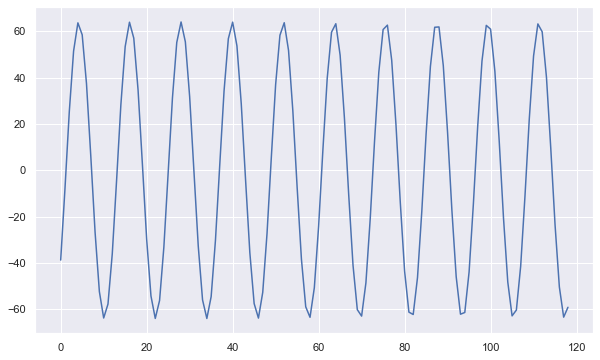

In [146]:
high_freq_fft = sig_fft.copy()
high_freq_fft[np.abs(sample_freq) != peak_freq] = 0
filtered_sig = fftpack.ifft(high_freq_fft)
plt.plot(filtered_sig)
#plt.stem(sample_freq, np.abs(high_freq_fft))
#plt.show()
#filtered_sig = fftpack.ifft(high_freq_fft)

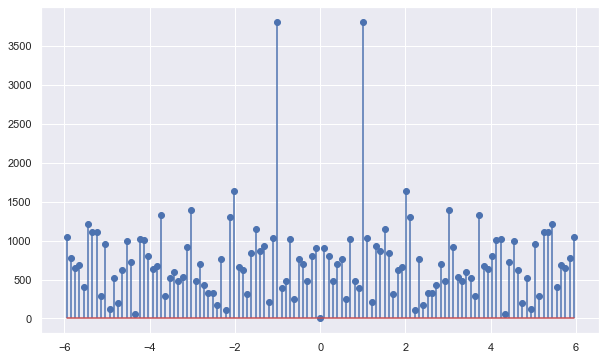

19.833333333333332

In [127]:
SAMPLE_RATE = 12
xf = fftfreq(119, 1/12)
points_per_freq = len(xf) / (SAMPLE_RATE / 2)
target_idx = int(points_per_freq * 100)
yf = plot_fft(precip_monthly_mean, 1, 'precipitation')
yf[target_idx - 1 : target_idx + 2] = 0

plt.stem(xf, np.abs(yf))
plt.show()
points_per_freq

(721.0310121974435+558.0401511314665j)


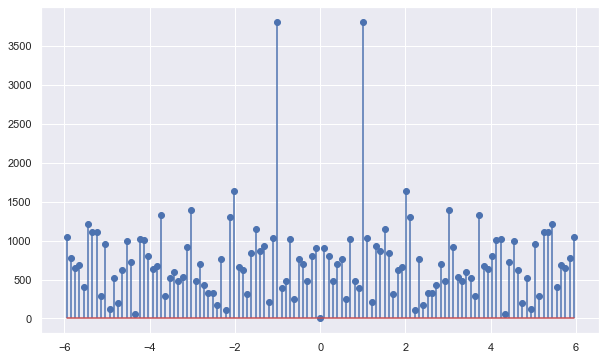

(887.9975141590828+357.25437750561576j)


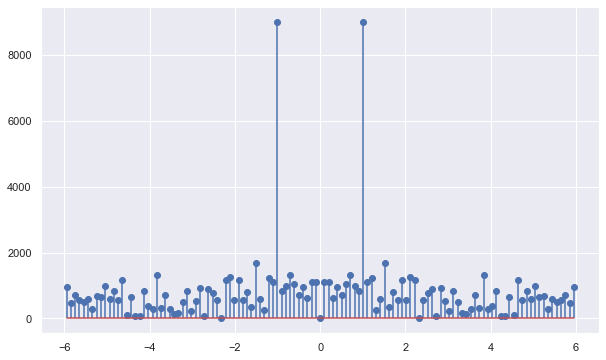

(757.2617525841582+475.0615521019139j)


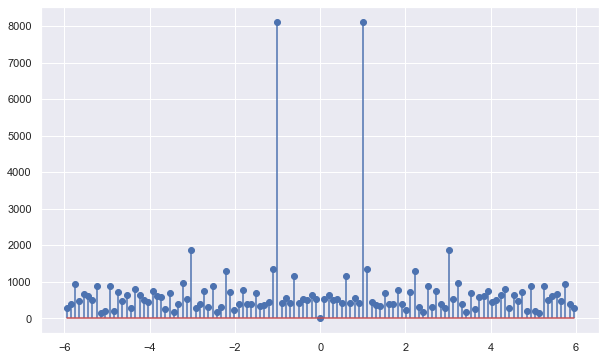

(762.2915863887225+294.2449282236661j)


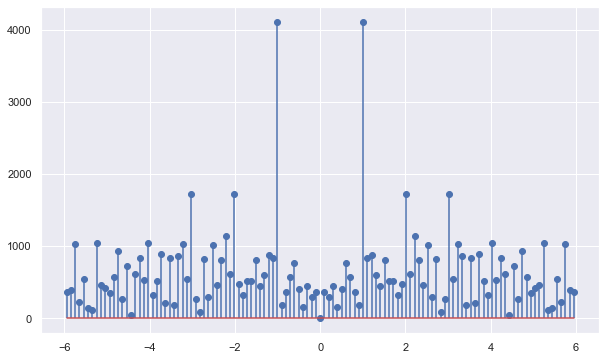

In [117]:
plot_fft(precip_monthly_mean, 1, 'precipitation')
plot_fft(precip_monthly_mean, 4, 'precipitation')
plot_fft(precip_monthly_mean, 6, 'precipitation')
plot_fft(precip_monthly_mean, 8, 'precipitation')

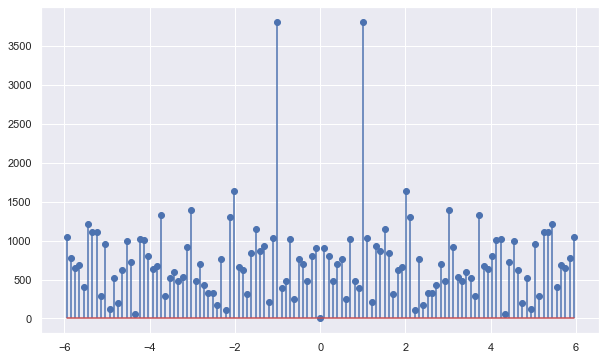

In [104]:
plot_fft(precip_monthly_mean, 8, 'precipitation')

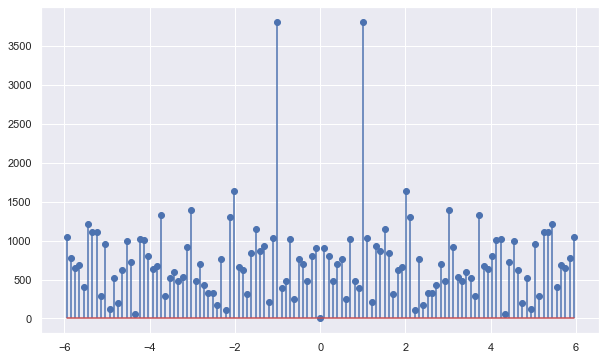

In [96]:
precip_ts = precip_monthly_mean[precip_monthly_mean.polygon_id==1].sort_values('datetime').precipitation.to_numpy()
y_fft = fftpack.fft(precip_ts - precip_ts.mean())
xf = fftfreq(119, 1/12)
plt.stem(xf, np.abs(y_fft))
plt.show()

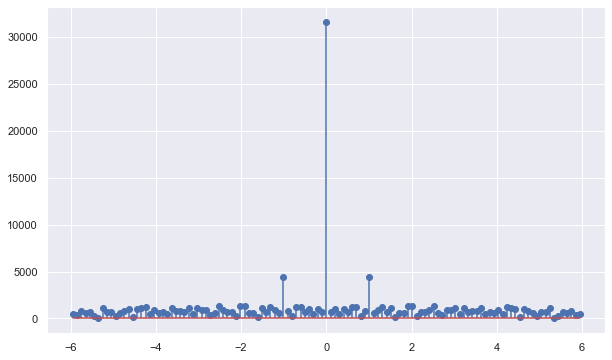

In [88]:
precip_ts = precip_monthly_mean[precip_monthly_mean.polygon_id==2].sort_values('datetime').precipitation.to_numpy()
y_fft = fftpack.fft(precip_ts)
xf = fftfreq(119, 1/12)
plt.stem(xf, np.abs(y_fft))
plt.show()

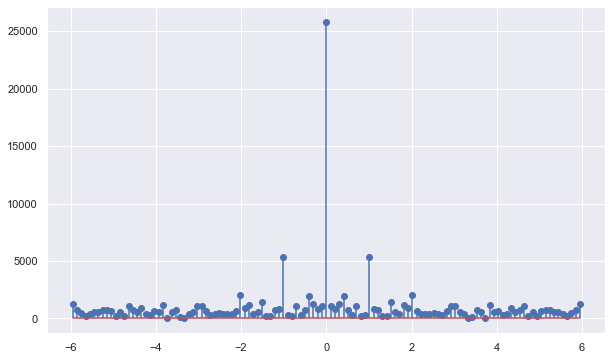

In [89]:
precip_ts = precip_monthly_mean[precip_monthly_mean.polygon_id==3].sort_values('datetime').precipitation.to_numpy()
y_fft = fftpack.fft(precip_ts)
xf = fftfreq(119, 1/12)
plt.stem(xf, np.abs(y_fft))
plt.show()

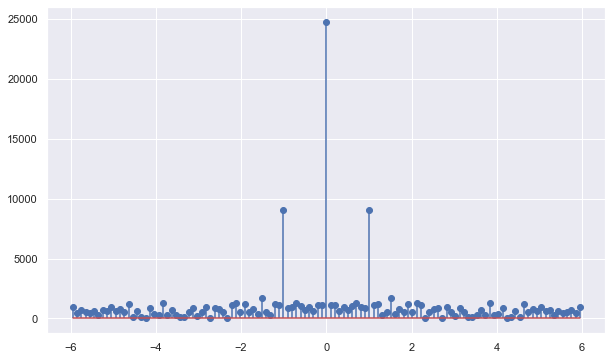

In [90]:
precip_ts = precip_monthly_mean[precip_monthly_mean.polygon_id==4].sort_values('datetime').precipitation.to_numpy()
y_fft = fftpack.fft(precip_ts)
xf = fftfreq(119, 1/12)
plt.stem(xf, np.abs(y_fft))
plt.show()

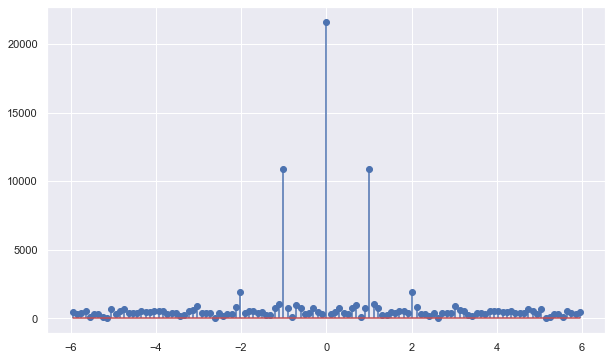

In [91]:
precip_ts = precip_monthly_mean[precip_monthly_mean.polygon_id==5].sort_values('datetime').precipitation.to_numpy()
y_fft = fftpack.fft(precip_ts)
xf = fftfreq(119, 1/12)
plt.stem(xf, np.abs(y_fft))
plt.show()

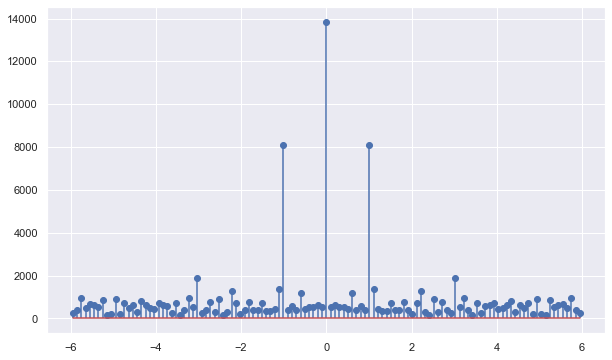

In [92]:
precip_ts = precip_monthly_mean[precip_monthly_mean.polygon_id==6].sort_values('datetime').precipitation.to_numpy()
y_fft = fftpack.fft(precip_ts)
xf = fftfreq(119, 1/12)
plt.stem(xf, np.abs(y_fft))
plt.show()

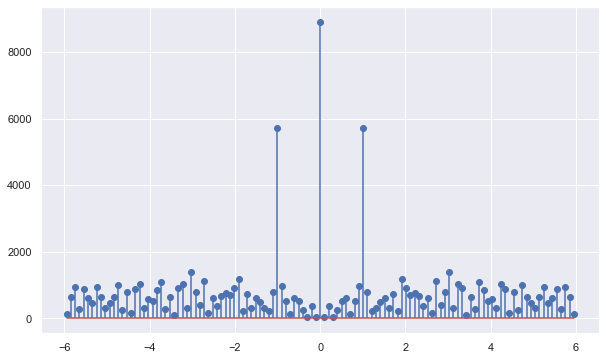

In [93]:
precip_ts = precip_monthly_mean[precip_monthly_mean.polygon_id==7].sort_values('datetime').precipitation.to_numpy()
y_fft = fftpack.fft(precip_ts)
xf = fftfreq(119, 1/12)
plt.stem(xf, np.abs(y_fft))
plt.show()

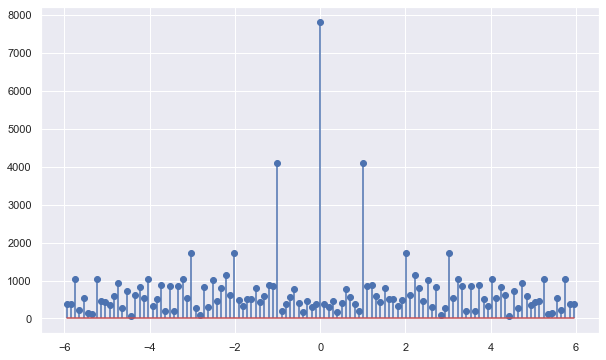

In [94]:
precip_ts = precip_monthly_mean[precip_monthly_mean.polygon_id==8].sort_values('datetime').precipitation.to_numpy()
y_fft = fftpack.fft(precip_ts)
xf = fftfreq(119, 1/12)
plt.stem(xf, np.abs(y_fft))
plt.show()

## Seasonal Decomposition for Polygon 2

In [133]:
ts_decomps = do_ts_decomposition(monthly_data, polygon_id=2, start_date=start_date, end_date=end_date, columns=['radiation', 'precipitation', 'pai', 'temperature'])

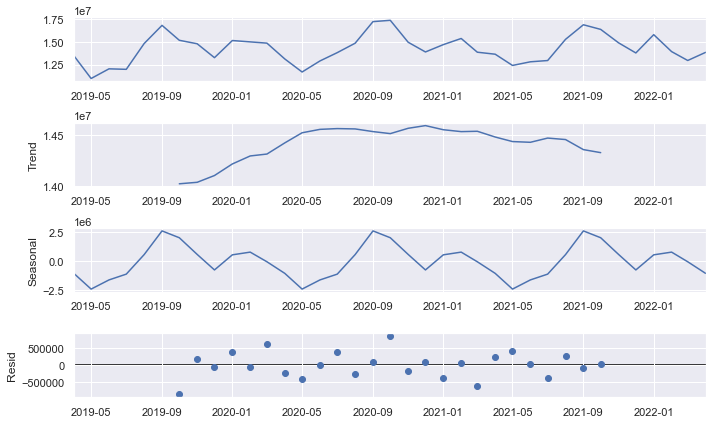

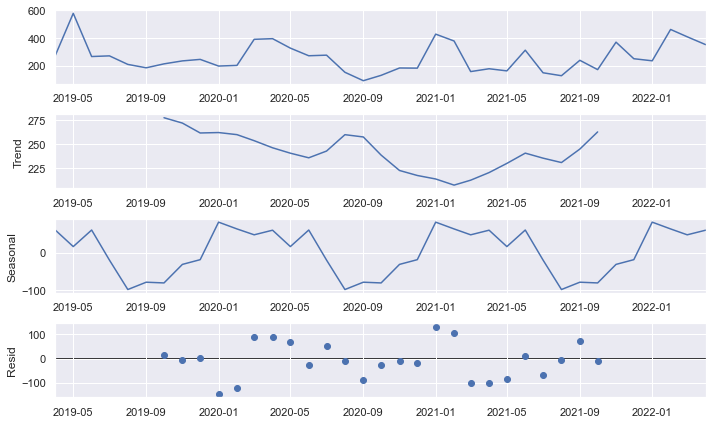

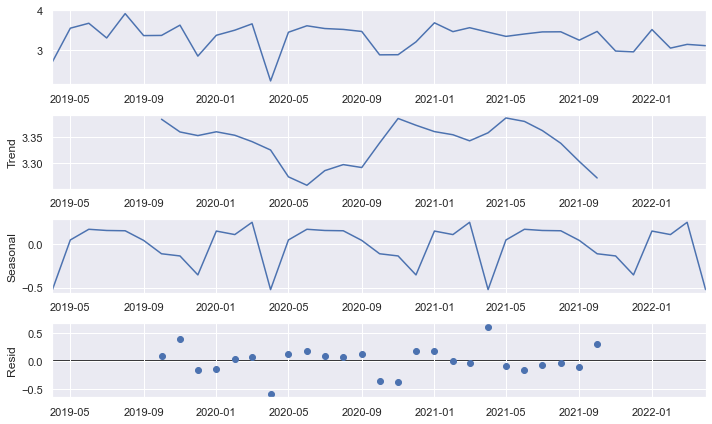

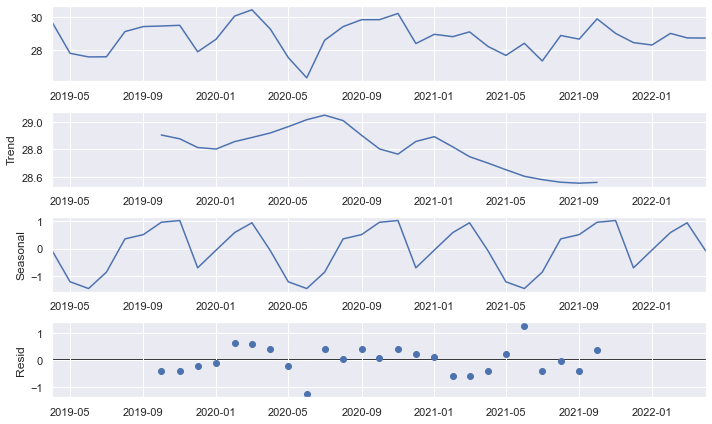

In [137]:
plot_ts_decompositions(ts_decomps, columns=['radiation', 'precipitation', 'pai', 'temperature'])

## Seasonal Decomposition for Polygon 4

In [144]:
ts_decomps = do_ts_decomposition(monthly_data, polygon_id=4, start_date=start_date, end_date=end_date, columns=['radiation', 'precipitation', 'pai', 'temperature'])

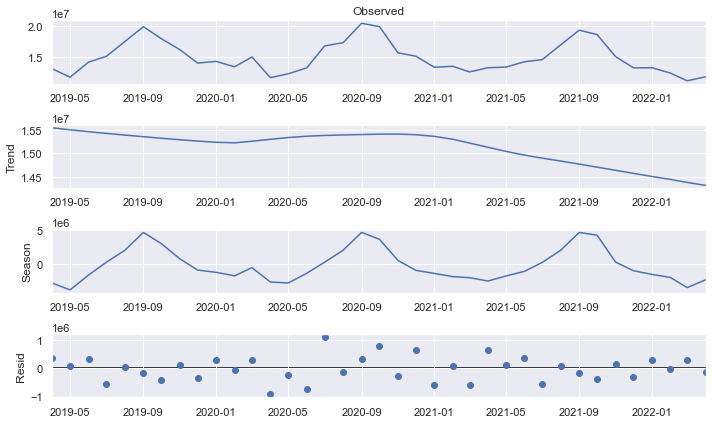

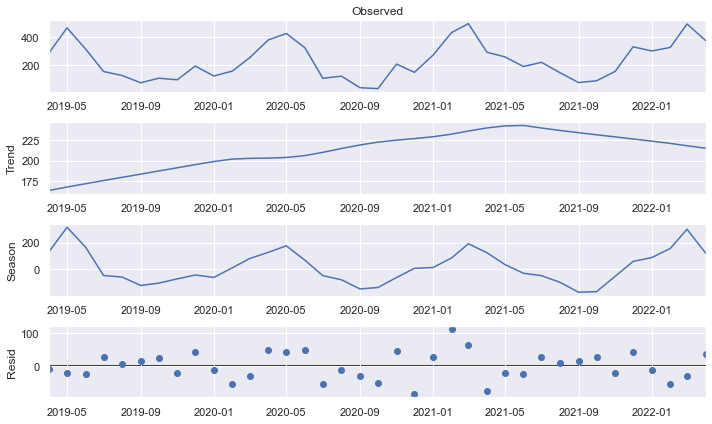

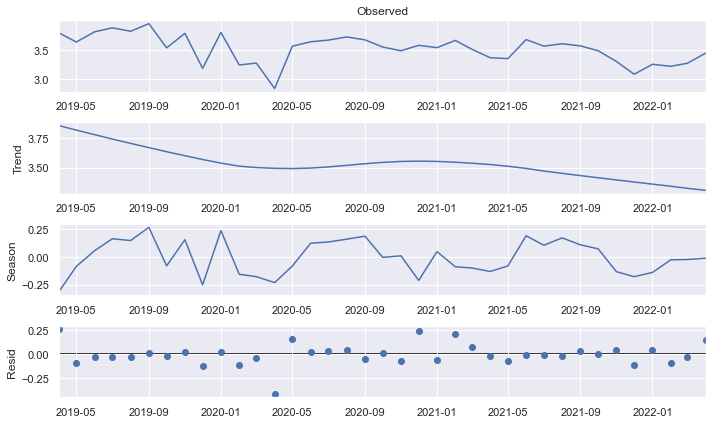

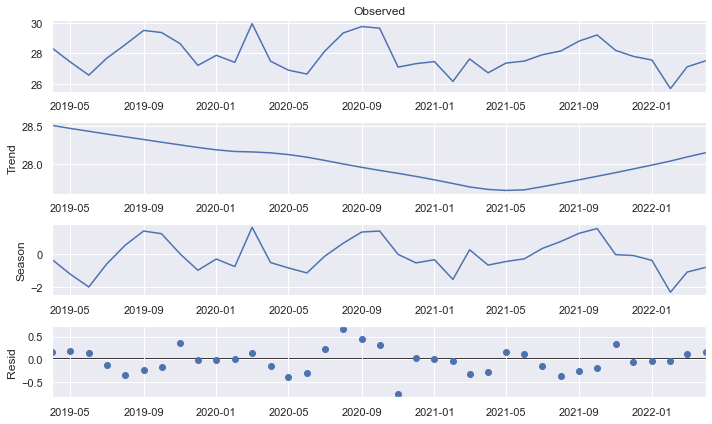

In [145]:
plot_ts_decompositions(ts_decomps, columns=['radiation', 'precipitation', 'pai', 'temperature'])

## Seasonal Decomposition for Polygon 5

In [146]:
ts_decomps = do_ts_decomposition(monthly_data, polygon_id=5, start_date=start_date, end_date=end_date, columns=['radiation', 'precipitation', 'pai', 'temperature'])

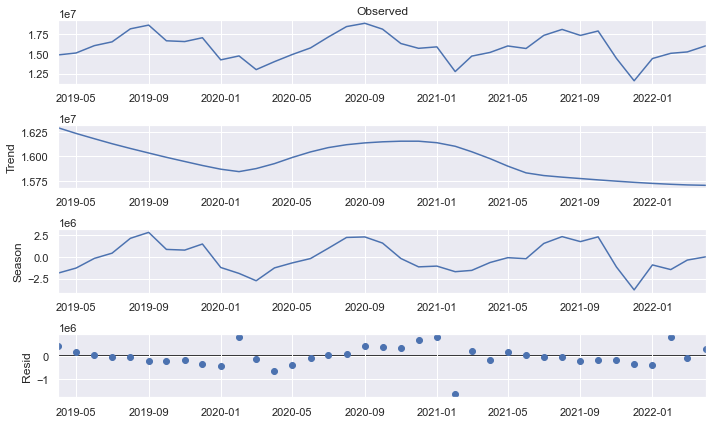

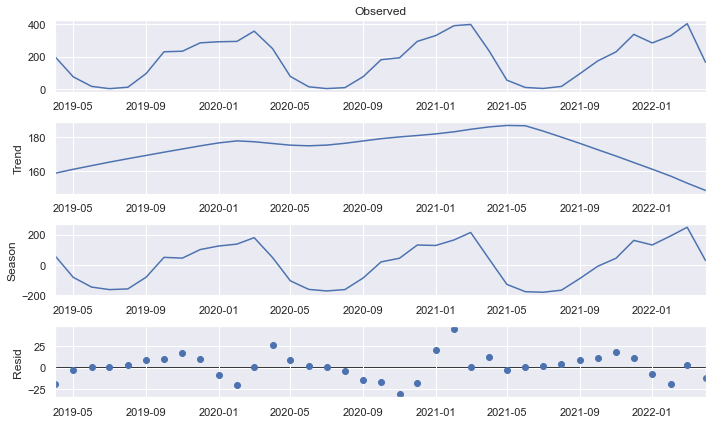

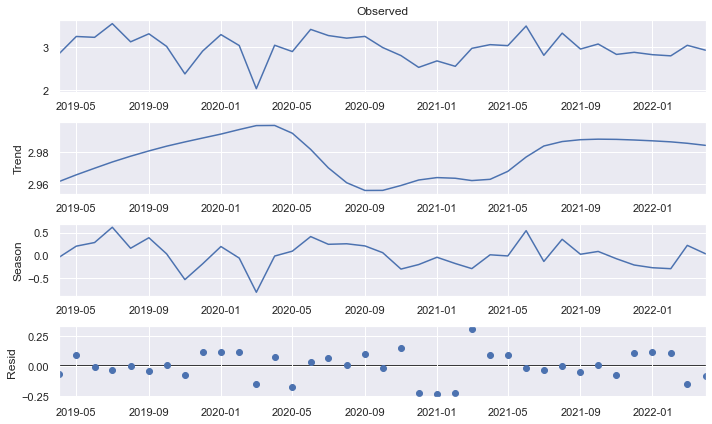

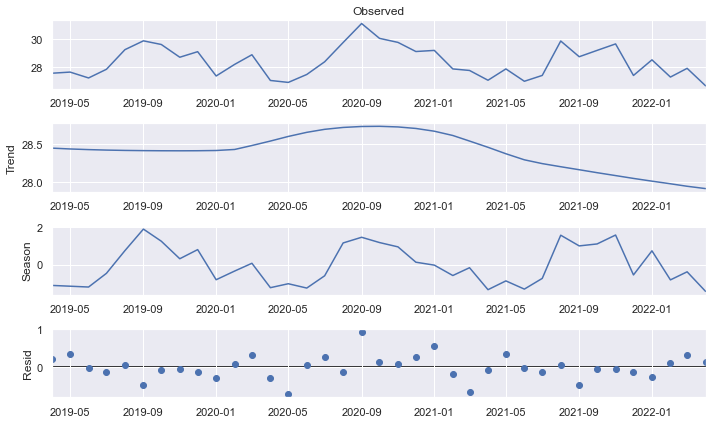

In [147]:
plot_ts_decompositions(ts_decomps, columns=['radiation', 'precipitation', 'pai', 'temperature'])

## Seasonal Decomposition for Polygon 6

In [149]:
ts_decomps = do_ts_decomposition(monthly_data, polygon_id=6, start_date=start_date, end_date=end_date, columns=['radiation', 'precipitation', 'pai', 'temperature'])

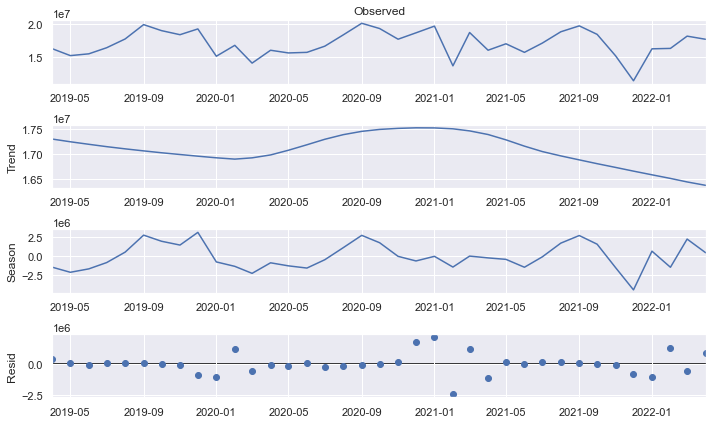

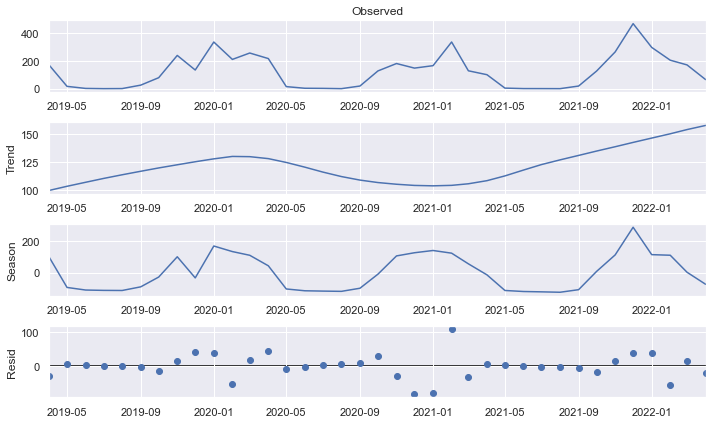

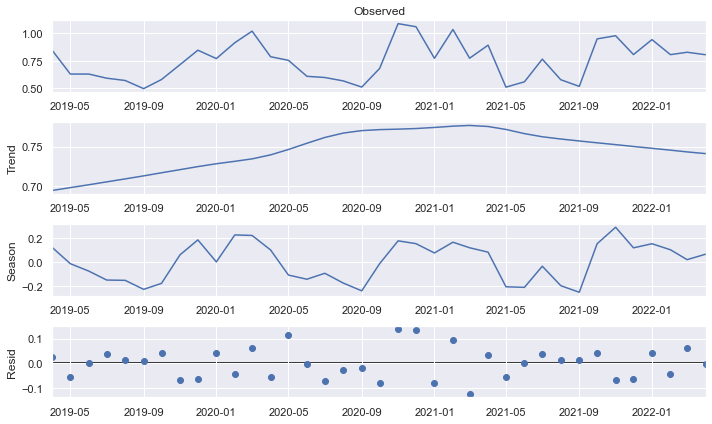

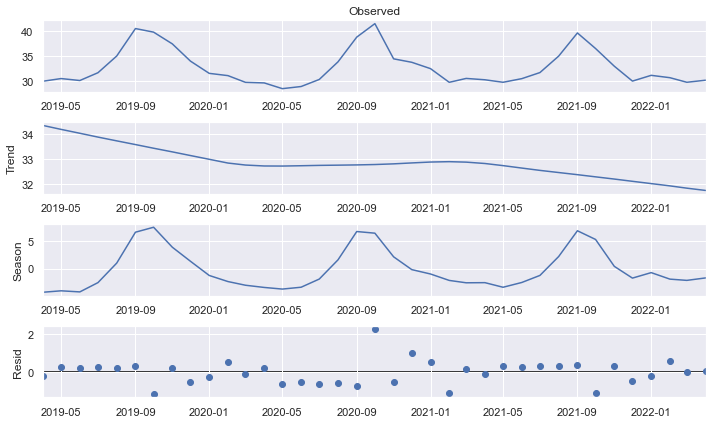

In [150]:
plot_ts_decompositions(ts_decomps, columns=['radiation', 'precipitation', 'pai', 'temperature'])

## Seasonal Decomposition for Polygon 7

In [152]:
ts_decomps = do_ts_decomposition(monthly_data, polygon_id=7, start_date=start_date, end_date=end_date, columns=['radiation', 'precipitation', 'pai', 'temperature'])

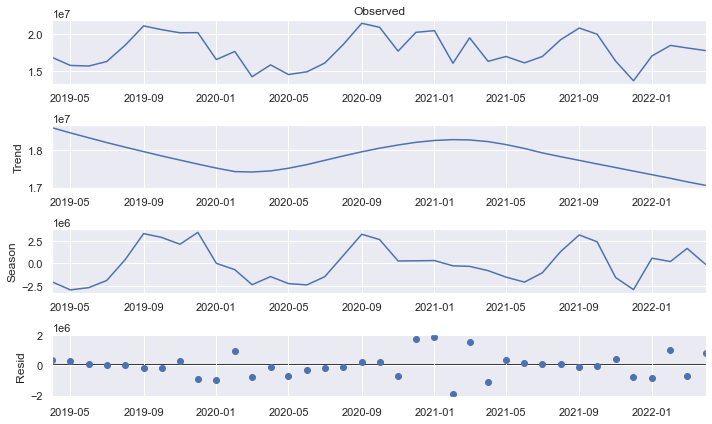

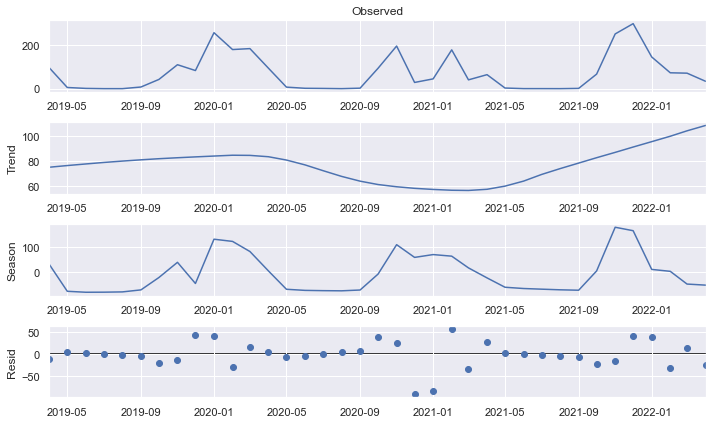

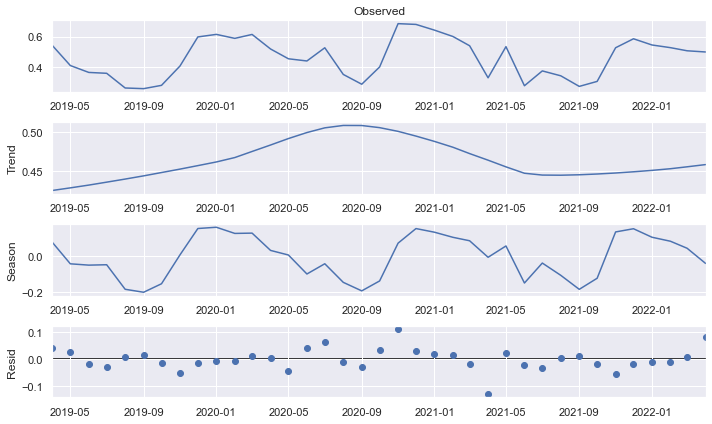

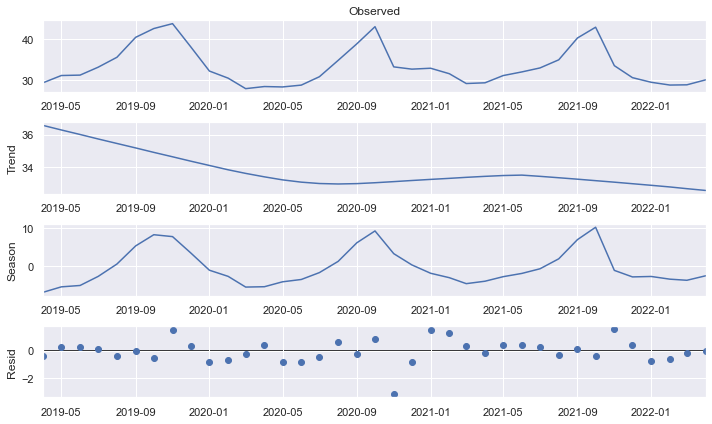

In [153]:
plot_ts_decompositions(ts_decomps, columns=['radiation', 'precipitation', 'pai', 'temperature'])

## Seasonal Decomposition for Polygon 8

In [154]:
ts_decomps = do_ts_decomposition(monthly_data, polygon_id=8, start_date=start_date, end_date=end_date, columns=['radiation', 'precipitation', 'pai', 'temperature'])

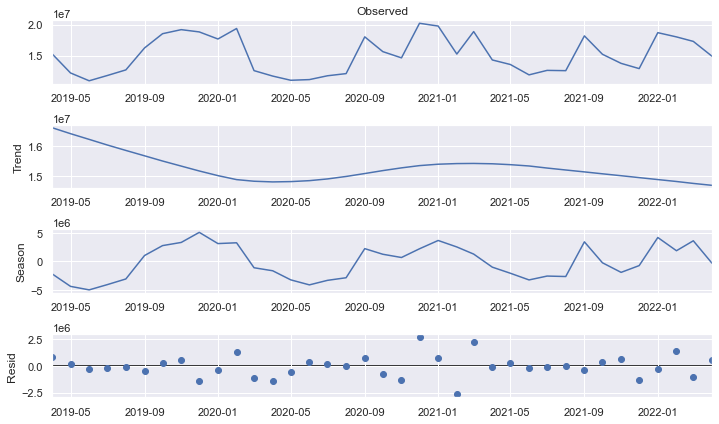

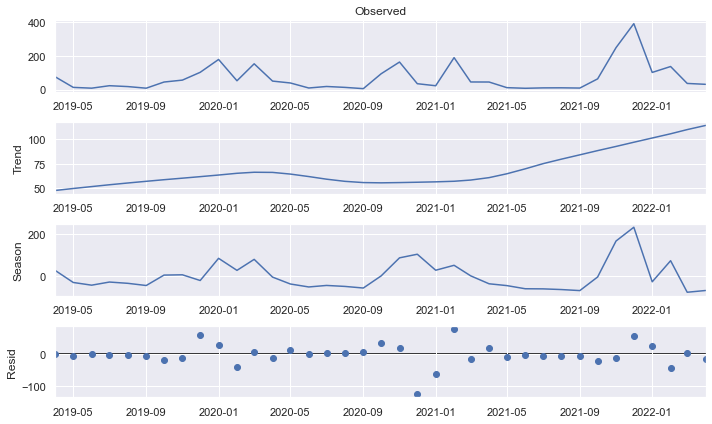

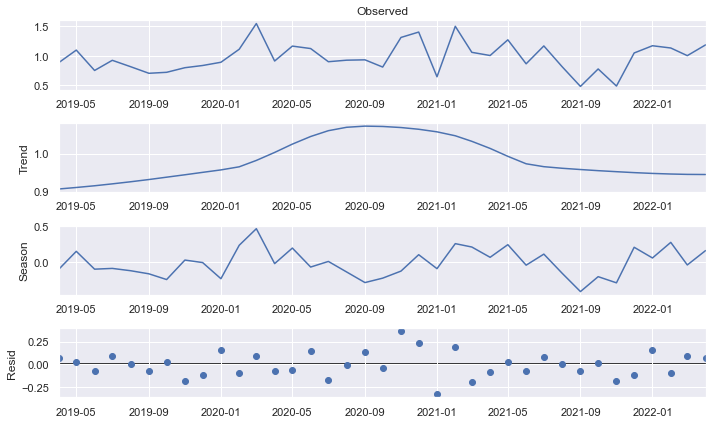

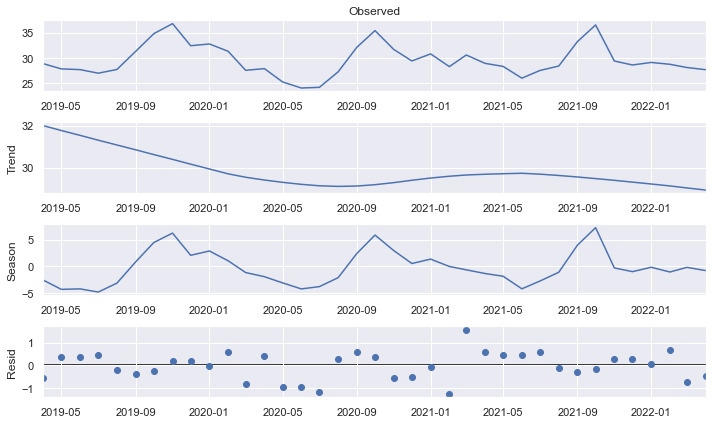

In [155]:
plot_ts_decompositions(ts_decomps, columns=['radiation', 'precipitation', 'pai', 'temperature'])